<h1><center> Explore data, to find the better model input </center></h1>

Full version, with all big plot

 ## Table of Contents

* [Study of the error itself](#part1)
    * [Display the error geographically every month](#part1_1)
* [Study of the links between the parameters](#part2)
    * [Correlation matrix between mean of parameters](#part2_1)
* [Study of the relationships between the error and the different data](#part3)
    * [Calculate the correlation of the error with each forcing](#part3_1)
        * [Correlation between each parameter (mean over time) and each PC of error's PCA](#part3_1_1)
        * [Correlation between parameters and error's time series in each geographical point](#part3_1_2)
    * [Basic statistic data about how values are distributed](#part3_2)
    * [Try to find similarities in the temporal evolution](#part3_3)
        * [Auto correlation](#part3_3_1)
        * [Cross correlation](#part3_3_2)

In [7]:
%load_ext autoreload
%autoreload 1
%reload_ext autoreload


%aimport src.utils.tardisml_utils

In [8]:
import xarray as xr
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA
import yaml
import pickle as pkl
import netCDF4 as nc4

import src.utils.load_config as load_config
import src.data_preparation.load_data as load_data
import src.feature_extraction.pca as feature_pca
import src.visualization.visualize_pca as visualize_pca
import src.visualization.visualize_error as visualize_error

import src.utils.tardisml_utils as tardisml_utils
rootdir = tardisml_utils.get_rootdir()
#import tardis_ml

fram detected
fram detected
fram detected
fram detected
fram detected


In [9]:
# Load configuration

# Date to plot in example
idate = 100
# Path to config file
file_config = '../config/data_proc_demo.yaml'
# Path to template file
file_template = '../config/template_name.yaml'

template = yaml.load(open(file_template),Loader=yaml.FullLoader)
nosit_dir, withsit_dir, covar_fields, forcing_bdir, pca_dir, res_dir, fig_dir, _ = load_config.load_filename(file_config)
timeofday, target_field, forcing_fields2, covar_fields, lim_idm, lim_jdm, n_comp = load_config.load_config_params(file_config)

config = yaml.load(open(file_config), Loader=yaml.FullLoader)
n_components = config['n_components']

In [10]:
# Get data and compute pcas, eofs

# Chronology
# (the same for all forcing fields, just take the first one)
df = pd.read_pickle(os.path.join(rootdir,forcing_bdir,f'mslprs.pkl'))
chrono = df[df.time%1==timeofday].date


# Load landmask
mskok1d, mskok = load_data.get_land_mask(lim_idm, lim_jdm, rootdir, pca_dir)


# Loading Target var PCA - No SIT assimilation¶
data_kind = "nosit"
n_components = load_config.get_n_components(data_kind, file_config)
filename = os.path.join(rootdir,pca_dir,f"pca_{target_field}_{n_components}N_noSITass.pkl")
pca_f = load_data.load_pca(filename)

# load X, mu, RMSE
filename = os.path.join(rootdir,pca_dir,f"{target_field}_forecast_noSITass.nc")
Xf, mu_f, RMSE_f = load_data.load_nc(filename, target_field)

# retrieve PC and EOF values
PCs_f = feature_pca.pca_to_PC(pca_f, Xf, mskok1d)
EOF1d_f, EOF2d_f = feature_pca.compute_eof(n_components, Xf, pca_f, mskok)

# Reconstruction from PCA
Xf_rec = xr.dot(EOF2d_f,PCs_f) + mu_f
# RMSE for comparison with RMSE predicted by ML
#RMSE_recf = np.sqrt((np.square(Xf_rec-Xf)).mean(dim='rdim'))


# Loading Target var PCA - No SIT assimilation¶
data_kind = "withsit"
n_components = load_config.get_n_components(data_kind, file_config)
filename = os.path.join(rootdir,pca_dir,f"pca_{target_field}_{n_components}N_SITass.pkl")
pca_a = load_data.load_pca(filename)

# load X, mu, RMSE
filename = os.path.join(rootdir,pca_dir,f"{target_field}_forecast_SITass.nc")
Xa, mu_a, RMSE_a = load_data.load_nc(filename, target_field)

# retrieve PC and EOF values
PCs_a = feature_pca.pca_to_PC(pca_a, Xa, mskok1d)
EOF1d_a, EOF2d_a = feature_pca.compute_eof(n_components, Xa, pca_a, mskok)
# Reconstruction from PCA
Xa_rec = xr.dot(EOF2d_a,PCs_a) + mu_a
# RMSE for comparison with RMSE predicted by ML
#RMSE_reca = np.sqrt((np.square(Xa_rec-Xa)).mean(dim='rdim'))


# Loading error of Target var PCA SIT assimilation - no assimilation
data_kind = "withsit"
n_components = load_config.get_n_components(data_kind, file_config)
filename = os.path.join(rootdir,pca_dir,f"pca_{target_field}_{n_components}N_SITerr.pkl")
pca_e = load_data.load_pca(filename)
# load X, mu, RMSE
filename = os.path.join(rootdir,pca_dir,f"{target_field}_forecast_SITerr.nc")
Xe, mu_e, RMSE_e = load_data.load_nc(filename, target_field)

# retrieve PC and EOF values
PCs_e = feature_pca.pca_to_PC(pca_e, Xe, mskok1d)
EOF1d_e, EOF2d_e = feature_pca.compute_eof(n_components, Xe, pca_e, mskok)

# Reconstruction from PCA
Xe_rec = xr.dot(EOF2d_e,PCs_e) + mu_e
# RMSE for comparison with RMSE predicted by ML
#RMSE_rece = np.sqrt((np.square(Xe_rec-Xe)).mean(dim='rdim'))

Load PCA: /nird/projects/nird/NS2993K/Calliope/results/pca_i200-600_j600-881/pca_hice00_8N_noSITass.pkl

Load PCA: /nird/projects/nird/NS2993K/Calliope/results/pca_i200-600_j600-881/pca_hice00_8N_SITass.pkl

Load PCA: /nird/projects/nird/NS2993K/Calliope/results/pca_i200-600_j600-881/pca_hice00_8N_SITerr.pkl



In [11]:
import src.feature_extraction.pca as feature_pca
data_dir = nosit_dir
list_files = feature_pca.missing_file(chrono, data_dir, template)
nc_f = xr.open_mfdataset(list_files, combine='nested', concat_dim='rdim')

# Load covariables 1t
nc1 = xr.open_dataset(os.path.join(rootdir, withsit_dir, 'TP4DAILY_2014_000.nc'))

In [12]:
#Load forcing values
forcing_fields = ["airtmp", "dewpt", "mslprs", "nlwrad", "nswrad", "precip", "radflx", "shwflx", "vapmix", "wndewd", "wndnwd"]
forcing_fields = [f + "_mean21d" for f in forcing_fields]
forcings = dict()
filepath = '/nird/projects/nird/NS2993K/Calliope/forcings/'
for field in forcing_fields:
    forcings[field] = np.load(f'{filepath}{field}.npy')
Nf = len(forcing_fields) # Number of forcing fields

In [13]:
covar_fields = ['ssh00',
 'fice00',
 'hice00',
 'hsnw00',
 'htndncy00',
 'albedo00',
 'emnp00',
 'salflx00',
 'spdice00',
 'surflx00',
 'surflxs00',
 'swflx00',
 #'sstb00',
 #'msshb00',
 'saln01',
 'temp01',
 'kinetic01',
 'taux00',
 'tauy00',
 'tauxi00',
 'tauyi00',
 'ubavg00',
 'vbavg00',
 'uice00',
 'vice00',
 'utot01',
 'vtot01']

In [14]:
# Loading covariable PCA - noSIT assimilation
data_kind = "covariable"
n_components = load_config.get_n_components(data_kind, file_config)
PCs_co = load_data.load_covariables(covar_fields, mskok1d, pca_dir, n_components)

# Loading forcings PCA
data_kind = "forcing"
filename='/nird/projects/nird/NS2993K/Calliope/results/pca_i200-600_j600-881/pca_airtmp-dewpt-mslprs-nlwrad-nswrad-precip-radflx-shwflx-vapmix-wndewd-wndnwd_8N_21d.pkl'
#filename = load_config.get_pca_filename(data_kind, file_config, pca_dir)
PCs, EOFs = load_data.load_forcing_PC_EOF(filename, forcing_bdir, forcing_fields)

Retrieve ssh00
Load PCA: /nird/projects/nird/NS2993K/Calliope/results/pca_i200-600_j600-881/pca_ssh00_8N_noSITass.pkl

Retrieve fice00
Load PCA: /nird/projects/nird/NS2993K/Calliope/results/pca_i200-600_j600-881/pca_fice00_8N_noSITass.pkl

Retrieve hice00
Load PCA: /nird/projects/nird/NS2993K/Calliope/results/pca_i200-600_j600-881/pca_hice00_8N_noSITass.pkl

Retrieve hsnw00
Load PCA: /nird/projects/nird/NS2993K/Calliope/results/pca_i200-600_j600-881/pca_hsnw00_8N_noSITass.pkl

Retrieve htndncy00
Load PCA: /nird/projects/nird/NS2993K/Calliope/results/pca_i200-600_j600-881/pca_htndncy00_8N_noSITass.pkl

Retrieve albedo00
Load PCA: /nird/projects/nird/NS2993K/Calliope/results/pca_i200-600_j600-881/pca_albedo00_8N_noSITass.pkl

Retrieve emnp00
Load PCA: /nird/projects/nird/NS2993K/Calliope/results/pca_i200-600_j600-881/pca_emnp00_8N_noSITass.pkl

Retrieve salflx00
Load PCA: /nird/projects/nird/NS2993K/Calliope/results/pca_i200-600_j600-881/pca_salflx00_8N_noSITass.pkl

Retrieve spdice00
Lo

In [18]:
test.shape

(1461, 280, 400)

### Util functions

In [9]:
# get index of non NaN values
sel = nc1["hice00"].sel(jdim=slice(*lim_jdm),idim=slice(*lim_idm)).mean(dim='rdim').values
index_mask = np.argwhere(~np.isnan(sel)).T

In [10]:
def apply_mask_nonan(X, index_mask):
    X = X[tuple(index_mask)]
    return X

def get_area(data, lim_idm, lim_jdm, exclude=[], index_mask=[]):
    """ Keep only data for given geographical zone
    In:
        data        : dict or xarray.core.dataset.Dataset -- Data to process
        lim_idm     : tuple                               -- limits of the geographical area to be preserved (following axes x)
        lim_jdm     : tuple                               -- limits of the geographical area to be preserved (following axes y)
        index_mask : numpy.ndarray                       -- for forcings : index of no nan value to keep 
        
    Out:
        X_sel       : dict -- key = field name, value = (y, x) array, data array restricted to the given geographical area and mean over time
        X_sel_nonan : dict -- same than Xm_sel without NaN values
    """
    
    if type(data) is dict:
        fields = [f for f in data.keys() if f not in exclude]
    else:
        fields = [f for f in data.data_vars if f not in exclude]

    X_sel = dict()
    X_sel_nonan = dict()
    t = data[fields[0]].shape[0]
    n = index_mask.shape[1]
    
    for field in fields:
        if type(data) is dict:
            # TODO : geographical zone uncheck
            X_sel[field] = data[field]
            X_sel_nonan[field] = np.empty([t, n])
            for t in range(t):
                X_sel_nonan[field][t] = apply_mask_nonan(X_sel[field][t], index_mask)
        else:
            X_sel[field] = data[field].sel(jdim=slice(*lim_jdm),idim=slice(*lim_idm)).values
            X_sel_nonan[field] = X_sel[field][np.isfinite(X_sel[field])]

    return X_sel, X_sel_nonan

In [11]:
exclude = ["longitude", "latitude", "dx", "dy", "fyear", "depth"]

# select geographical area
X_sel_cov, X_sel_nonan_cov = get_area(nc_f, lim_idm, lim_jdm, exclude, index_mask)
_, X_sel_nonan_fgs = get_area(forcings, lim_idm, lim_jdm, exclude, index_mask)

In [12]:
def zone_mean_data(data_sel, exclude=[], index_mask=[]):
    """ Keep only data for given geographical zone + if several times keep only the mean
    In:
        data_sel   : dict or xarray.core.dataset.Dataset -- Data to process
        exclude    : String list                         -- data field to exclude
        index_mask : numpy.ndarray                       -- for forcings : index of no nan value to keep 
        
    Out:
        Xm_sel       : dict -- key = field name, value = (y, x) array, mean over time
        Xm_sel_nonan : dict -- same than Xm_sel without NaN values
    """
    
    if type(data_sel) is dict:
        fields = [f for f in data_sel.keys() if f not in exclude]
    else:
        fields = [f for f in data_sel.data_vars if f not in exclude]

    Xm_sel = dict()
    Xm_sel_nonan = dict()
    
    for field in fields:
        if type(data_sel) is dict:
            Xm_sel[field] = np.mean(data_sel[field], axis=0)
            Xm_sel_nonan[field] = Xm_sel[field][tuple(index_mask)]
        elif data_sel.dims["rdim"] > 1:
            Xm_sel[field] = data_sel[field].mean(dim='rdim').values
            Xm_sel_nonan[field] = Xm_sel[field][np.isfinite(Xm_sel[field])]
        else:
            Xm_sel[field] = data_sel[field].values
            Xm_sel_nonan[field] = Xm_sel[field][np.isfinite(Xm_sel[field])]

    return Xm_sel, Xm_sel_nonan

In [13]:
# compute temporal mean for each dataset, 
#Xm_sel_1, Xm_sel_nonan_1 = zone_mean_data(nc1)
Xm_sel_cov, Xm_sel_nonan_cov = zone_mean_data(X_sel_cov)
Xm_sel_fgs, Xm_sel_nonan_fgs = zone_mean_data(forcings, index_mask=index_mask)

# Study of the error itself <a class="anchor" id="part1"></a>
  Search for seasonality

##  Display the error geographically every month <a class="anchor" id="part1_1"></a>

In [12]:
def plot_monthly(Xf, Xa, Xe, target_field, month, years):
    """ Plot for a given month and year the given models
    In:
        Xf           : forecast 
        Xa           : assimilation
        Xe           : error
        target_field : 
        month        : 
        years        :
    """
    if Xf is not None:
        fig, ax = plt.subplots(ncols=3, figsize=(16,4))
        
        Xf.plot(ax=ax[0], vmax=4)
        Xa.plot(ax=ax[1], vmax=4)
        Xe.plot(ax=ax[2], vmin=-1.5, vmax=1.5, cmap=plt.get_cmap('coolwarm'));
        ax[0].set_title('Forecast')
        ax[1].set_title(f'SIT assimilated')
        ax[2].set_title('A - F')
        fig.suptitle(f'{target_field} for month {month}, {years[0]}-{years[-1]}');
        plt.show()
        
    else:
        fig, ax = plt.subplots(ncols=len(Xe), figsize=(14,3))

        for i, v in enumerate(Xe):
            v.plot(ax=ax[i], vmin=-1.5, vmax=1.5, cmap=plt.get_cmap('coolwarm'));
            ax[i].set_title(f'Year {i+years[0]}')
        fig.suptitle(f'{target_field} for month {month}');
        plt.show()
        
        
        
        
def plot_error_monthly(chrono, Xf, Xa, Xe, doMean):
    """ Plot the error monthly, for each year, or for the mean of each month over all years
    In:
        chrono 
        Xf
        Xa
        Xe
        doMean : boolean -- if true, plot the mean over all year (12 plots), else for each year (12*nb_year plots)
    """
    # Identify months and years
    time = pd.DataFrame([chrono.values]).transpose()
    time['month'] = time[0].dt.month
    if not doMean:
        time['year'] = time[0].dt.year
    time.drop(0, axis=1, inplace=True)
    years = np.unique(chrono.values.astype('datetime64[Y]').astype(int) + 1970)
    
    Xf_mt = [None for i in range(12)]
    Xa_mt = [None for i in range(12)]
    Xe_mt = [None for i in range(12)]
    X_mt = dict()

    for month in range(1, 13):
        if doMean: 
            idx = time.index.where((time['month']==month))
            idx = idx.dropna().astype(int)  # integer without nan
            
            # compute means (mt for mean temporal)
            index = month-1
            Xf_mt[index] = np.mean(Xf.isel(rdim=idx.values),axis=(0))
            Xa_mt[index] = np.mean(Xa.isel(rdim=idx.values),axis=(0))
            Xe_mt[index] = np.mean(Xe.isel(rdim=idx.values),axis=(0))

            plot_monthly(Xf_mt[index], Xa_mt[index], Xe_mt[index], "hice00", month, years)
            
        else:
            print(f"\n \n MONTH {month}")
            X_mt[month] = [None for i in years]
            for year in years:
                idx = time.index.where((time['month']==month) & (time['year']==year))
                idx = idx.dropna().astype(int)  # integer without nan

                # compute means (mt for mean temporal)
                X_mt[month][year-2014] = np.mean(Xe.isel(rdim=idx.values),axis=(0))
              
            plot_monthly(None, None, X_mt[month], "hice00", month, years)
            X_mt[month] = np.array(X_mt[month])
            
    return  np.array(Xf_mt), np.array(Xa_mt), np.array(Xe_mt), X_mt

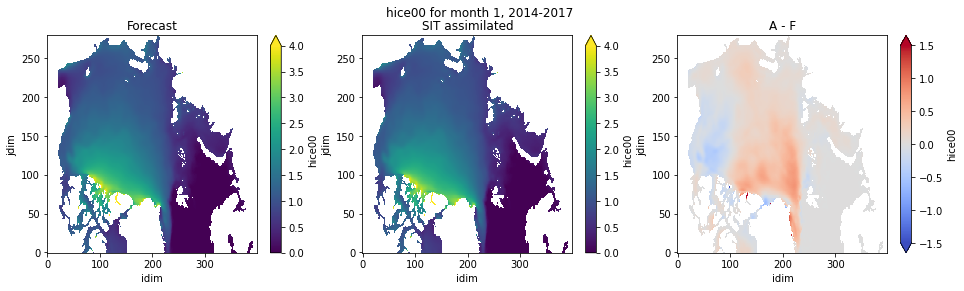

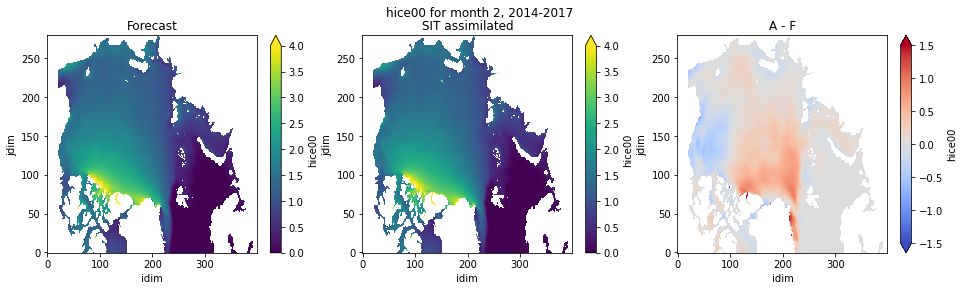

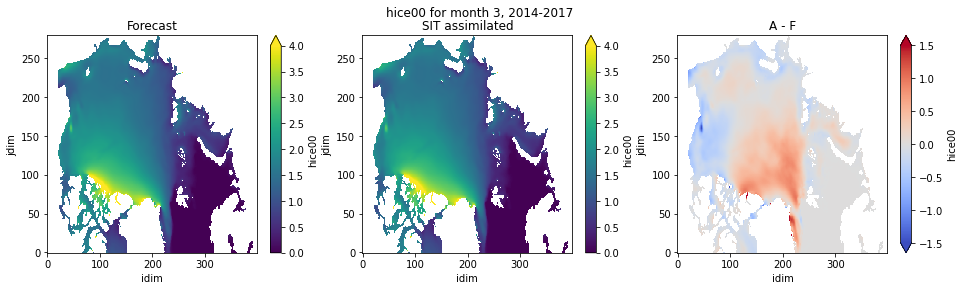

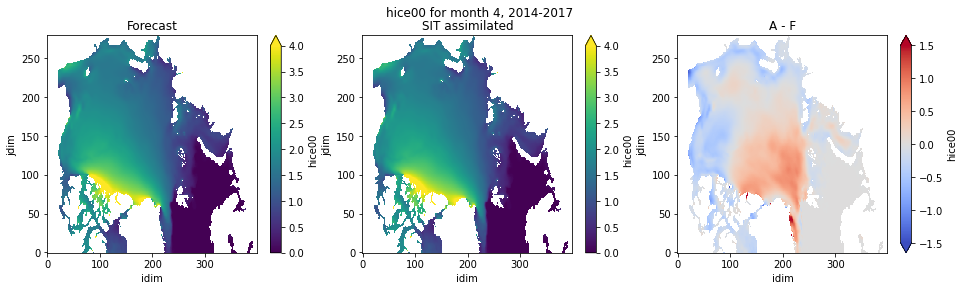

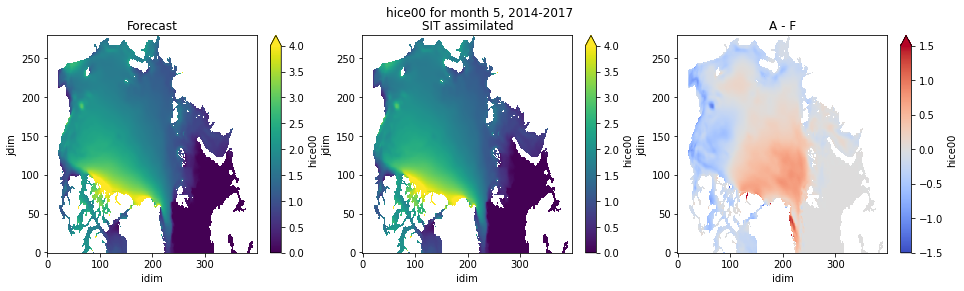

...

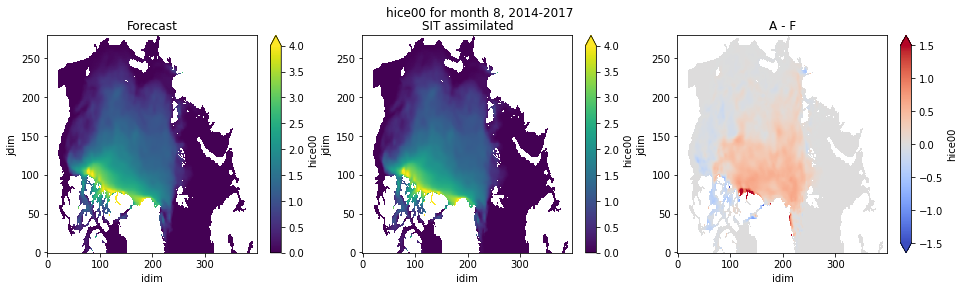

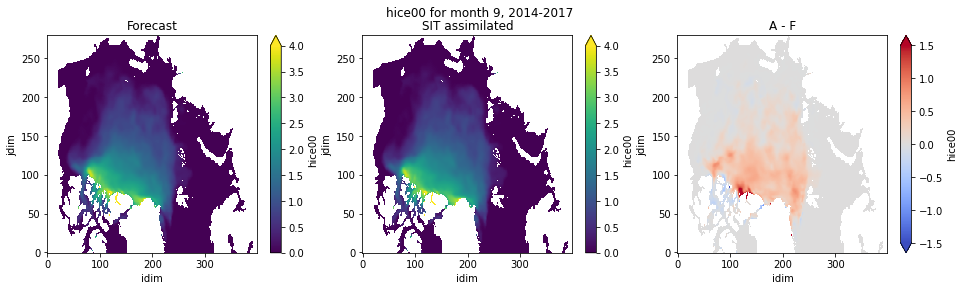

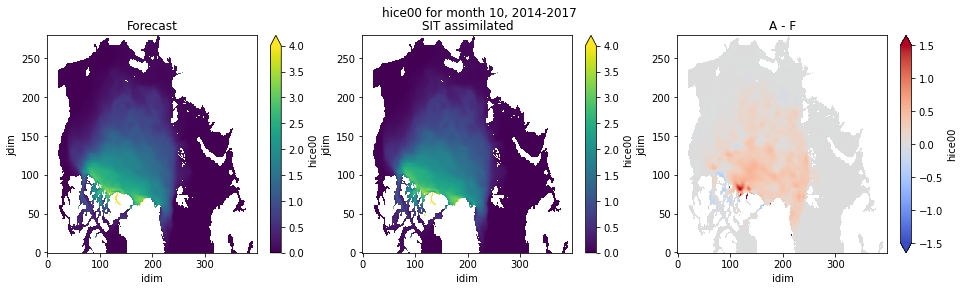

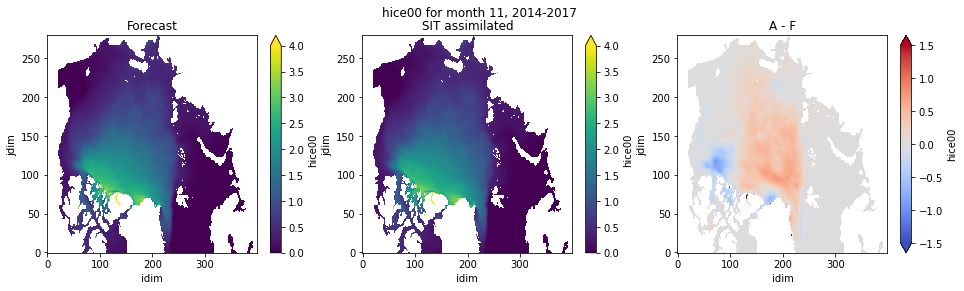

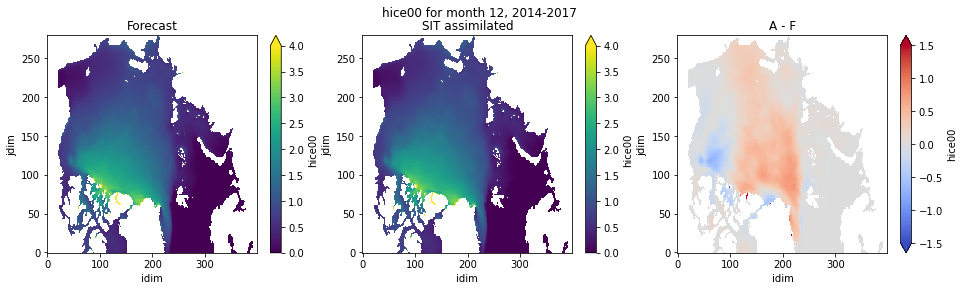

In [13]:
# Display the error geographically each month, average per month over the 4 years
Xf_mt, Xa_mt, Xe_mt, _ = plot_error_monthly(chrono, Xf, Xa, Xe, True)


 
 MONTH 1


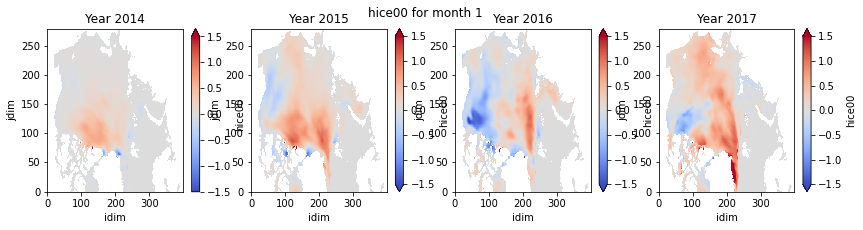


 
 MONTH 2


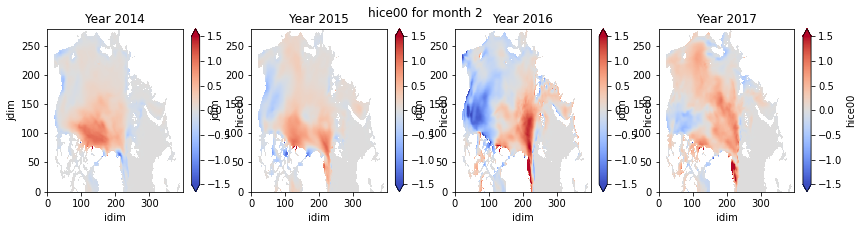


 
 MONTH 3


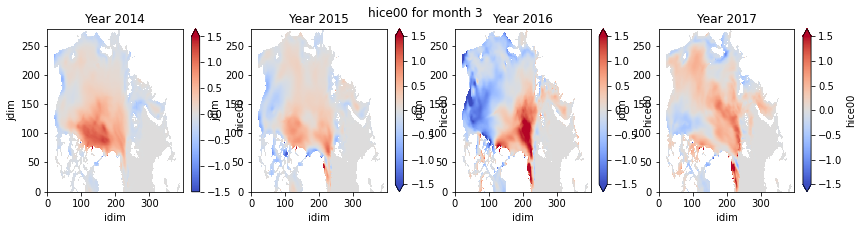


 
 MONTH 4


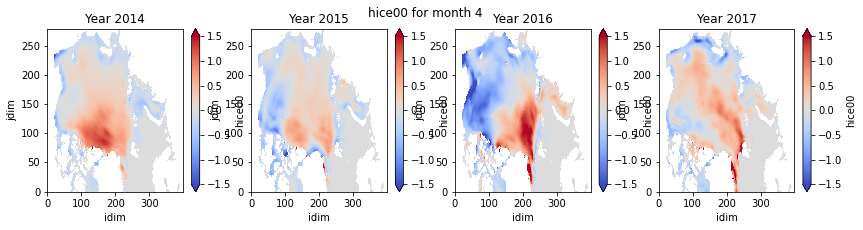


 
 MONTH 5


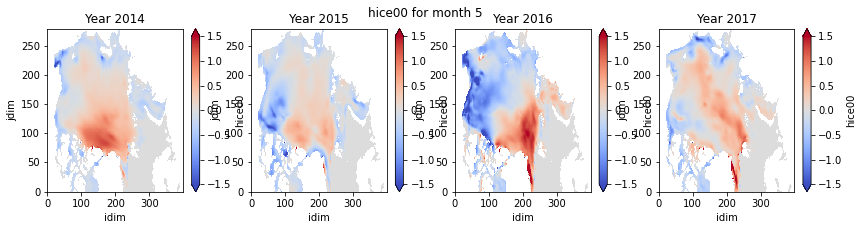


 
 MONTH 6


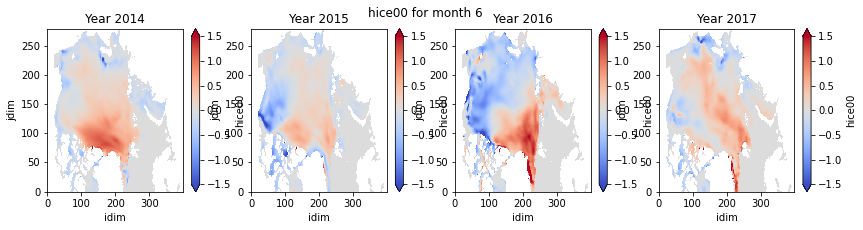


 
 MONTH 7


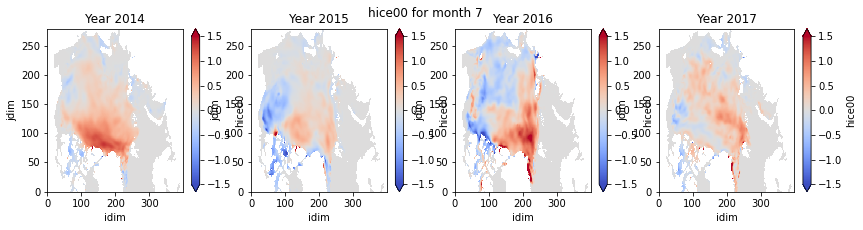


 
 MONTH 8


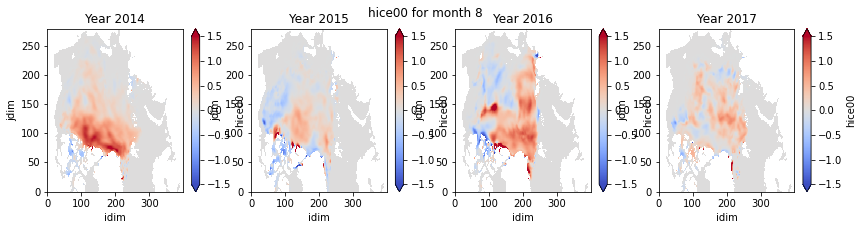


 
 MONTH 9


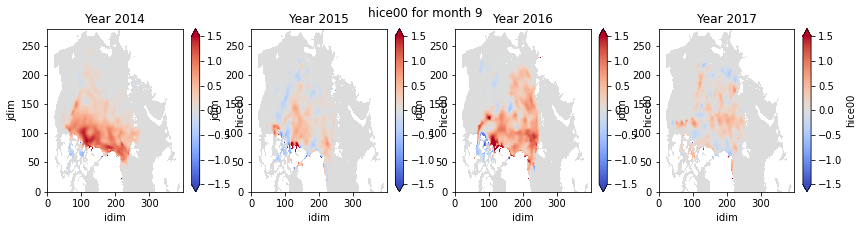


 
 MONTH 10


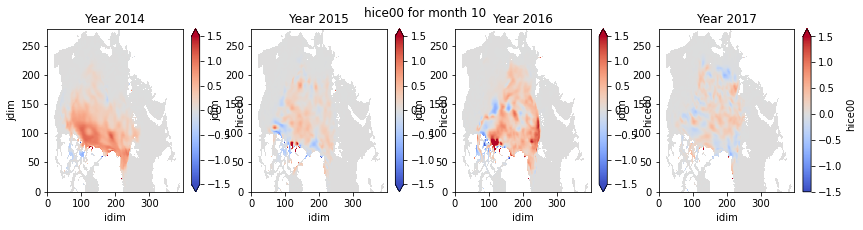


 
 MONTH 11


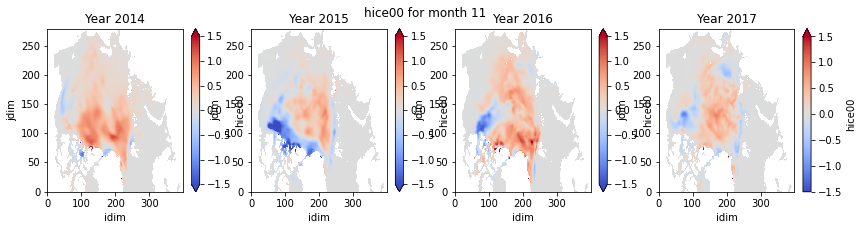


 
 MONTH 12


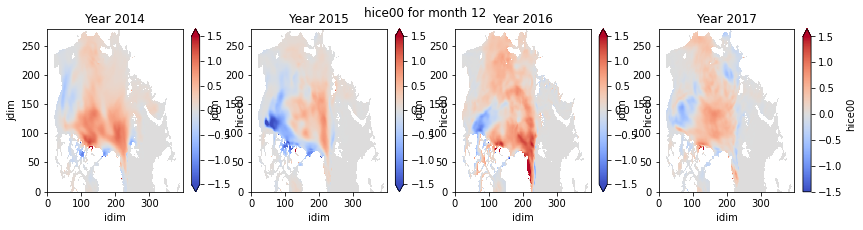

In [14]:
# Display the error geographically each month of each year
_, _, _, X_mt = plot_error_monthly(chrono, None, None, Xe, False)

# Study of the links between the parameters <a class="anchor" id="part2"></a>

If some are highly correlated, they may be redundant and giving them all overloads the model

### Correlation matrix between mean of parameters <a class="anchor" id="part2_1"></a>

In [15]:
def plot_correlation_matrix(data, title=''):
    """ Plot the correlation matrix for the given data
    In:
        data : 2D data for several parameters
            Can take 2 types :
            -> xarray.core.dataset.Dataset with rdim = 1
            -> dict with keys = fields name and values = 2D values
    """
    if type(data) == dict:
        Xm_sel_1D = {k: v.flatten() for k, v in data.items()} # 2D to 1D
        nc_pd = pd.DataFrame.from_dict(Xm_sel_1D)
        fields = data.keys()
    else:
        nc_pd = data.to_dataframe()
        fields = [f for f in data.data_vars]
       
    corr_matrix = nc_pd.corr()

    fig = plt.figure(figsize=(int(0.5*len(fields)), int(0.40*len(fields))))
    plt.matshow(corr_matrix, fignum=fig.number, cmap=plt.cm.Blues)
    plt.xticks(range(len(fields)), fields, rotation= -45)
    plt.yticks(range(len(fields)), fields)
    plt.title(f'Correlation matrix {title}')
    

    for i in range(len(corr_matrix)):
        for j in range(len(corr_matrix)):
            c = corr_matrix.values[j, i]

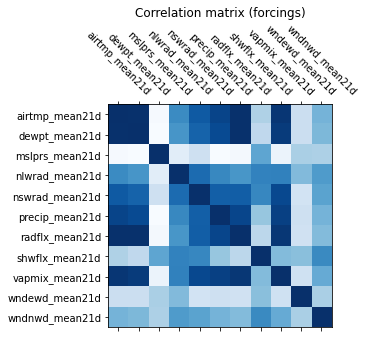

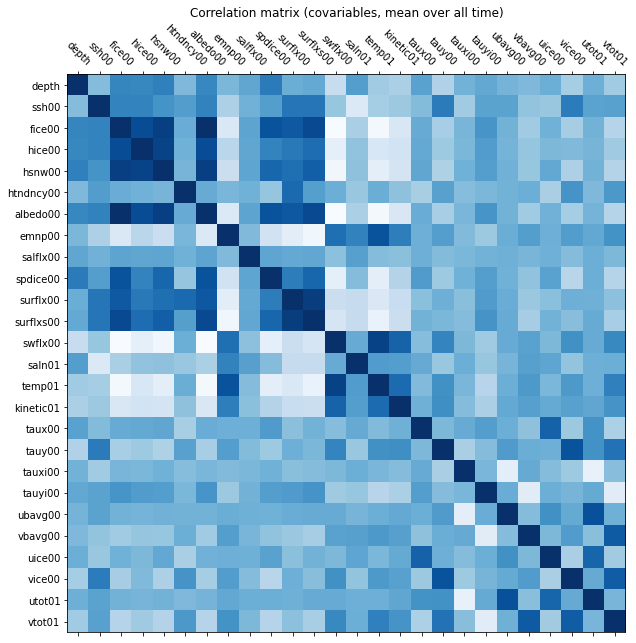

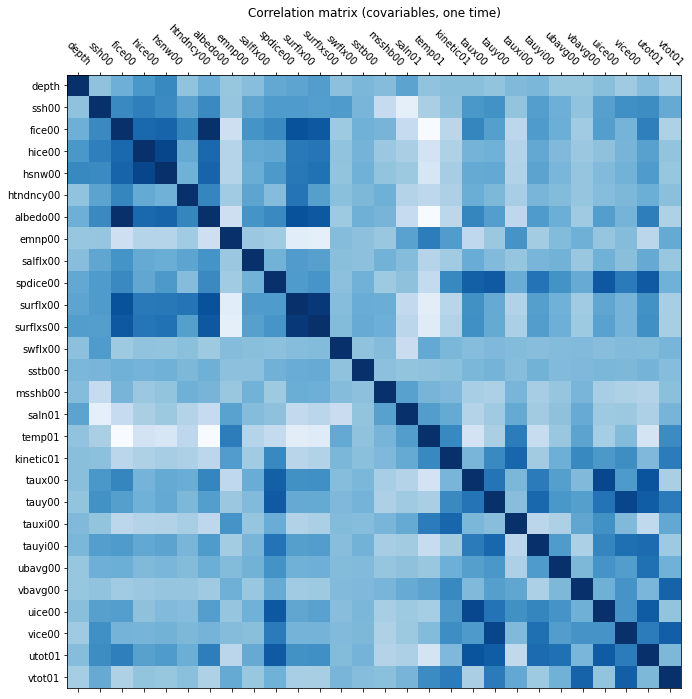

In [17]:
# forcings 
plot_correlation_matrix(Xm_sel_fgs, "(forcings)")

# covariables, mean all times
plot_correlation_matrix(Xm_sel_cov, "(covariables, mean over all time)")

# covariables, one time
plot_correlation_matrix(Xm_sel_1, "(covariables, one time)")

# Study of the relationships between the error and the different data <a class="anchor" id="part3"></a>

Find the most appropriate data to give as input to the model

Different data :
- covariables
- forcings
- theirs pca (how many components ? For each parameter or for a mean over several of them ?)

## Calculate the correlation of the error with each parameter <a class="anchor" id="part3_1"></a>

Use the error's pca and analyze for the reals values of each covariables and forcing

### Correlation between each parameter (mean over time) and each PC of error's PCA <a class="anchor" id="part3_1_1"></a>

In [24]:
def compute_correlation(X, pca):
    """ Compute the correlation between each field of X and each PC of pca
    In:
        X   : dict                           -- parameters data (1D without NaN values)
        pca : sklearn.decomposition._pca.PCA -- pca to compare with
    Out:
        cor : dict of numpy.ndarray -- dict where key is field name, containing n_component elements corresponding to correlations values
    """
    
    fields = X.keys()
    comp = pca.components_

    cor = dict()
    for field in fields:
        cor[field] = np.empty([len(comp[:, 0])])
        for pc in range(len(comp[:, 0])):
            cor[field][pc] = np.corrcoef(comp[pc], X[field])[0][1] #take 1 elem as it's sympetric + autocorrelation==1
    return cor




def compute_pcs_correlation(PCs, PCs_params):
    """ Same than compute_correlation, but bteween 2 PCs
    In:
        PCs        : xarray.core.dataarray.DataArray         -- PCs shape (n, nb_comp)
        PCs_params : dict of xarray.core.dataarray.DataArray -- PCs for each field, shape (n, nb_comp)
    Out:
        cor : dict of numpy.ndarray -- dict where key is field name, containing n_component elements corresponding to correlations values
    """
    
    fields = PCs_params.keys()
    ncomp = PCs.shape[1]

    cor = dict()
    for field in fields:
        cor[field] = np.empty(ncomp)
        for pc in range(ncomp):
            cor[field][pc] =  np.corrcoef(PCs[:, pc], PCs_params[field][:, pc])[0][1] #take 1 elem as it's sympetric + autocorrelation==1
    return cor

In [45]:
def plot_correlation_pca(cor, title=''):
    """ Plot the correlation between each parameters of nc with pca
    In:
        cor    : numpy.ndarray -- 2D array, (n_component, field) with correlations values
    """
    
    fields = list(cor.keys())
    n = cor[fields[0]].shape[0]

    for pc in range(n):
        fig, ax = plt.subplots(figsize=(int(0.5*len(fields)),6))
        plt.bar(x=np.arange(len(fields)), height=list(map(abs, [cor[f][pc] for f in fields])))
        plt.xticks(range(len(fields)), fields, rotation= -25)
        plt.ylabel('Correlation value (abs)')
        plt.title(f'Correlation with PC {pc+1} {title}')

In [58]:
# Compute correlation between data temporal mean and error's PCs
cor_mt_fgs = compute_correlation(Xm_sel_nonan_fgs, pca_e)
cor_mt_cov = compute_correlation(Xm_sel_nonan_cov, pca_e)

# Compute correlation between error and parameters' PCs
cor_pcs_cov = compute_pcs_correlation(PCs_e, PCs_co)
cor_pcs_fgs = compute_pcs_correlation(PCs_e, PCs)

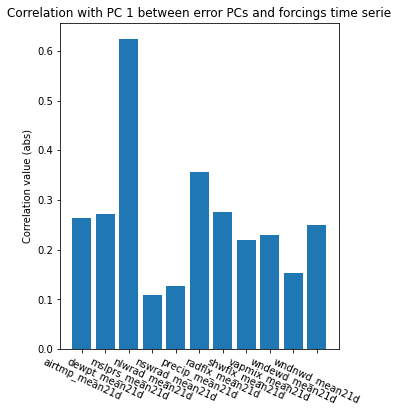

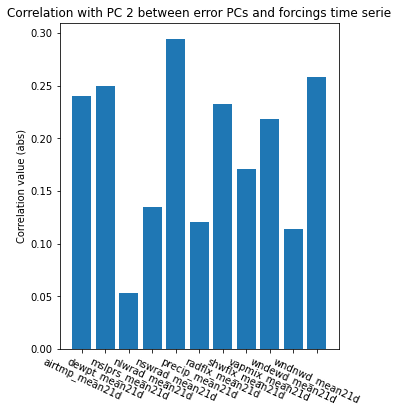

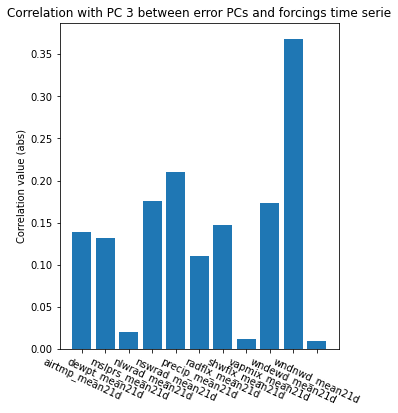

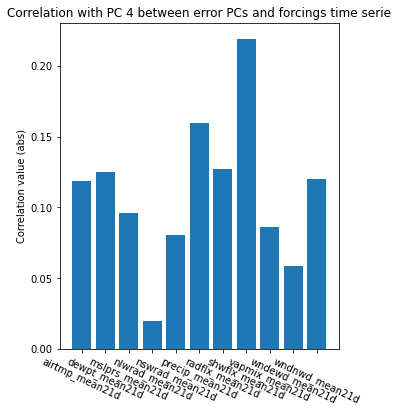

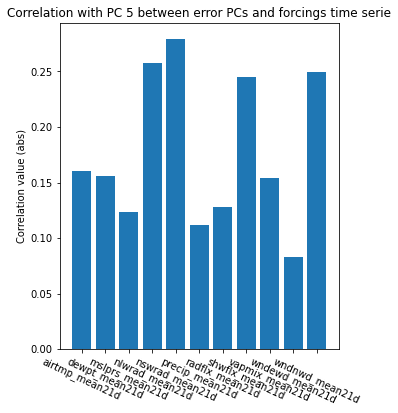

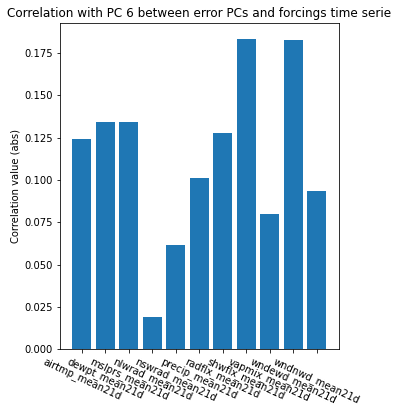

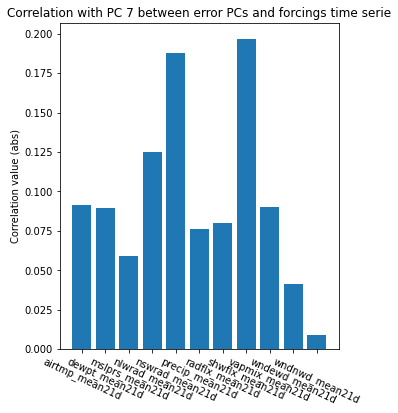

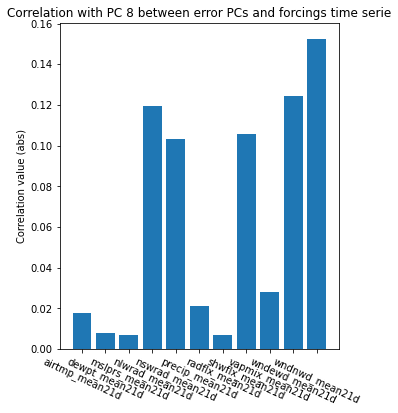

In [46]:
plot_correlation_pca(cor_mt_fgs, title='between error PCs and forcings time serie')

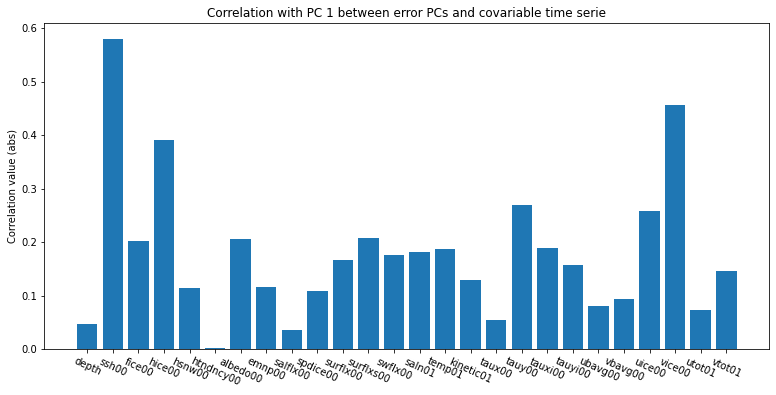

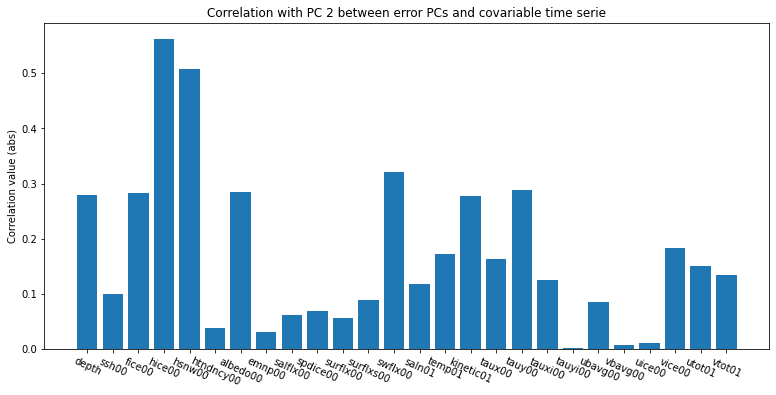

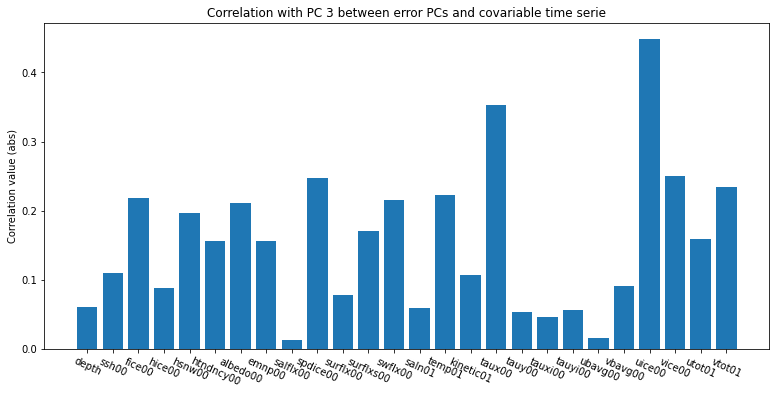

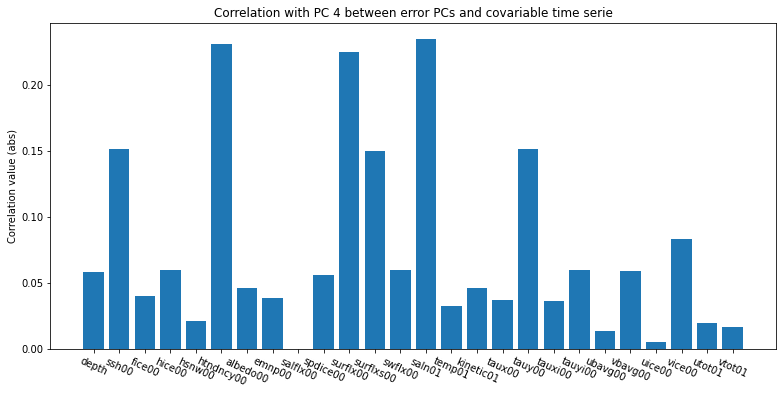

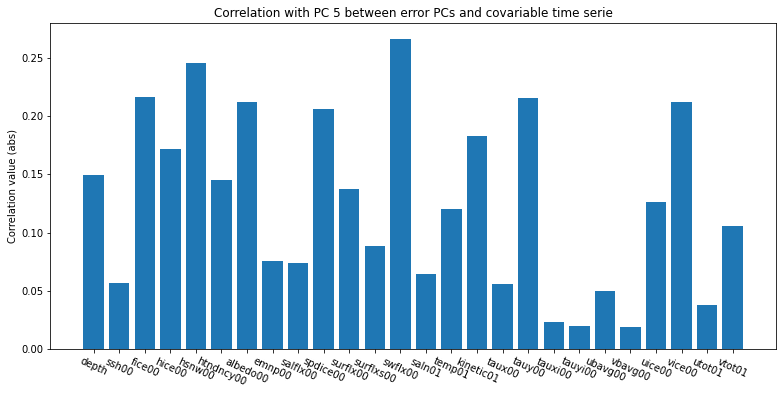

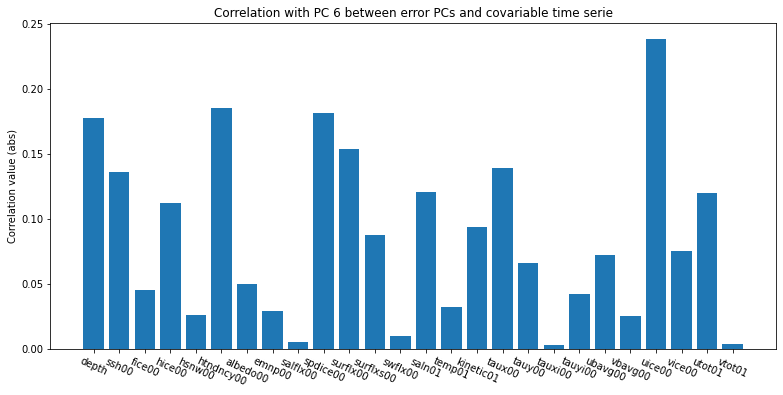

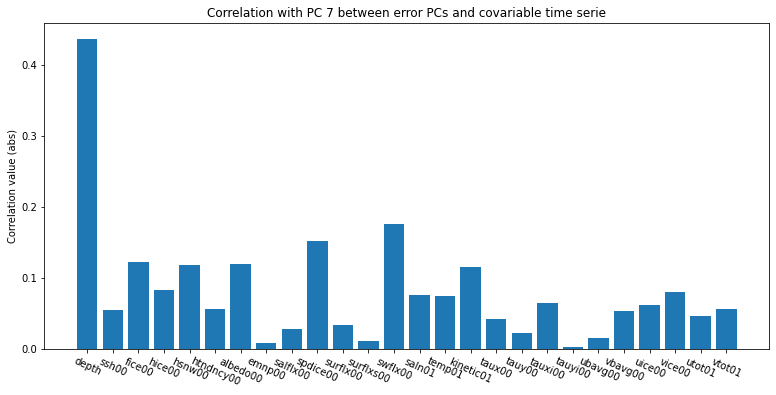

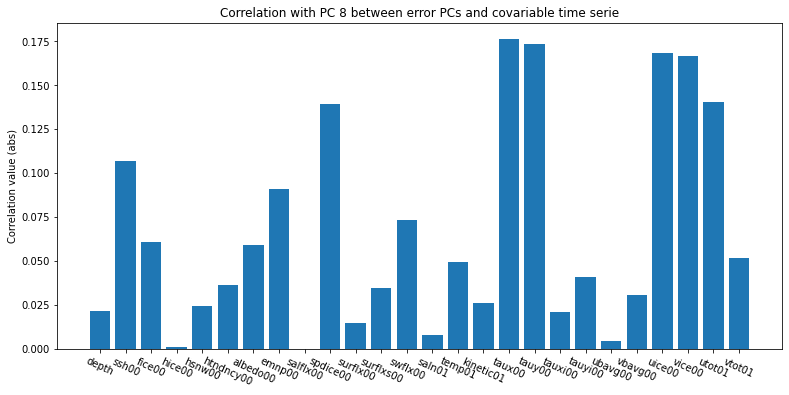

In [47]:
#filepath = "/nird/projects/nird/NS2993K/Calliope/figs/PCAe_param_meanTime_correlation/covariables"
plot_correlation_pca(cor_mt_cov, title='between error PCs and covariable time serie')

### Correlation between error and each parameter PCs

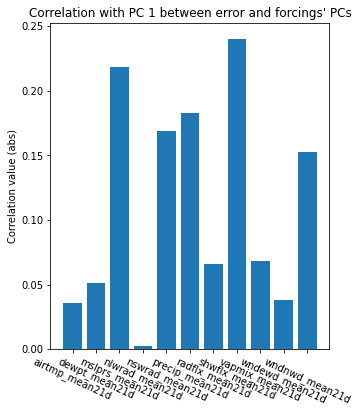

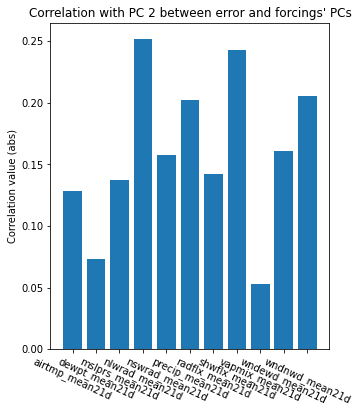

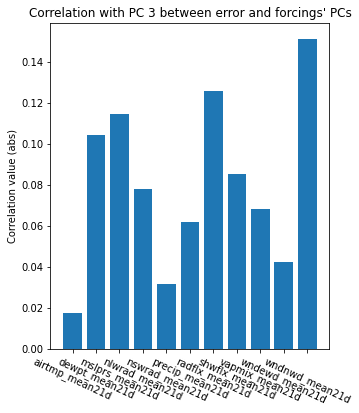

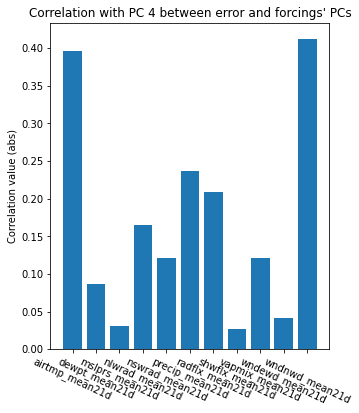

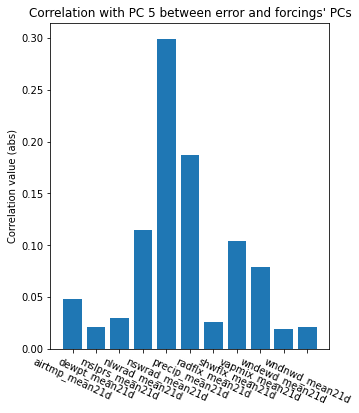

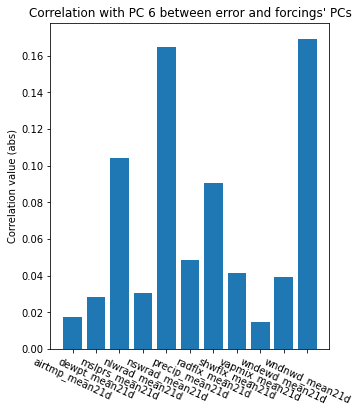

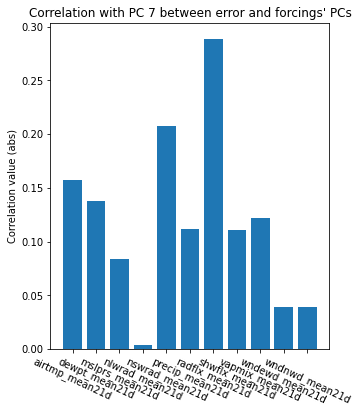

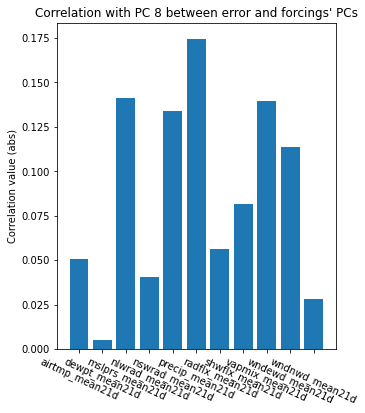

In [59]:
plot_correlation_pca(cor_pcs_fgs, title="between error and forcings' PCs")

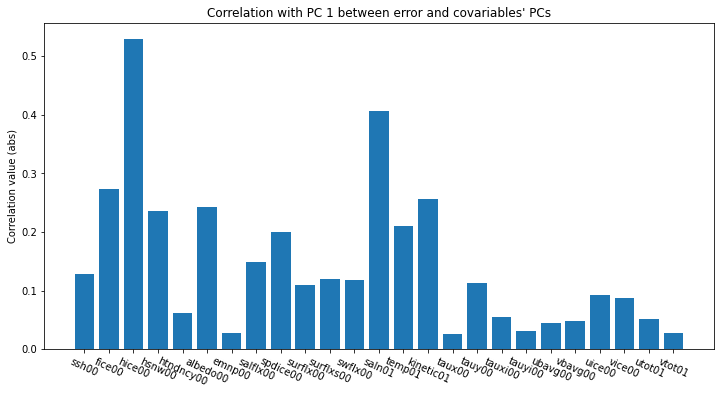

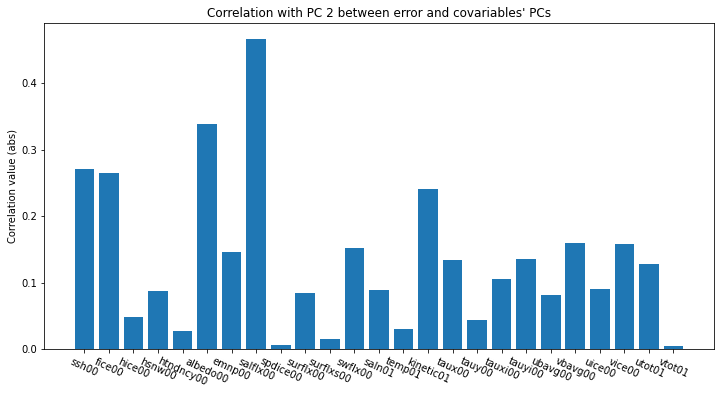

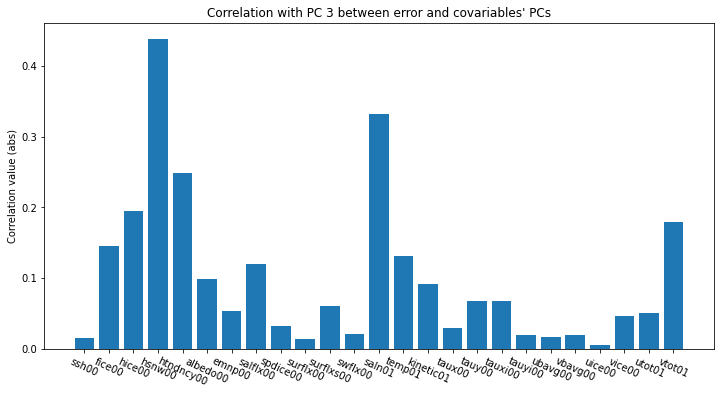

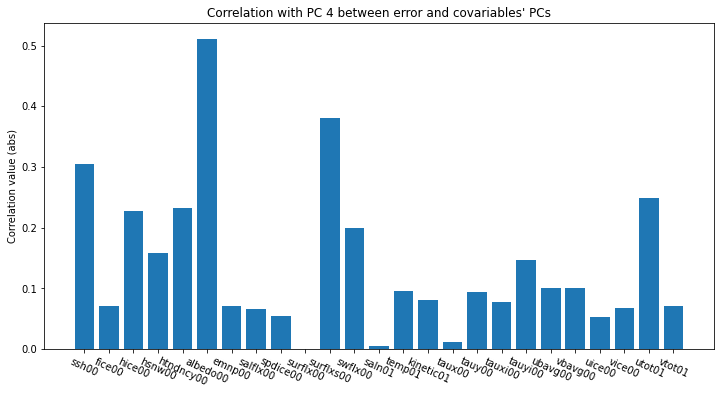

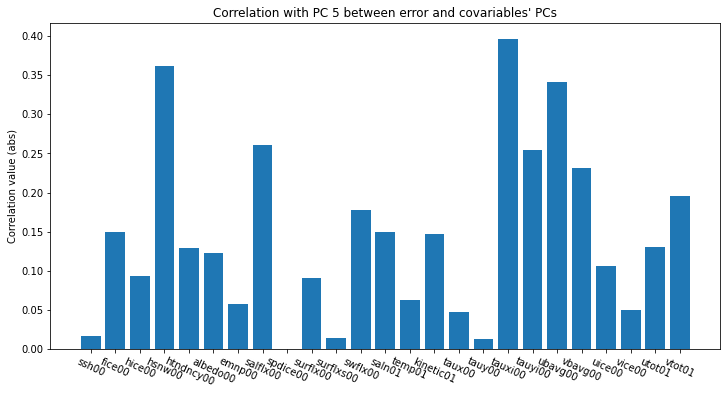

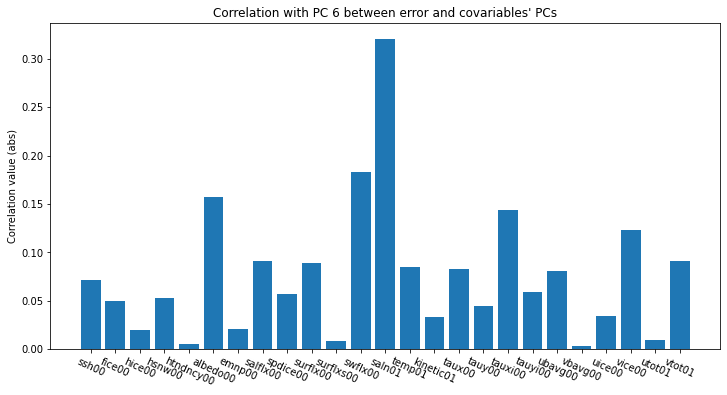

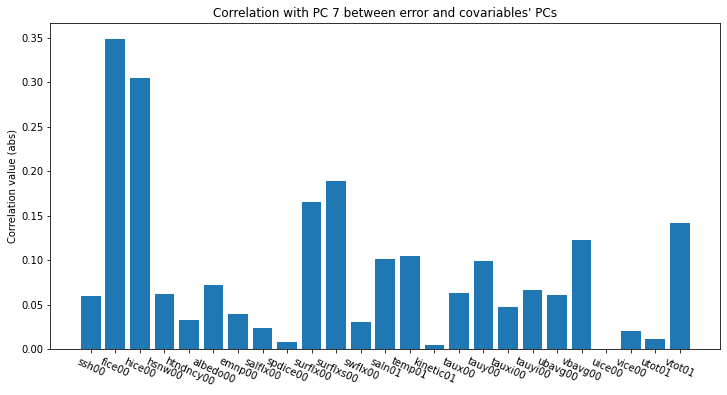

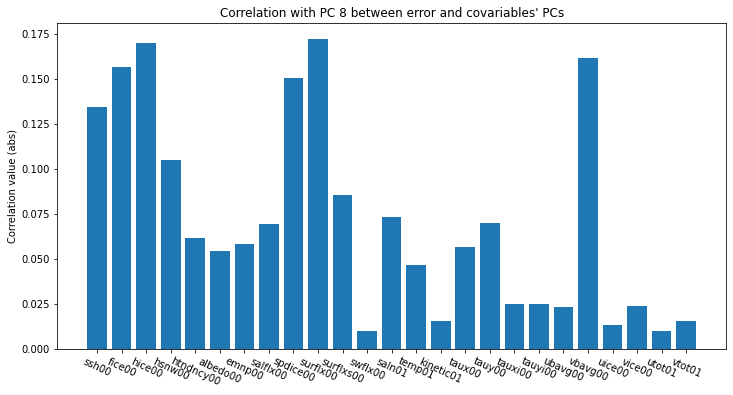

In [60]:
plot_correlation_pca(cor_pcs_cov, title="between error and covariables' PCs")

### Correlation between each parameter (mean over time) and each PC of forecast's PCA

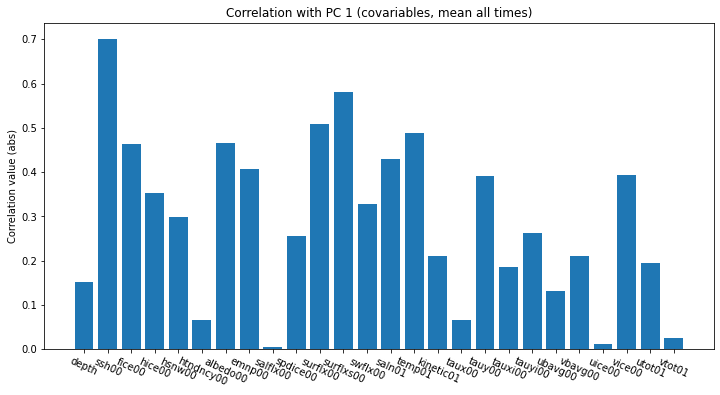

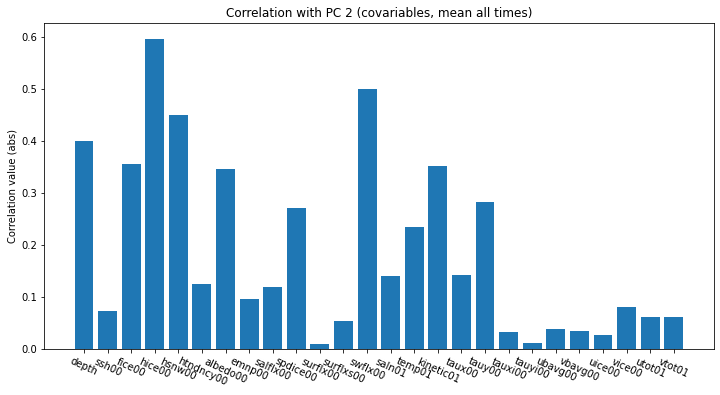

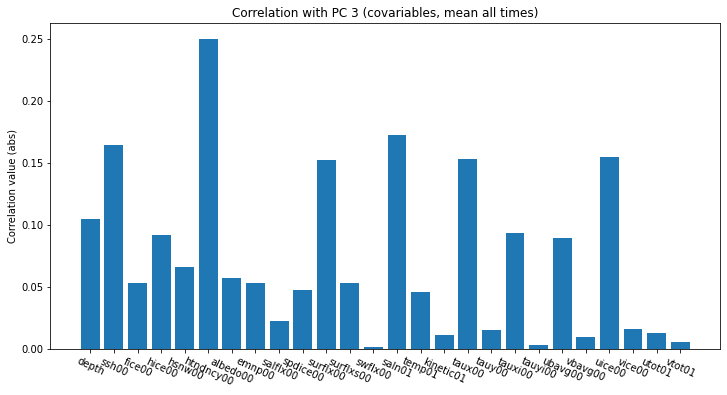

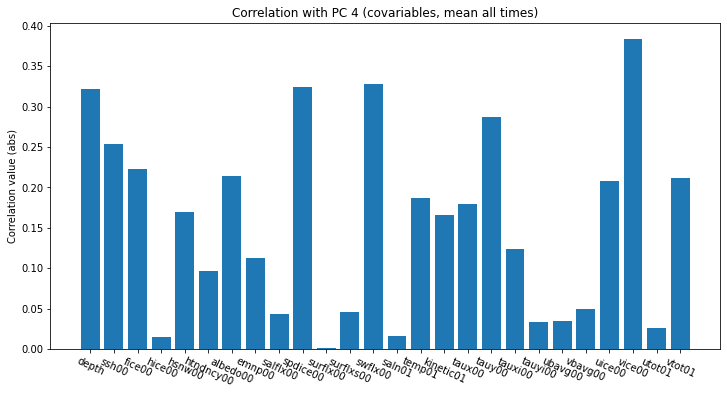

In [23]:
# covariables, mean all years
cor_cov_forecast, fields = plot_correlation_pca(Xm_sel_nonan_cov, pca_f, lim_idm, lim_jdm, title="(covariables, mean all times)")

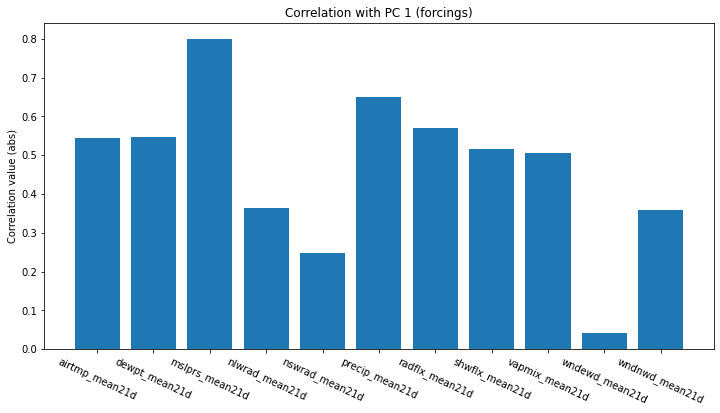

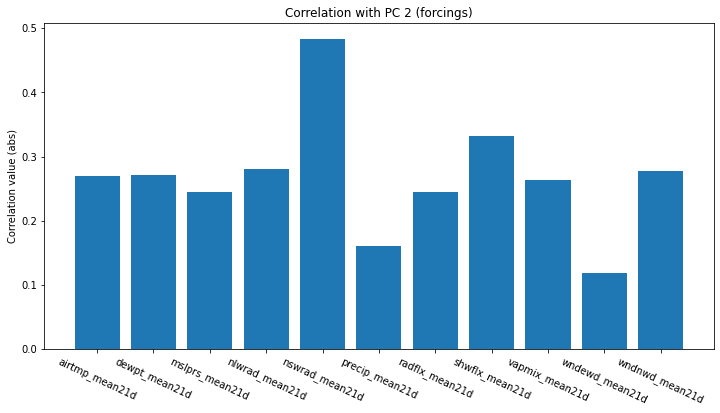

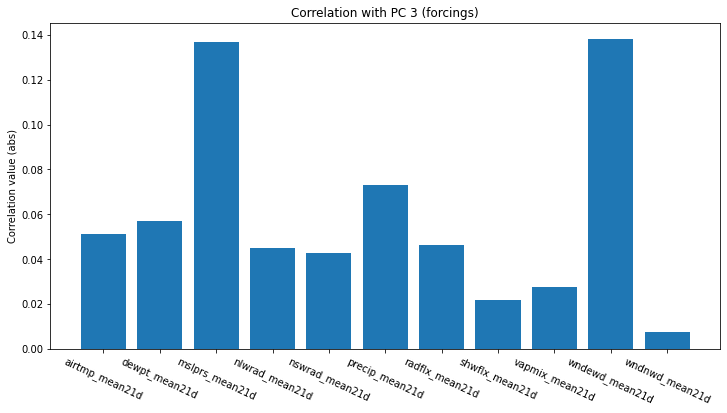

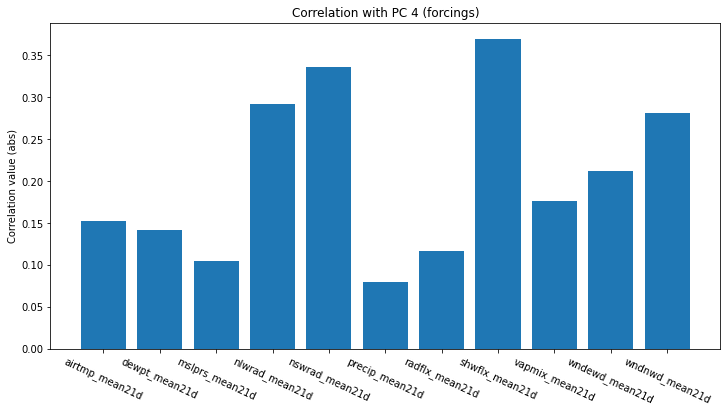

In [22]:
# forcings, mean all years
cor_f_forecast, _ = plot_correlation_pca(Xm_sel_nonan_fgs, pca_f, lim_idm, lim_jdm, "(forcings)")

### Correlation between parameters and error's time series in each geographical point <a class="anchor" id="part3_1_2"></a>

In [12]:
def compute_geo_corr(Xe, X_sel):
    """ Compute the correlation in time between each geographical point and the error
    In:
        Xe     : xarray.core.dataarray.DataArray -- error's time serie (dim (t, y, x))
        X_sel  : dict                            -- parameters' time serie (same area than the error) (dim (t, y, x)) 
    Out:
        xr_cor : dict of xarray.core.dataarray.DataArray 
               -- key = parameter name
                  values dim (y, x) = correlation between  Xe the the associated key
    """
    fields = X_sel.keys()
    t, y, x = Xe.shape
    
    X_2d = dict()
    Xe_2d = np.reshape(Xe.values, (t, x*y))
    
    cor = dict()
    xr_cor = dict()
    
    for field in fields:
        X_2d[field] = np.reshape(X_sel[field], (t, x*y))
        cor[field] = np.empty(x*y)
        for point in range(x*y):
            err_point = Xe_2d[:, point]
            if np.isnan(err_point).any() or not np.any(err_point) :
                cor[field][point] = np.nan
            else:
                mat = np.corrcoef(err_point, X_2d[field][:, point])
                cor[field][point] = mat[0][1] # NaN values remains for plot
        xr_cor[field] = xr.DataArray(np.reshape(cor[field], (y, x)), dims=['jdim', 'idim'])

    return xr_cor

In [13]:
def plot_space_cor(cor, threshold=0.5, n=10, threshold_sup=1, filepath=""):
    """
    In:
        cor       : dict of xarray.core.dataarray.DataArray 
                    -- key = parameter name
                       values dim (y, x) = correlation between  Xe the the associated key
       threshold  : float, 0 <= threshold <= 1 
                    -- map for a given field is plot if at least one correlation exceeds this value
        n         : int -- number of best correlation's values to print for each field
        threshold  : float, 0 <= threshold <= 1 
                    -- map for a given field is plot if none of the correlation exceeds this value

    """
    
    fields = list(cor.keys())
    ny, nx = cor[fields[0]].shape

    for f in fields:
        if n > 0:
            # Highlight n biggest abs correlation values for each plot
            cor_abs_1d = np.array(list(map(abs, cor[f]))).flatten()

            # get index of ranking array (descending order)
            rank_index = np.argsort(cor_abs_1d, axis=-1, kind=None, order=None)[::-1]
            rank_array = cor_abs_1d[rank_index]
            rank_array_nonan = rank_array[np.isfinite(rank_array)]
            rank_index_nonan = rank_index[-(rank_array_nonan.shape[0]):]


            if abs(rank_array_nonan[0]) >= threshold and abs(rank_array_nonan[0]) <= threshold_sup:
                # plot n best results
                x = [(i % nx) for i in rank_index_nonan[:n]]
                y = [None for i in range(n)]

                for i in range(n):
                    y[i] = (rank_index_nonan[i]+1-x[i]) // nx
                    print(f"rank {i+1} : {cor[f].isel(idim=x[i], jdim=y[i]).values} for idim={x[i]}, jdim={y[i]}")
                    #plt.text(x[i], y[i], i+1)
                    plt.plot(x[i],y[i],'.k')

                #plt.plot(x[0],y[0],'.k')
                #plt.text(x[0], y[0], 1)
                cor[f].plot(vmax=1)
                plt.title(f"Geographical correlation between Xe and {f}'s' time series");
        else:
            cor[f].plot(vmax=1)
            plt.title(f"Geographical correlation between Xe and {f}'s' time series");
            
        if filepath != "":
            plt.savefig(f"{filepath}/{f}.png", facecolor="white")
        plt.show()

In [ ]:
geo_cor_fgs = compute_geo_corr(Xe, forcings)
geo_cor_cov = compute_geo_corr(Xe, X_sel_cov)

rank 1 : -0.6209078952910716 for idim=72, jdim=35
rank 2 : -0.5973648764944065 for idim=71, jdim=35
rank 3 : -0.5970538117558438 for idim=73, jdim=35


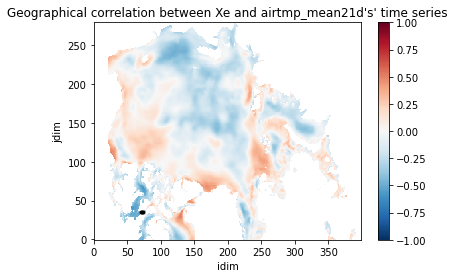

rank 1 : -0.6162108593524336 for idim=72, jdim=35
rank 2 : -0.5939664331427547 for idim=74, jdim=66
rank 3 : -0.5939117058085076 for idim=71, jdim=35


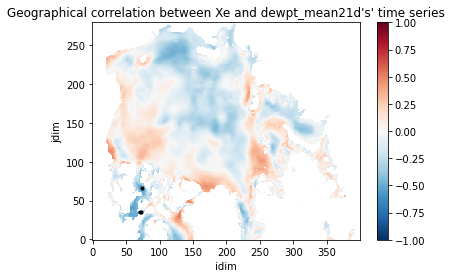

rank 1 : -0.5569252592844618 for idim=127, jdim=7
rank 2 : -0.5556422029382821 for idim=128, jdim=8
rank 3 : -0.5551532280565639 for idim=134, jdim=0


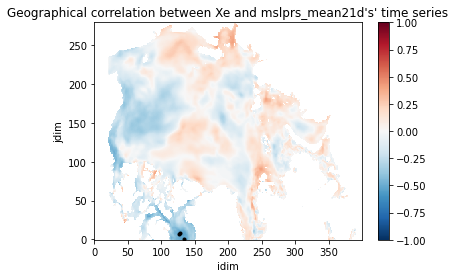

rank 1 : 0.5237618109738379 for idim=71, jdim=35
rank 2 : -0.5162522301168381 for idim=107, jdim=44
rank 3 : -0.5085527930550718 for idim=107, jdim=43


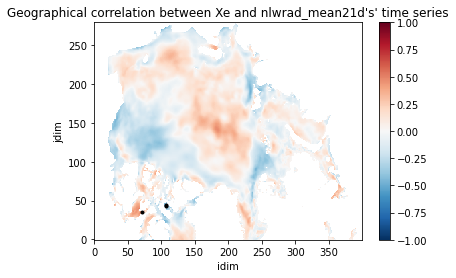

rank 1 : -0.7132353235521677 for idim=59, jdim=41
rank 2 : -0.7108167217829707 for idim=59, jdim=40
rank 3 : -0.7054701852694585 for idim=58, jdim=40


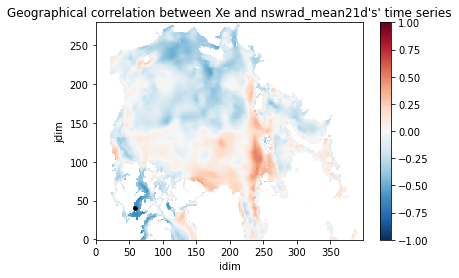

rank 1 : -0.5678055590868649 for idim=93, jdim=89
rank 2 : 0.5369219950495356 for idim=148, jdim=48
rank 3 : -0.5338471574214995 for idim=91, jdim=88


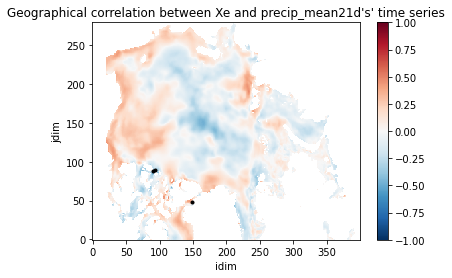

rank 1 : -0.6224283325530319 for idim=72, jdim=35
rank 2 : -0.6008931672164582 for idim=71, jdim=35
rank 3 : -0.5959762971855336 for idim=73, jdim=35


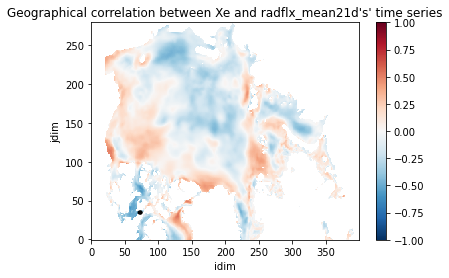

rank 1 : -0.8468690713918703 for idim=81, jdim=29
rank 2 : -0.8438559981039846 for idim=80, jdim=29
rank 3 : -0.8420362134393864 for idim=79, jdim=28


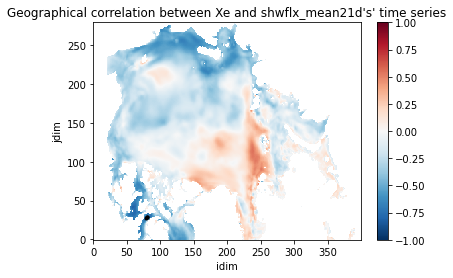

rank 1 : -0.6475340019589704 for idim=72, jdim=35
rank 2 : -0.6237370717474707 for idim=73, jdim=35
rank 3 : -0.6156396105138091 for idim=71, jdim=35


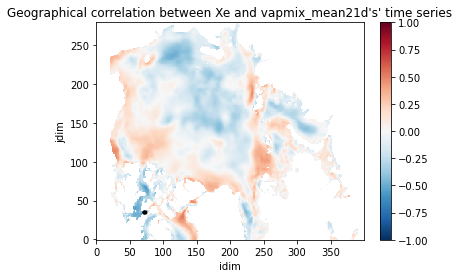

In [27]:
# Correlation between Xe and forcings
plot_space_cor(geo_cor_fgs, n=3)

rank 1 : -0.6195613064285518 for idim=79, jdim=40
rank 2 : 0.5764549070754691 for idim=219, jdim=21
rank 3 : 0.5548181313368998 for idim=92, jdim=117


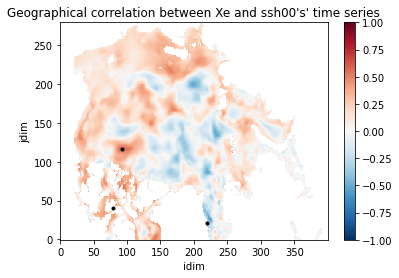

rank 1 : 1.0 for idim=311, jdim=42
rank 2 : -1.0 for idim=276, jdim=54
rank 3 : -1.0 for idim=323, jdim=107


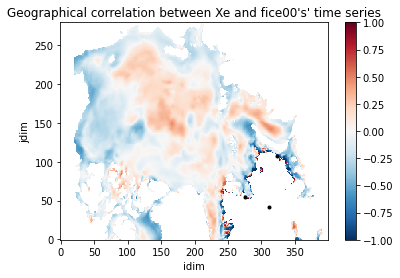

rank 1 : -1.0 for idim=256, jdim=20
rank 2 : -1.0 for idim=251, jdim=3
rank 3 : -1.0 for idim=253, jdim=21


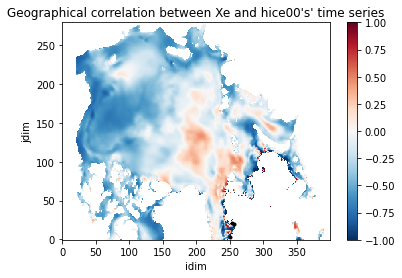

rank 1 : -1.0 for idim=298, jdim=111
rank 2 : -1.0 for idim=244, jdim=62
rank 3 : -1.0 for idim=258, jdim=15


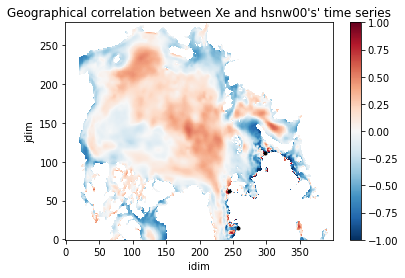

rank 1 : 1.0 for idim=311, jdim=42
rank 2 : -1.0 for idim=247, jdim=25
rank 3 : 0.9999997441140593 for idim=255, jdim=26


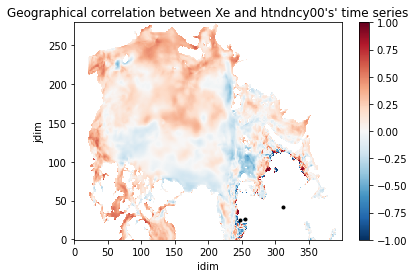

rank 1 : -0.920728915781817 for idim=335, jdim=104
rank 2 : -0.9141223478068179 for idim=334, jdim=107
rank 3 : -0.9123935785834688 for idim=334, jdim=104


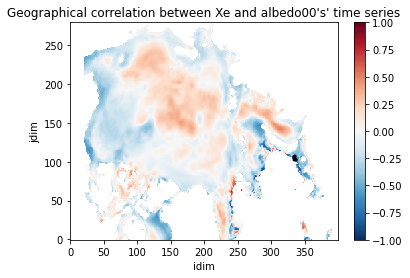

rank 1 : 0.6922231108128585 for idim=38, jdim=211
rank 2 : 0.6916161925729373 for idim=37, jdim=210
rank 3 : 0.6913420176327081 for idim=38, jdim=210


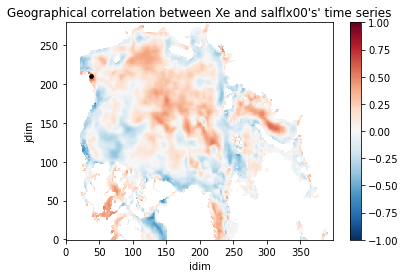

rank 1 : 1.0 for idim=311, jdim=42
rank 2 : 0.9999223969166271 for idim=249, jdim=22
rank 3 : 0.9938373479406265 for idim=307, jdim=111


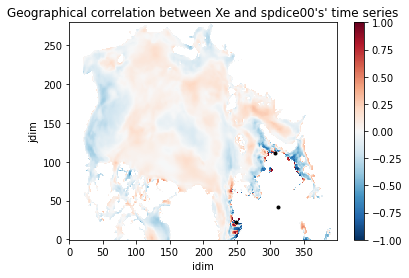

rank 1 : -0.6644824699812515 for idim=243, jdim=68
rank 2 : -0.61853171147113 for idim=243, jdim=67
rank 3 : 0.602604221070172 for idim=157, jdim=57


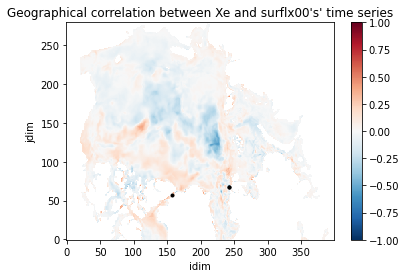

rank 1 : -0.6788410041496964 for idim=72, jdim=35
rank 2 : -0.653171638437292 for idim=71, jdim=35
rank 3 : -0.6288888787801599 for idim=73, jdim=35


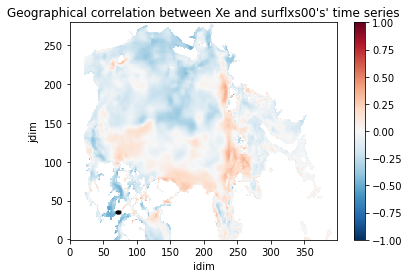

rank 1 : -0.6607894413605037 for idim=72, jdim=35
rank 2 : -0.6223106718864594 for idim=73, jdim=35
rank 3 : -0.6207467413659874 for idim=71, jdim=35


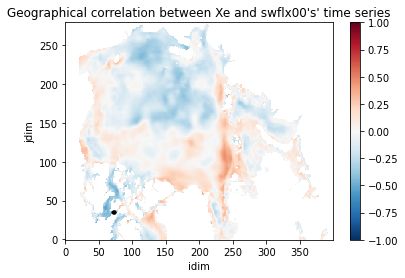

rank 1 : -0.753372813069465 for idim=148, jdim=0
rank 2 : -0.7448165150583386 for idim=148, jdim=1
rank 3 : -0.7440722397850297 for idim=147, jdim=4


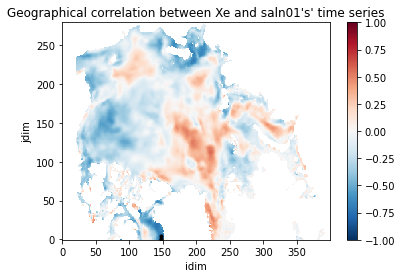

rank 1 : 0.5818855107990354 for idim=113, jdim=54
rank 2 : -0.5610158655662129 for idim=221, jdim=112
rank 3 : 0.5588433280368698 for idim=81, jdim=77


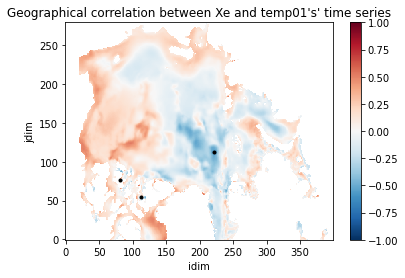

rank 1 : 0.580806370285695 for idim=376, jdim=57
rank 2 : -0.5578979343512395 for idim=176, jdim=61
rank 3 : 0.5362005064964961 for idim=164, jdim=63


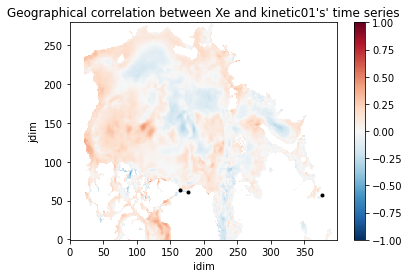

rank 1 : -0.5906256030965403 for idim=377, jdim=55
rank 2 : 0.5193508752854007 for idim=377, jdim=57
rank 3 : -0.5046056590601626 for idim=165, jdim=61


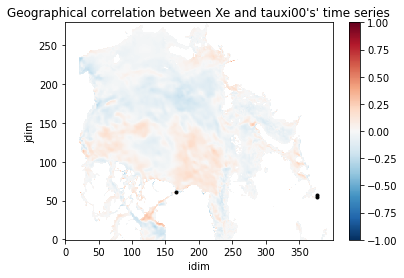

rank 1 : 0.5812507681486814 for idim=376, jdim=57
rank 2 : 0.5354696593567005 for idim=164, jdim=65
rank 3 : 0.5256421456909033 for idim=164, jdim=63


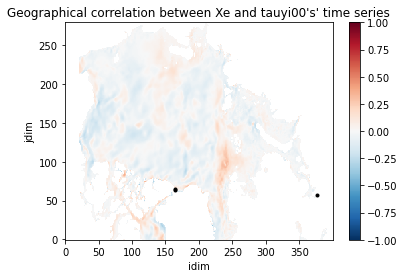

rank 1 : 0.7499072205103424 for idim=168, jdim=165
rank 2 : 0.7231314918802529 for idim=144, jdim=102
rank 3 : 0.7149711549850953 for idim=146, jdim=101


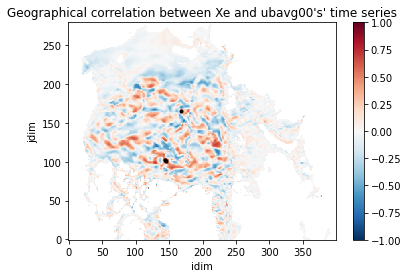

rank 1 : 0.7246361400236917 for idim=140, jdim=97
rank 2 : 0.7082022446458467 for idim=107, jdim=194
rank 3 : -0.7032827277619412 for idim=145, jdim=102


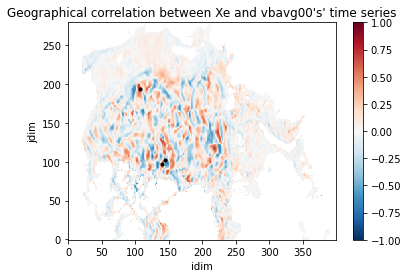

rank 1 : -1.0 for idim=311, jdim=42
rank 2 : 0.9999223969166307 for idim=249, jdim=22
rank 3 : -0.9946411788224989 for idim=298, jdim=111


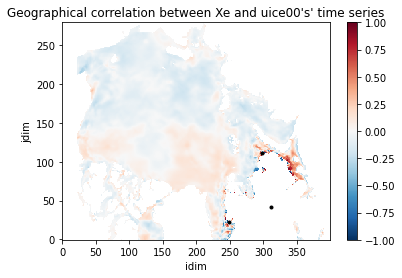

rank 1 : -0.9999223969166204 for idim=249, jdim=22
rank 2 : 0.999695787352267 for idim=304, jdim=112
rank 3 : -0.9992373237109847 for idim=303, jdim=89


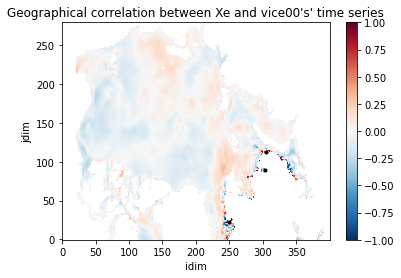

rank 1 : 0.6050193433480874 for idim=105, jdim=12
rank 2 : 0.585837155252956 for idim=377, jdim=55
rank 3 : -0.5217086136043758 for idim=377, jdim=57


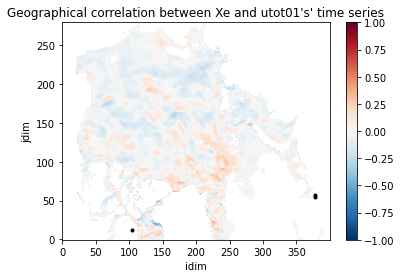

rank 1 : -0.5911069959540325 for idim=376, jdim=57
rank 2 : -0.5607518435209371 for idim=165, jdim=65
rank 3 : -0.5537415982076785 for idim=164, jdim=65


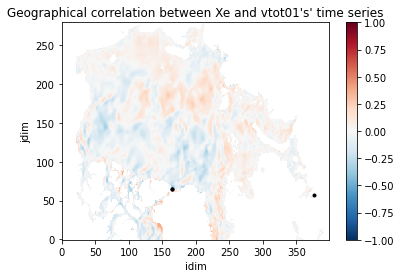

In [23]:
# Correlation between Xe and covariables
plot_space_cor(geo_cor_cov, n=3)

In [100]:
def compare_ts(i, j, X, param, cov, title=''):
    t = param.shape[0]

    print(f"Correlation value :{cov.sel(jdim=slice(*(j, j+1)),idim=slice(*(i, i+1))).values}")

    err = np.reshape(X.sel(jdim=slice(*(j, j+1)),idim=slice(*(i, i+1))).values, (t))
    hsnw = np.reshape(param[:, j, i], (t))

    plt.title(title)
    plt.plot(err, color='red')
    plt.plot(hsnw, color='blue')

Correlation value :[[0.52685411]]


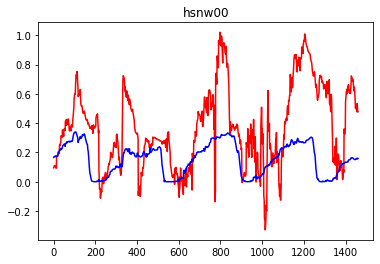

In [102]:
param = "hsnw00"
compare_ts(186, 136, Xe, X_sel_cov[param], geo_cor_cov[param], param)

Correlation value :[[-0.6213296]]


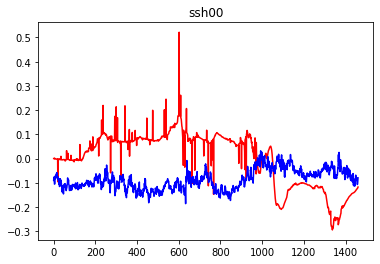

In [103]:
param = "ssh00"
compare_ts(79, 40, Xe, X_sel_cov[param], geo_cor_cov[param], param)

Correlation value :[[-0.73021185]]


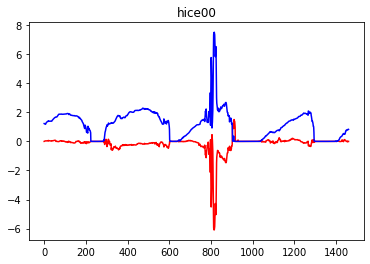

In [99]:
param = 'hice00'
compare_ts(48, 160, Xe, X_sel_cov[param], geo_cor_cov[param], param)

In [ ]:
Xe_rec_reshape = Xe_rec.transpose('rdim', 'jdim', 'idim')
geo_cor_fgs_rec = compute_geo_corr(Xe_rec_reshape, forcings)
geo_cor_cov_rec = compute_geo_corr(Xe_rec_reshape, X_sel_cov)

/cluster/home/kaly/.conda/envs/test/lib/python3.8/site-packages/numpy/lib/function_base.py:2829: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/cluster/home/kaly/.conda/envs/test/lib/python3.8/site-packages/numpy/lib/function_base.py:2830: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


rank 1 : 0.6879254697854899 for idim=49, jdim=99
rank 2 : 0.6861122119698813 for idim=281, jdim=64
rank 3 : 0.6840464359281422 for idim=365, jdim=58


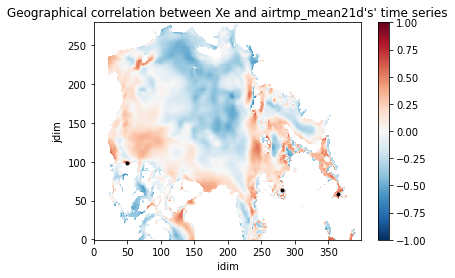

rank 1 : 0.6912364199458325 for idim=49, jdim=99
rank 2 : 0.6806723481382672 for idim=50, jdim=99
rank 3 : 0.6751273313803761 for idim=48, jdim=99


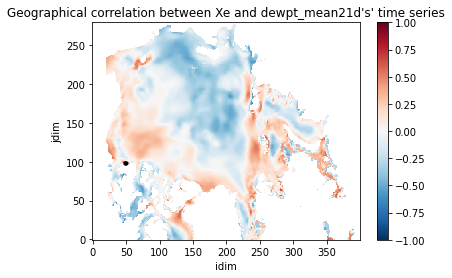

rank 1 : 0.6022109099702545 for idim=235, jdim=41
rank 2 : 0.5830530641607333 for idim=235, jdim=42
rank 3 : -0.5793117506278432 for idim=32, jdim=117


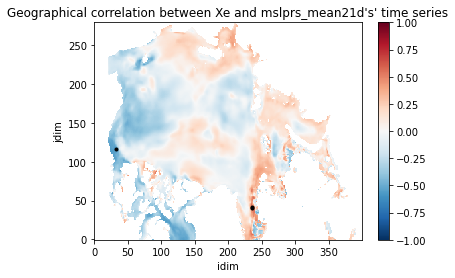

rank 1 : 0.6375278460691014 for idim=364, jdim=61
rank 2 : -0.626628291101577 for idim=280, jdim=57
rank 3 : 0.6257040061163859 for idim=362, jdim=60


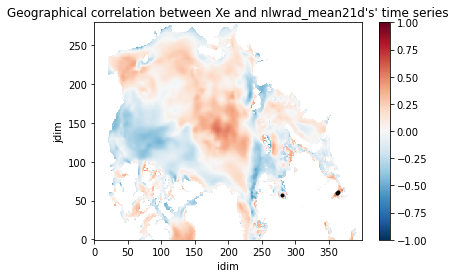

rank 1 : 0.7148159316548615 for idim=240, jdim=38
rank 2 : 0.7040033060951978 for idim=238, jdim=37
rank 3 : 0.6934955422907082 for idim=238, jdim=38


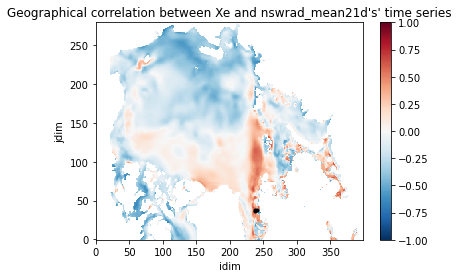

rank 1 : 0.6339007259476481 for idim=233, jdim=189
rank 2 : 0.6326495980536869 for idim=233, jdim=188
rank 3 : 0.6324229985099145 for idim=232, jdim=188


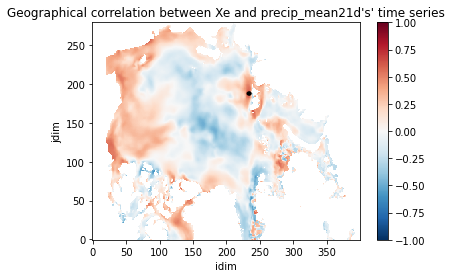

rank 1 : 0.705731673971408 for idim=49, jdim=99
rank 2 : 0.6944240638967952 for idim=50, jdim=99
rank 3 : 0.6923472550271642 for idim=48, jdim=99


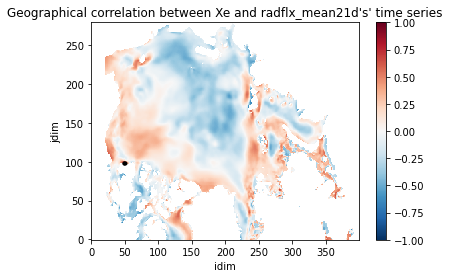

rank 1 : -0.8464146832659644 for idim=207, jdim=249
rank 2 : -0.8453861364386397 for idim=207, jdim=250
rank 3 : -0.8422795180707016 for idim=101, jdim=269


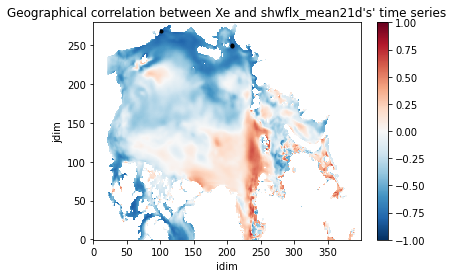

rank 1 : 0.6771780410250752 for idim=281, jdim=64
rank 2 : 0.6716103408197179 for idim=258, jdim=131
rank 3 : 0.666037897676058 for idim=49, jdim=99


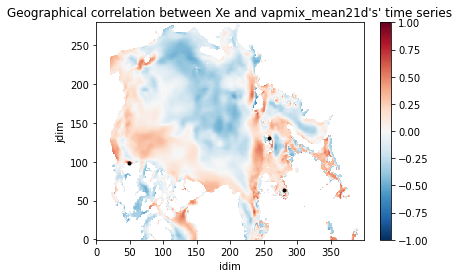

rank 1 : -0.5569799366781628 for idim=308, jdim=168
rank 2 : -0.5489206212331631 for idim=309, jdim=168
rank 3 : -0.5347917435018095 for idim=308, jdim=167


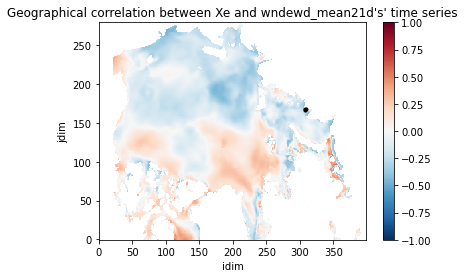

rank 1 : 0.6207678811930525 for idim=236, jdim=56
rank 2 : 0.6170189290896474 for idim=235, jdim=60
rank 3 : 0.6091014811174231 for idim=235, jdim=61


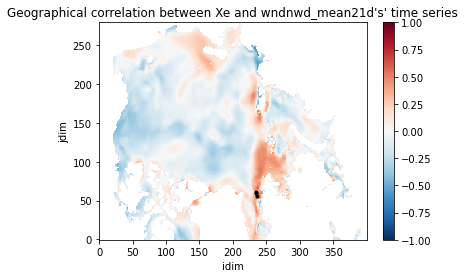

In [25]:
# Correlation between Xe_rec and forcings
#filepath = "/nird/projects/nird/NS2993K/Calliope/figs/Xerec_param_space_correlation/forcings"
plot_space_cor(geo_cor_fgs_rec, n=3)

rank 1 : 0.7612341011623894 for idim=39, jdim=89
rank 2 : 0.7453267102115337 for idim=39, jdim=88
rank 3 : 0.7421369574393624 for idim=38, jdim=72


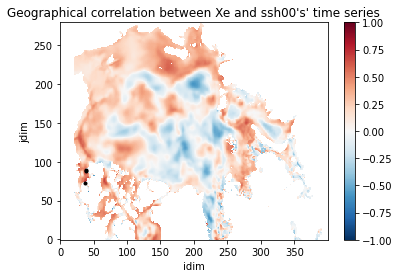

rank 1 : -0.7488733700178988 for idim=113, jdim=53
rank 2 : -0.7393181759766276 for idim=113, jdim=52
rank 3 : 0.7131856137826685 for idim=243, jdim=72


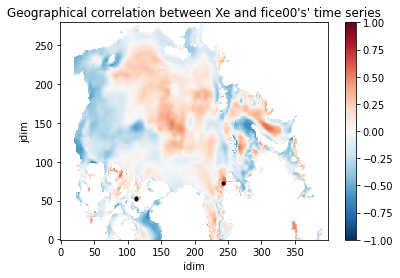

rank 1 : -0.8597370786143907 for idim=70, jdim=233
rank 2 : -0.858399687483544 for idim=71, jdim=234
rank 3 : -0.8543430338525854 for idim=72, jdim=235


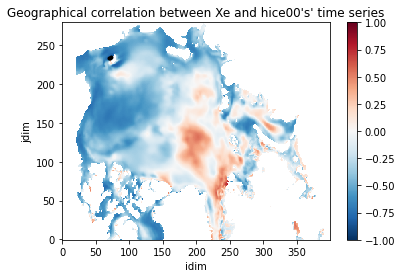

rank 1 : -0.7599148018824071 for idim=151, jdim=3
rank 2 : -0.7586801104957183 for idim=151, jdim=1
rank 3 : 0.7532611047258838 for idim=248, jdim=74


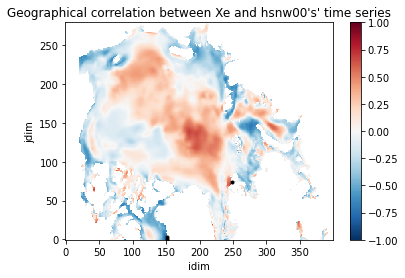

rank 1 : 0.6228258388524761 for idim=238, jdim=237
rank 2 : 0.6191872383795185 for idim=235, jdim=245
rank 3 : 0.6144853858854525 for idim=237, jdim=237


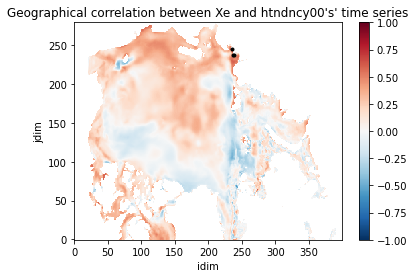

rank 1 : 0.7219007717102298 for idim=243, jdim=72
rank 2 : 0.7117481171382385 for idim=243, jdim=71
rank 3 : 0.6808860996650662 for idim=243, jdim=73


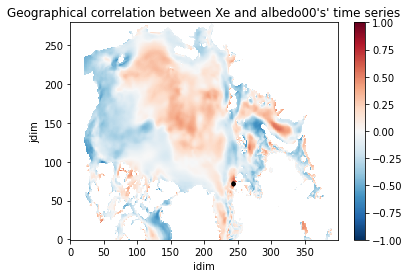

rank 1 : -0.7510935488094994 for idim=146, jdim=51
rank 2 : -0.7249474852644776 for idim=258, jdim=131
rank 3 : -0.7123528341627041 for idim=143, jdim=50


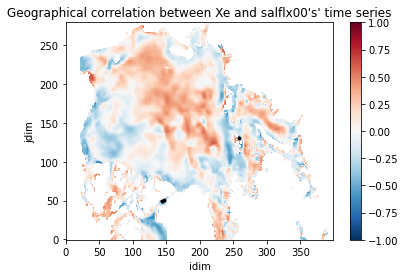

rank 1 : -0.6240765610516397 for idim=274, jdim=64
rank 2 : -0.5945582417308918 for idim=274, jdim=65
rank 3 : -0.5930438294193826 for idim=91, jdim=85


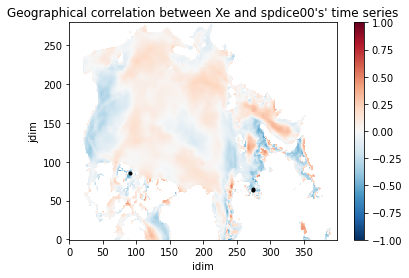

rank 1 : -0.7244723148848458 for idim=226, jdim=123
rank 2 : -0.7211720610777071 for idim=225, jdim=123
rank 3 : -0.695953015191015 for idim=226, jdim=122


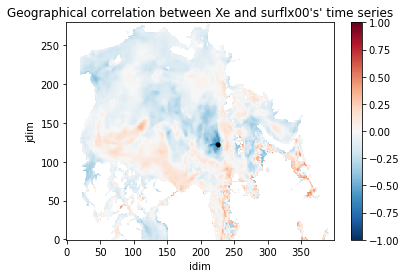

rank 1 : -0.6184157169665845 for idim=308, jdim=168
rank 2 : -0.5908964469730068 for idim=28, jdim=94
rank 3 : -0.5872456268123383 for idim=238, jdim=237


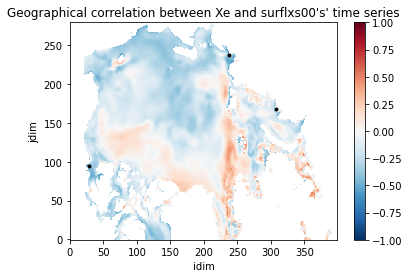

rank 1 : 0.6628463001908013 for idim=240, jdim=38
rank 2 : 0.647847809253181 for idim=349, jdim=109
rank 3 : 0.6393863051173011 for idim=238, jdim=37


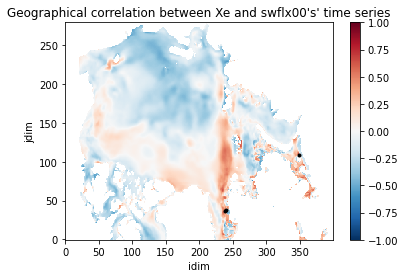

rank 1 : -0.8395789004829483 for idim=87, jdim=0
rank 2 : -0.8237437464184071 for idim=108, jdim=24
rank 3 : -0.8226170864276335 for idim=110, jdim=22


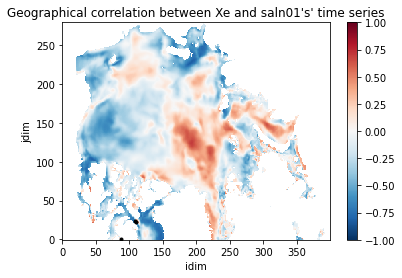

rank 1 : 0.7078900860951098 for idim=281, jdim=64
rank 2 : -0.7003922838370336 for idim=193, jdim=124
rank 3 : -0.7002805410493258 for idim=193, jdim=125


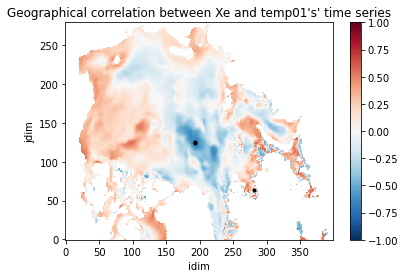

rank 1 : 0.6055773101184424 for idim=119, jdim=50
rank 2 : -0.6006482008198956 for idim=176, jdim=61
rank 3 : 0.5650948178495706 for idim=376, jdim=57


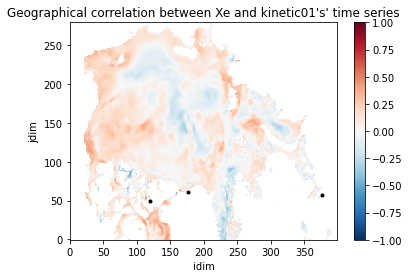

rank 1 : -0.5162092322747336 for idim=105, jdim=12
rank 2 : -0.49865885495066137 for idim=165, jdim=61
rank 3 : 0.4721340151721731 for idim=377, jdim=57


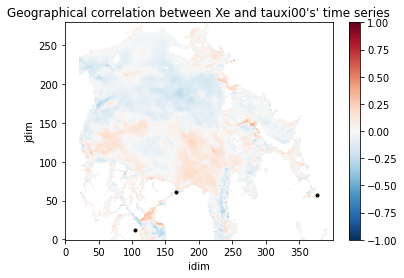

rank 1 : -0.6258042499929515 for idim=176, jdim=61
rank 2 : -0.5819335124576762 for idim=119, jdim=50
rank 3 : 0.5609831102453721 for idim=376, jdim=57


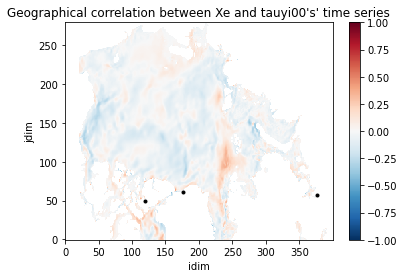

rank 1 : -0.8469031993205524 for idim=173, jdim=153
rank 2 : 0.7977254500900774 for idim=169, jdim=166
rank 3 : -0.7951344140037995 for idim=174, jdim=152


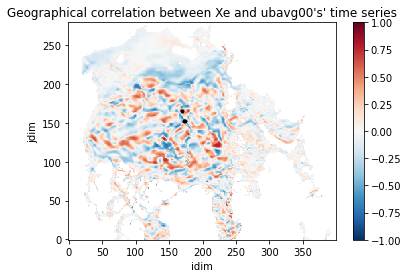

rank 1 : -0.8142083586182299 for idim=178, jdim=130
rank 2 : -0.7948110715996541 for idim=178, jdim=129
rank 3 : -0.7898394084853727 for idim=178, jdim=131


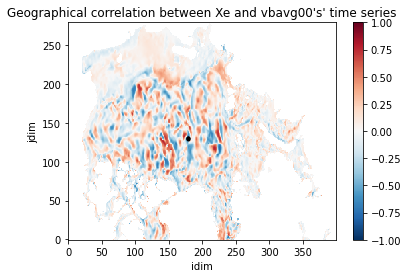

rank 1 : 0.6159322482282406 for idim=105, jdim=12
rank 2 : -0.5861587246258684 for idim=113, jdim=25
rank 3 : -0.5847436140261891 for idim=233, jdim=244


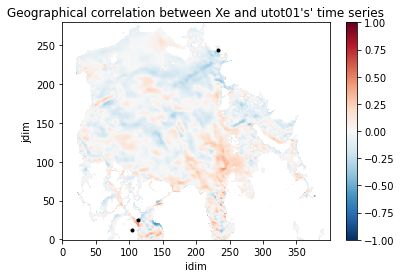

rank 1 : 0.6301625379227616 for idim=176, jdim=61
rank 2 : -0.5672659481369201 for idim=376, jdim=57
rank 3 : -0.534217127862048 for idim=164, jdim=66


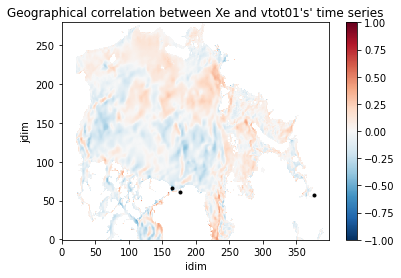

In [26]:
# Correlation between Xe_rec and covariables
plot_space_cor(geo_cor_cov_rec, n=3)

In [ ]:
param = 'ssh00'
compare_ts(160, 220, Xe_rec, X_sel_cov[param], geo_cor_cov_rec[param], param)

In [123]:
def subplot_space_cor(list_cor, threshold=0.5, n=10, threshold_sup=1, filepath="", label=["Xe"], plotdiff=True):
    """
    In:
        cor       : dict of xarray.core.dataarray.DataArray 
                    -- key = parameter name
                       values dim (y, x) = correlation between  Xe the the associated key
       threshold  : float, 0 <= threshold <= 1 
                    -- map for a given field is plot if at least one correlation exceeds this value
        n         : int -- number of best correlation's values to print for each field
        threshold  : float, 0 <= threshold <= 1 
                    -- map for a given field is plot if none of the correlation exceeds this value

    """
    
    fields = list(list_cor[0].keys())
    ny, nx = list_cor[0][fields[0]].shape
    display = True

    for f in fields:
        if display:
            fig, ax = plt.subplots(ncols=len(list_cor)+plotdiff, figsize=(16,4))
        display = True
        
        cor_abs = np.empty([len(list_cor), ny, nx])
        for nplot, cor in enumerate(list_cor):
            if n > 0:
                # Highlight n biggest abs correlation values for each plot
                cor_abs[nplot] = np.array(list(map(abs, cor[f])))
                
                cor_abs_1d = cor_abs[nplot].flatten()

                # get index of ranking array (descending order)
                rank_index = np.argsort(cor_abs_1d, axis=-1, kind=None, order=None)[::-1]
                rank_array = cor_abs_1d[rank_index]
                rank_array_nonan = rank_array[np.isfinite(rank_array)]
                rank_index_nonan = rank_index[-(rank_array_nonan.shape[0]):]

                if display and abs(rank_array_nonan[0]) >= threshold and abs(rank_array_nonan[0]) <= threshold_sup:
                    # plot n best results
                    x = [(i % nx) for i in rank_index_nonan[:n]]
                    y = [None for i in range(n)]

                    for i in range(n):
                        y[i] = (rank_index_nonan[i]+1-x[i]) // nx
                        print(f"rank {i+1} : {cor[f].isel(idim=x[i], jdim=y[i]).values} for idim={x[i]}, jdim={y[i]}")
                        #plt.text(x[i], y[i], i+1)
                        ax[nplot].plot(x[i],y[i],'.k') if (len(list_cor) > 1) else plt.plot(x[i],y[i],'.k')

                    print()
                    #plt.plot(x[0],y[0],'.k')
                    #plt.text(x[0], y[0], 1)
                    if len(list_cor) > 1:
                        cor[f].plot(ax=ax[nplot], vmax=1)
                        ax[nplot].set_title("Geographical correlation" + "\n" + f"between {label[nplot]} and {f}'s' time series", multialignment='center')
                    else:
                        cor[f].plot(vmax=1)
                        plt.title(f"Geographical correlation between {label[0]} and {f}'s' time series", multialignment='center');
                else:
                    display = False
            else:
                if len(list_cor) > 1:
                    cor[f].plot(ax=ax[nplot], vmax=1)
                    ax[nplot].set_title(f"Geographical correlation between {label[nplot]} and {f}'s' time series")
                else:
                    cor[f].plot(vmax=1)
                    plt.title(f"Geographical correlation between {label[0]} and {f}'s' time series");

            if filepath != "":
                plt.savefig(f"{filepath}/{f}.png", facecolor="white")        
        if display:
            
            diff = xr.DataArray(cor_abs[0], dims=['jdim', 'idim']) - xr.DataArray(cor_abs[1], dims=['jdim', 'idim'])
            diff.plot(ax=ax[len(list_cor)], vmax=1)
            ax[len(list_cor)].set_title(f"{f} :" + "\n" + f"abs(cor with {label[0]}) - abs(cor with {label[1]})")
            
            
            plt.show()

rank 1 : -0.6213296020067887 for idim=79, jdim=40
rank 2 : 0.5743488970891162 for idim=219, jdim=21
rank 3 : 0.5560116619165121 for idim=91, jdim=116

rank 1 : 0.7600072616713154 for idim=39, jdim=89
rank 2 : 0.7447761929753076 for idim=39, jdim=88
rank 3 : 0.7434836497122501 for idim=38, jdim=72



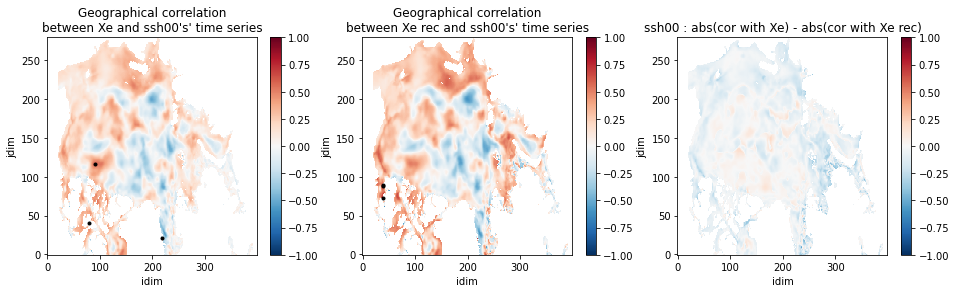

rank 1 : -1.0 for idim=323, jdim=107
rank 2 : 1.0 for idim=311, jdim=42
rank 3 : -1.0 for idim=247, jdim=25

rank 1 : -0.7483946557262322 for idim=113, jdim=53
rank 2 : -0.7395703895739867 for idim=113, jdim=52
rank 3 : 0.7131365241653109 for idim=243, jdim=72



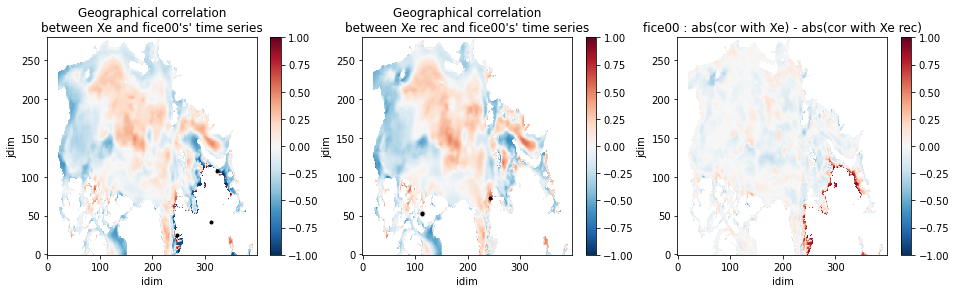

rank 1 : -1.0 for idim=297, jdim=112
rank 2 : -1.0 for idim=299, jdim=112
rank 3 : -1.0 for idim=292, jdim=93

rank 1 : -0.8596880947004677 for idim=70, jdim=233
rank 2 : -0.858329302897778 for idim=71, jdim=234
rank 3 : -0.8542523388978903 for idim=72, jdim=235



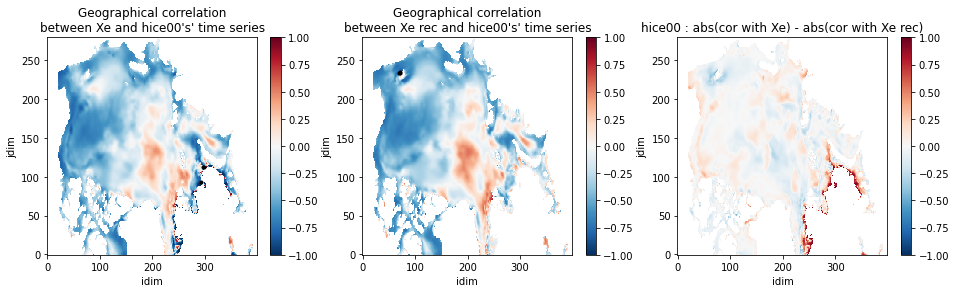

rank 1 : -1.0 for idim=244, jdim=62
rank 2 : -1.0 for idim=309, jdim=113
rank 3 : -1.0 for idim=298, jdim=111

rank 1 : -0.7598151916955123 for idim=151, jdim=3
rank 2 : -0.7585413601566383 for idim=151, jdim=1
rank 3 : 0.7532476428275232 for idim=248, jdim=74



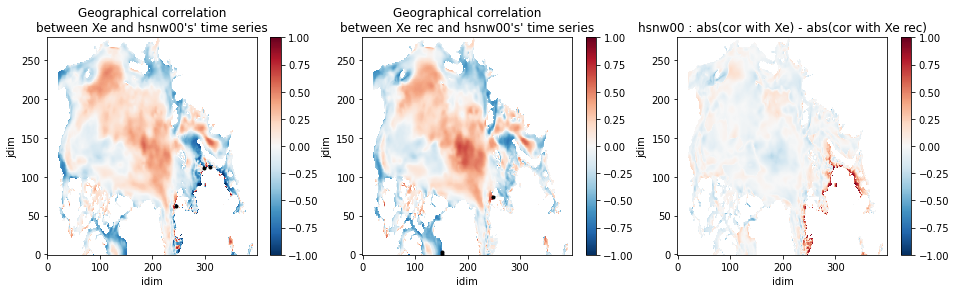

rank 1 : 1.0 for idim=311, jdim=42
rank 2 : -1.0 for idim=247, jdim=25
rank 3 : 0.9999997441140593 for idim=255, jdim=26

rank 1 : 0.6236281510222371 for idim=238, jdim=237
rank 2 : 0.6201250029589113 for idim=235, jdim=245
rank 3 : 0.6148601220397473 for idim=237, jdim=237



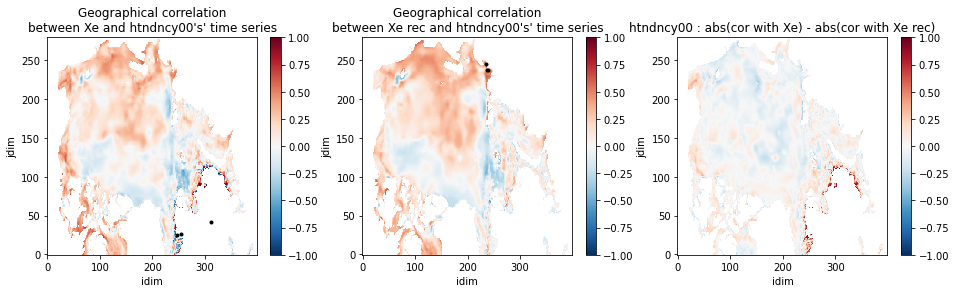

rank 1 : -0.9203465102159373 for idim=335, jdim=104
rank 2 : -0.9139316054896133 for idim=334, jdim=107
rank 3 : -0.9119315706386543 for idim=334, jdim=104

rank 1 : 0.7219708584370024 for idim=243, jdim=72
rank 2 : 0.7118427824368369 for idim=243, jdim=71
rank 3 : 0.6809609832319643 for idim=243, jdim=73



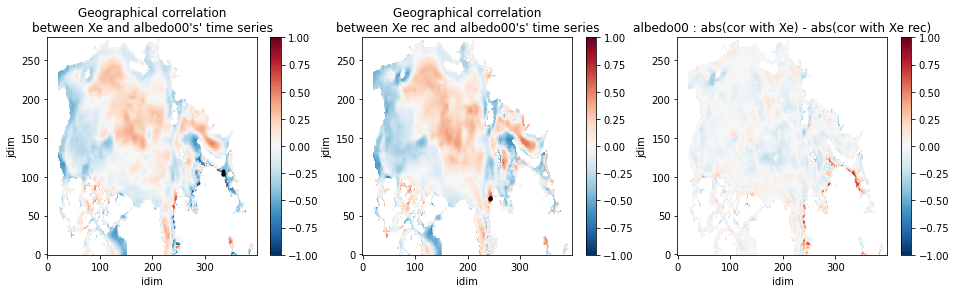

rank 1 : 0.6922200109981516 for idim=38, jdim=211
rank 2 : 0.6915973000121189 for idim=37, jdim=210
rank 3 : 0.6912964436375643 for idim=38, jdim=210

rank 1 : -0.7506495270266094 for idim=146, jdim=51
rank 2 : -0.7242801587681216 for idim=258, jdim=131
rank 3 : -0.7134289520198615 for idim=143, jdim=50



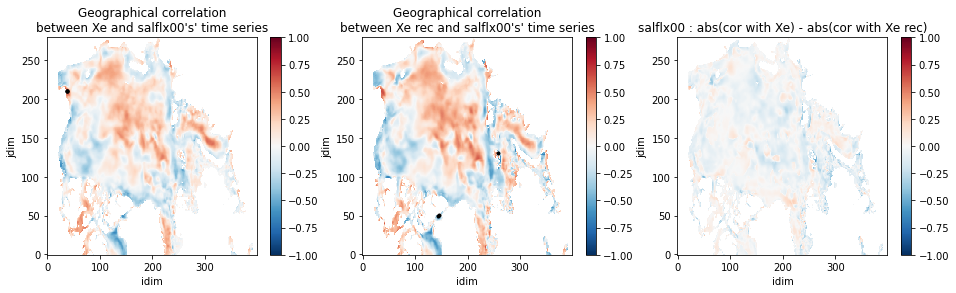

rank 1 : 1.0 for idim=311, jdim=42
rank 2 : 0.9999223969166271 for idim=249, jdim=22
rank 3 : 0.9938373479406265 for idim=307, jdim=111

rank 1 : -0.6241317130831214 for idim=274, jdim=64
rank 2 : -0.6020735933727965 for idim=91, jdim=85
rank 3 : -0.5943701005316419 for idim=274, jdim=65



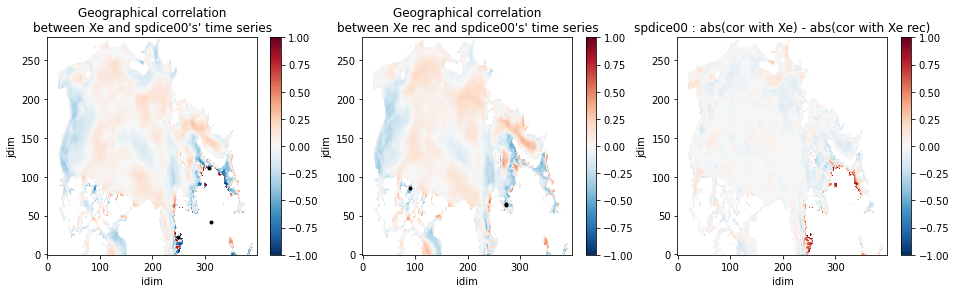

rank 1 : -0.6645319680443715 for idim=243, jdim=68
rank 2 : -0.6185803371016316 for idim=243, jdim=67
rank 3 : 0.6049246617226481 for idim=157, jdim=57

rank 1 : -0.7243535115037065 for idim=226, jdim=123
rank 2 : -0.7210775147878071 for idim=225, jdim=123
rank 3 : -0.6959451336762212 for idim=226, jdim=122



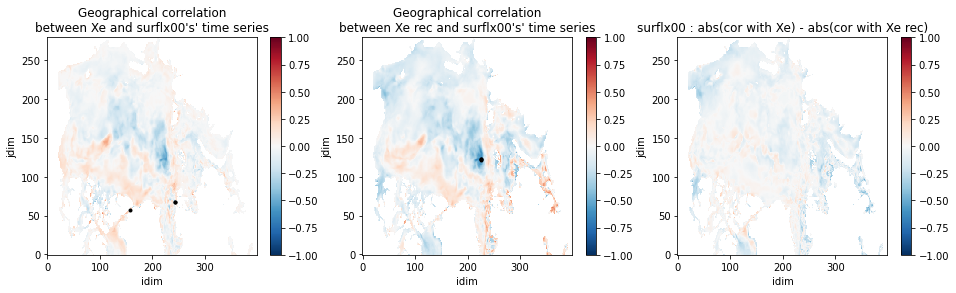

rank 1 : -0.6777061805824685 for idim=72, jdim=35
rank 2 : -0.6518575331018169 for idim=71, jdim=35
rank 3 : -0.6278047370620633 for idim=73, jdim=35

rank 1 : -0.6182165320693231 for idim=308, jdim=168
rank 2 : -0.5891172870416361 for idim=28, jdim=94
rank 3 : -0.588531344911473 for idim=238, jdim=237



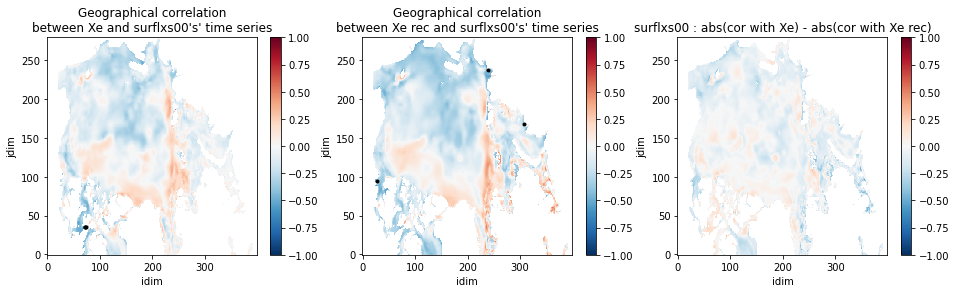

rank 1 : -0.6616810590378925 for idim=72, jdim=35
rank 2 : -0.6232256152801969 for idim=73, jdim=35
rank 3 : -0.6214706983073752 for idim=71, jdim=35

rank 1 : 0.6618080820982645 for idim=240, jdim=38
rank 2 : 0.6481992645169691 for idim=349, jdim=109
rank 3 : 0.6392476511515491 for idim=238, jdim=37



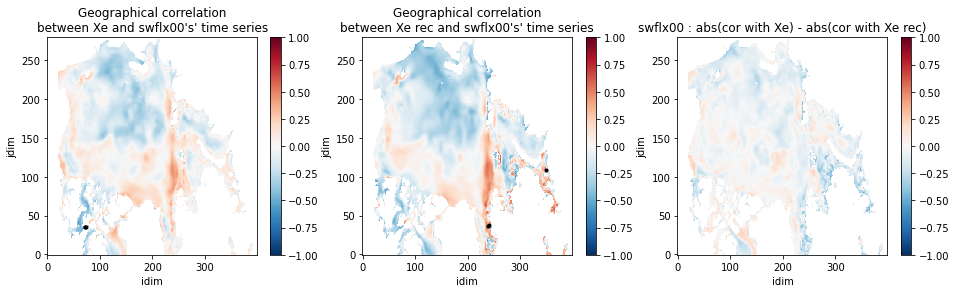

rank 1 : -0.7536076063784963 for idim=148, jdim=0
rank 2 : -0.7447443286107142 for idim=148, jdim=1
rank 3 : -0.7438648544139649 for idim=147, jdim=4

rank 1 : -0.8394631486071591 for idim=87, jdim=0
rank 2 : -0.8233845993888532 for idim=108, jdim=24
rank 3 : -0.8220852716345504 for idim=110, jdim=22



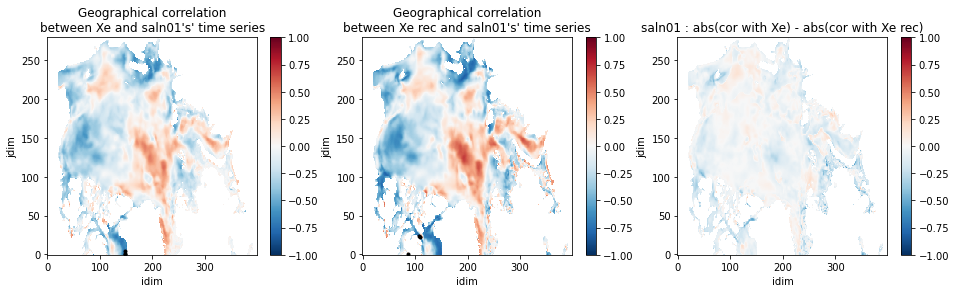

rank 1 : 0.5843976890723827 for idim=113, jdim=54
rank 2 : 0.5694400759957708 for idim=81, jdim=77
rank 3 : -0.5608541047832254 for idim=221, jdim=112

rank 1 : 0.7074915537231479 for idim=281, jdim=64
rank 2 : -0.700937207040475 for idim=193, jdim=124
rank 3 : -0.7008524977272625 for idim=193, jdim=125



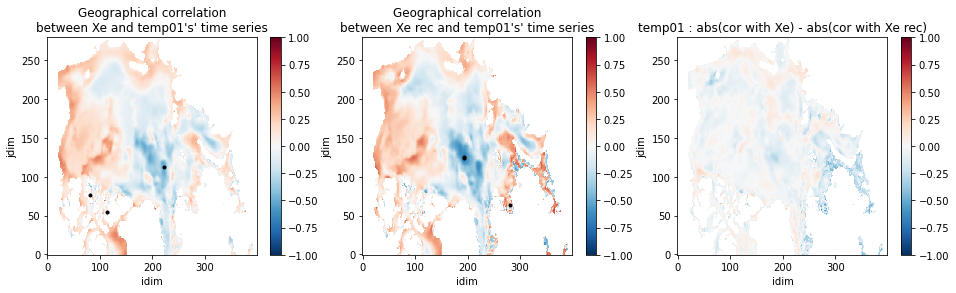

rank 1 : 0.5803671341805691 for idim=376, jdim=57
rank 2 : -0.5582283513642858 for idim=176, jdim=61
rank 3 : 0.5359865683653378 for idim=164, jdim=63

rank 1 : 0.6031291613193094 for idim=119, jdim=50
rank 2 : -0.6010281378923613 for idim=176, jdim=61
rank 3 : 0.567601670706025 for idim=376, jdim=57



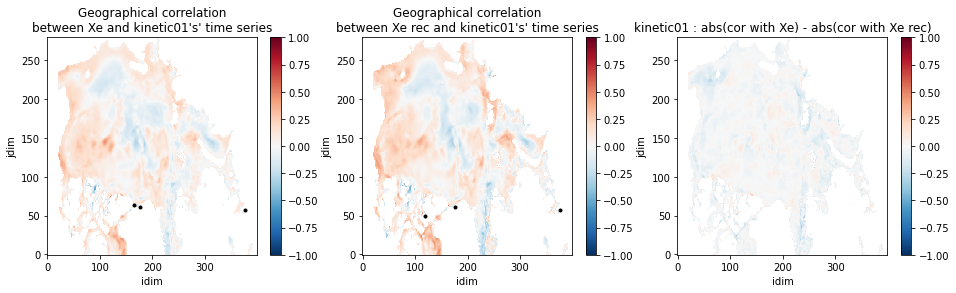

rank 1 : -0.5897920430580954 for idim=377, jdim=55
rank 2 : 0.5193206285155908 for idim=377, jdim=57
rank 3 : -0.5050028356678475 for idim=165, jdim=61

rank 1 : -0.5168394453111578 for idim=105, jdim=12
rank 2 : -0.4983587923055245 for idim=165, jdim=61
rank 3 : 0.47050200203320786 for idim=377, jdim=57



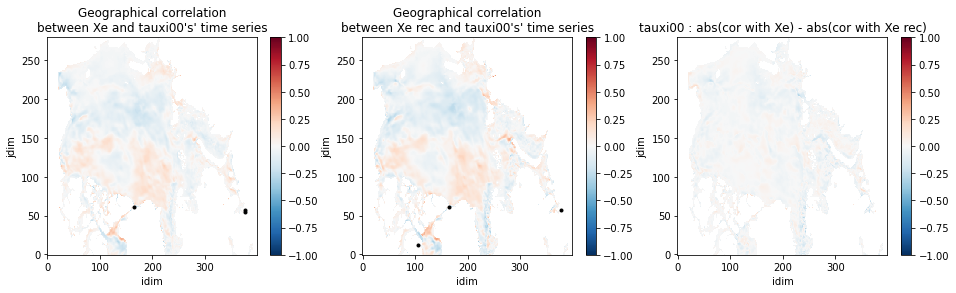

rank 1 : 0.5806535536123544 for idim=376, jdim=57
rank 2 : 0.5363047414804578 for idim=164, jdim=65
rank 3 : 0.5248858740713628 for idim=164, jdim=63

rank 1 : -0.6256701766801654 for idim=176, jdim=61
rank 2 : -0.5793468715737489 for idim=119, jdim=50
rank 3 : 0.5639104879793683 for idim=376, jdim=57



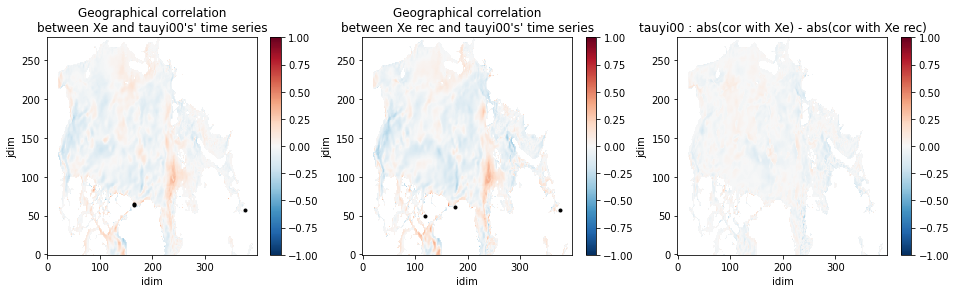

rank 1 : 0.7462876876215986 for idim=168, jdim=165
rank 2 : 0.7232838159555909 for idim=144, jdim=102
rank 3 : 0.714711091704801 for idim=146, jdim=101

rank 1 : -0.8467781264568744 for idim=173, jdim=153
rank 2 : 0.7973568838151617 for idim=169, jdim=166
rank 3 : -0.7947753121154449 for idim=174, jdim=152



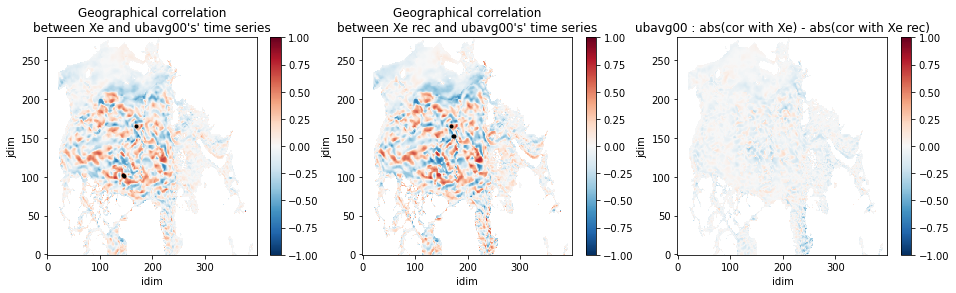

rank 1 : 0.7269182480055819 for idim=140, jdim=97
rank 2 : 0.7129095458688443 for idim=107, jdim=194
rank 3 : 0.7044588943159725 for idim=107, jdim=195

rank 1 : -0.8151597426498335 for idim=178, jdim=130
rank 2 : -0.7958269988359667 for idim=178, jdim=129
rank 3 : -0.7909864986809008 for idim=179, jdim=131



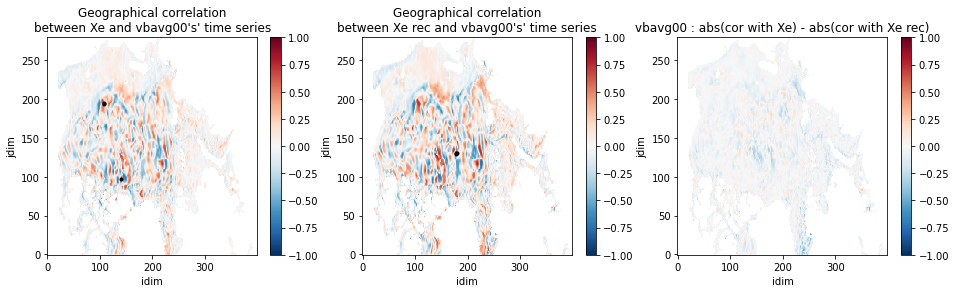

rank 1 : -1.0 for idim=311, jdim=42
rank 2 : 0.9999223969166307 for idim=249, jdim=22
rank 3 : -0.9946411788224989 for idim=298, jdim=111

rank 1 : -0.9999223969166204 for idim=249, jdim=22
rank 2 : 0.999695787352267 for idim=304, jdim=112
rank 3 : -0.9992373237109847 for idim=303, jdim=89

rank 1 : 0.6069190513150894 for idim=105, jdim=12
rank 2 : 0.5847111226216201 for idim=377, jdim=55
rank 3 : -0.5216505525985417 for idim=377, jdim=57

rank 1 : 0.6172306282998508 for idim=105, jdim=12
rank 2 : -0.6040082561904367 for idim=139, jdim=20
rank 3 : -0.6020930159930483 for idim=138, jdim=20



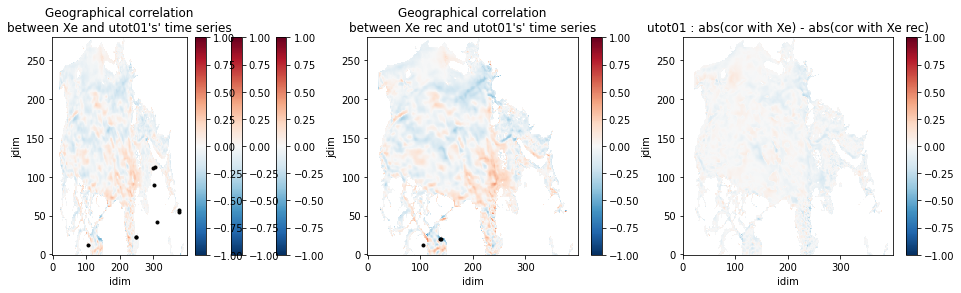

rank 1 : -0.5908678132887117 for idim=376, jdim=57
rank 2 : -0.5612318353646649 for idim=165, jdim=65
rank 3 : -0.5544901464409777 for idim=165, jdim=66

rank 1 : 0.6298982227717521 for idim=176, jdim=61
rank 2 : -0.5690753182198985 for idim=376, jdim=57
rank 3 : -0.5343299555460173 for idim=164, jdim=66



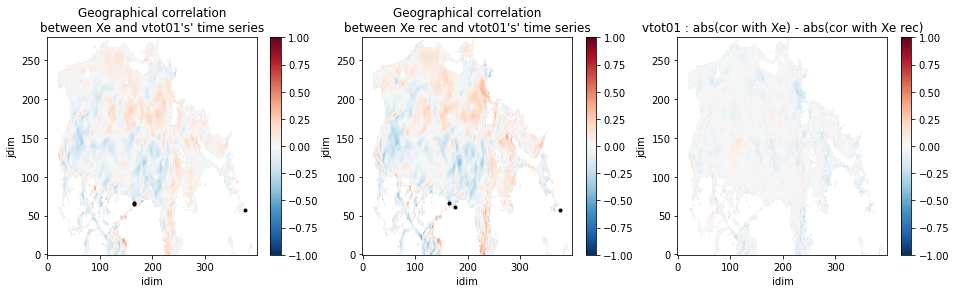

In [117]:
subplot_space_cor([geo_cor_cov, geo_cor_cov_rec], n=3, label=["Xe", "Xe rec"])

rank 1 : -0.6209078952910716 for idim=72, jdim=35
rank 2 : -0.5973648764944065 for idim=71, jdim=35
rank 3 : -0.5970538117558438 for idim=73, jdim=35

rank 1 : 0.6874566767695324 for idim=49, jdim=99
rank 2 : 0.6861369368611921 for idim=281, jdim=64
rank 3 : 0.6853907651371047 for idim=365, jdim=58



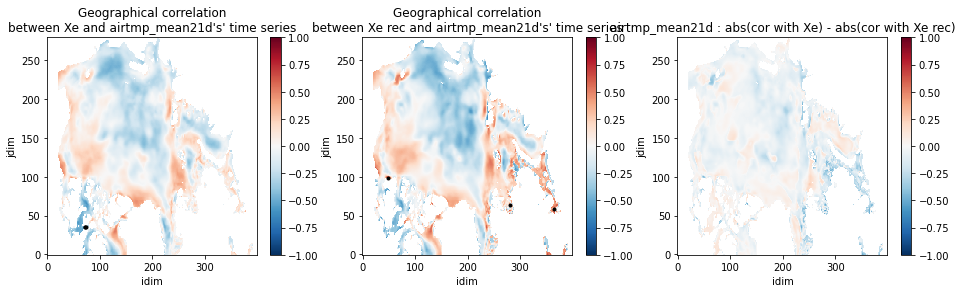

rank 1 : -0.6162108593524336 for idim=72, jdim=35
rank 2 : -0.5939664331427547 for idim=74, jdim=66
rank 3 : -0.5939117058085076 for idim=71, jdim=35

rank 1 : 0.6906865018268796 for idim=49, jdim=99
rank 2 : 0.680188798366876 for idim=50, jdim=99
rank 3 : 0.6745714122279017 for idim=48, jdim=99



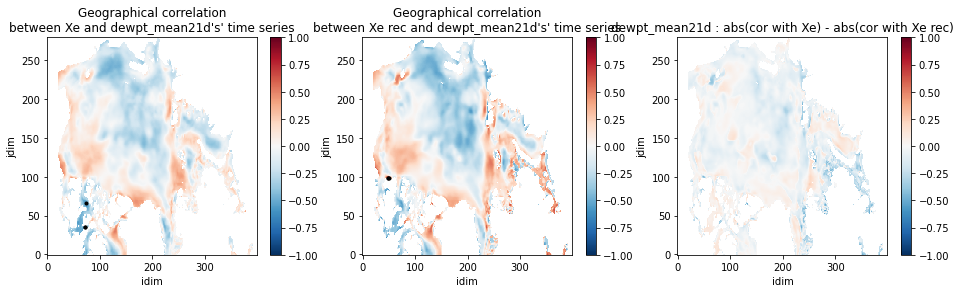

rank 1 : -0.5569252592844618 for idim=127, jdim=7
rank 2 : -0.5556422029382821 for idim=128, jdim=8
rank 3 : -0.5551532280565639 for idim=134, jdim=0

rank 1 : 0.6023108851407313 for idim=235, jdim=41
rank 2 : 0.5831854013920499 for idim=235, jdim=42
rank 3 : -0.5790110389597881 for idim=32, jdim=117



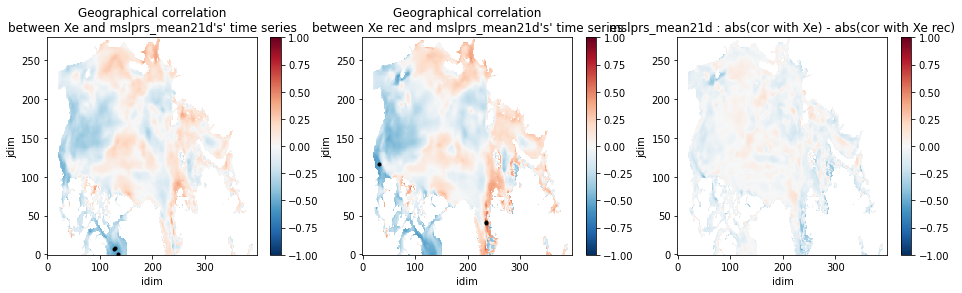

rank 1 : 0.5237618109738379 for idim=71, jdim=35
rank 2 : -0.5162522301168381 for idim=107, jdim=44
rank 3 : -0.5085527930550718 for idim=107, jdim=43

rank 1 : 0.6379239052671686 for idim=364, jdim=61
rank 2 : -0.62720810468183 for idim=280, jdim=57
rank 3 : 0.6259439316296055 for idim=362, jdim=60



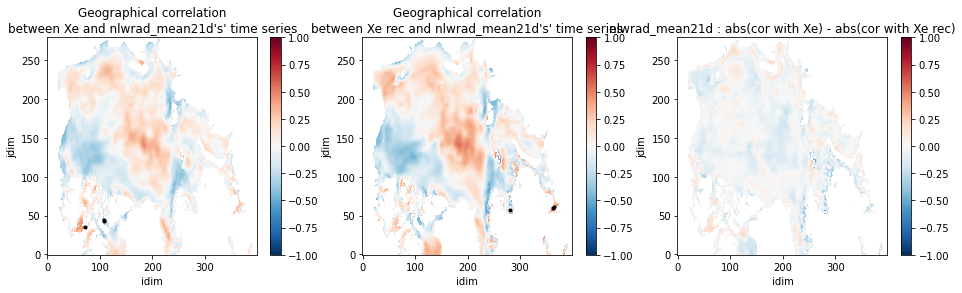

rank 1 : -0.7132353235521677 for idim=59, jdim=41
rank 2 : -0.7108167217829707 for idim=59, jdim=40
rank 3 : -0.7054701852694585 for idim=58, jdim=40

rank 1 : 0.7151837878520715 for idim=240, jdim=38
rank 2 : 0.7036488366084079 for idim=238, jdim=37
rank 3 : 0.6932707822691305 for idim=238, jdim=38



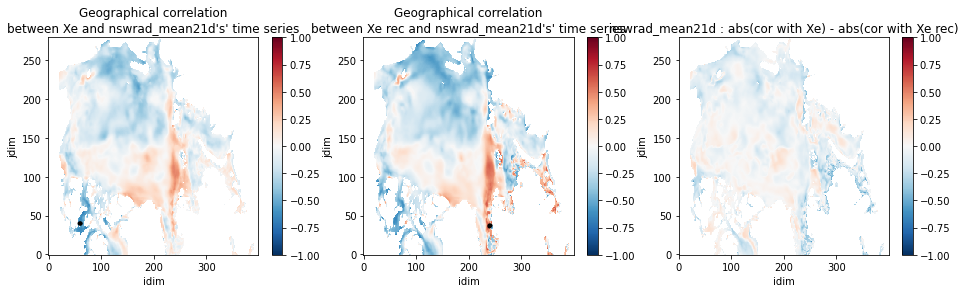

rank 1 : -0.5678055590868649 for idim=93, jdim=89
rank 2 : 0.5369219950495356 for idim=148, jdim=48
rank 3 : -0.5338471574214995 for idim=91, jdim=88

rank 1 : 0.6349939699055068 for idim=233, jdim=189
rank 2 : 0.633819857870962 for idim=233, jdim=188
rank 3 : 0.6336222721065339 for idim=232, jdim=188



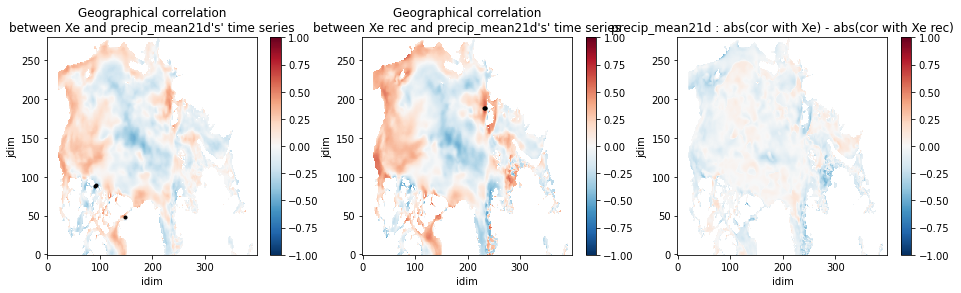

rank 1 : -0.6224283325530319 for idim=72, jdim=35
rank 2 : -0.6008931672164582 for idim=71, jdim=35
rank 3 : -0.5959762971855336 for idim=73, jdim=35

rank 1 : 0.7052655797476838 for idim=49, jdim=99
rank 2 : 0.6940436859664233 for idim=50, jdim=99
rank 3 : 0.6918415793017397 for idim=48, jdim=99



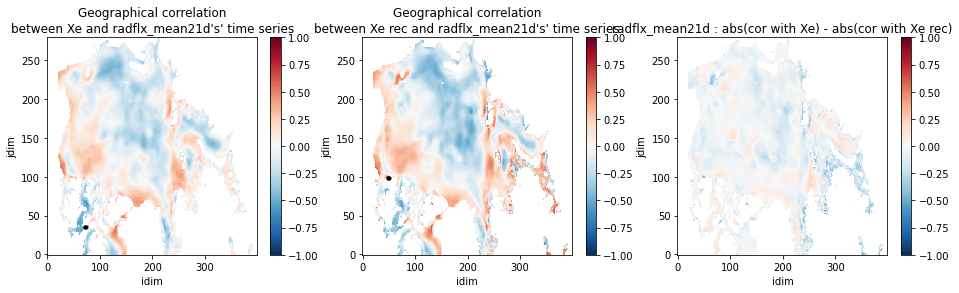

rank 1 : -0.8468690713918703 for idim=81, jdim=29
rank 2 : -0.8438559981039846 for idim=80, jdim=29
rank 3 : -0.8420362134393864 for idim=79, jdim=28

rank 1 : -0.8468536472762246 for idim=207, jdim=249
rank 2 : -0.845766590402163 for idim=207, jdim=250
rank 3 : -0.842577907478409 for idim=101, jdim=269



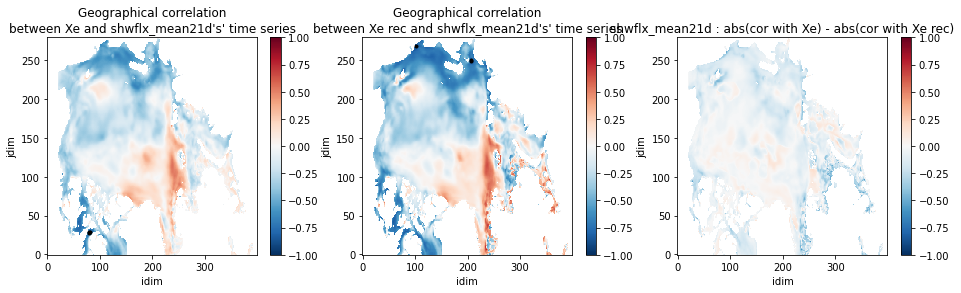

rank 1 : -0.6475340019589704 for idim=72, jdim=35
rank 2 : -0.6237370717474707 for idim=73, jdim=35
rank 3 : -0.6156396105138091 for idim=71, jdim=35

rank 1 : 0.6774165289095067 for idim=281, jdim=64
rank 2 : 0.6720383057752123 for idim=258, jdim=131
rank 3 : 0.6653393056394366 for idim=49, jdim=99



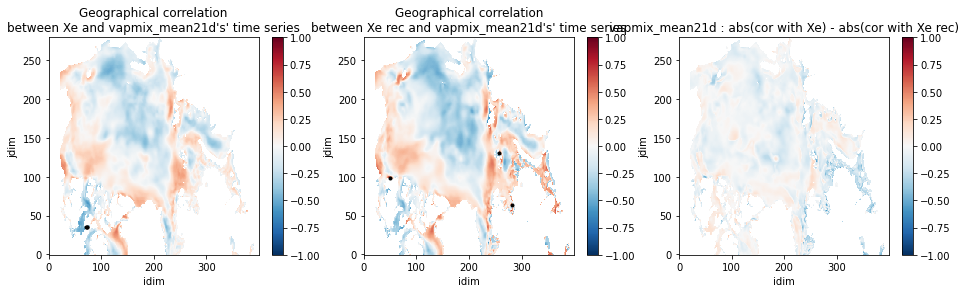

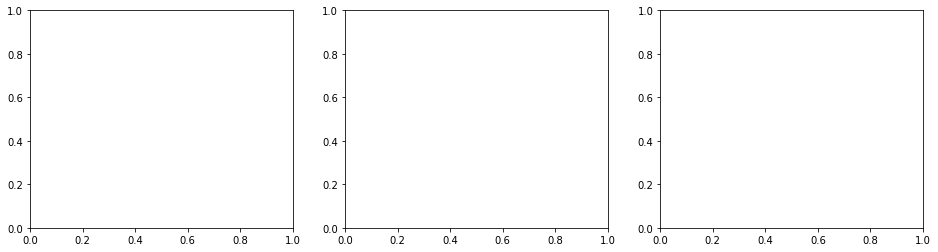

In [118]:
subplot_space_cor([geo_cor_fgs, geo_cor_fgs_rec], n=3, label=["Xe", "Xe rec"])

## Basic statistic data about how values are distributed <a class="anchor" id="part3_1"></a>

Several kind of plot :
- Distribution of the different parameters for each PC
- Distribution of each PC for each parameter

### Correlations of the different variables between them 

In [29]:
def plot_boxplot(cor, xlabels, title=''):
    fig, ax = plt.subplots(figsize=(12,6))
    plt.boxplot(x=list(map(abs, cor)))
    plt.xticks(range(1, len(xlabels) + 1), xlabels, rotation= -25)
    plt.ylabel('Correlation value (abs)')
    plt.title(f'Boxplot {title}')

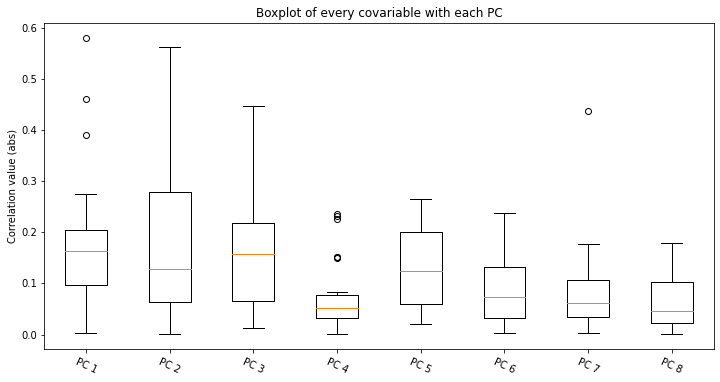

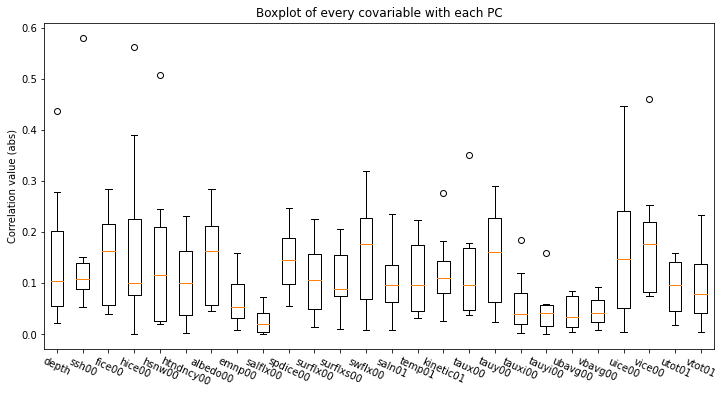

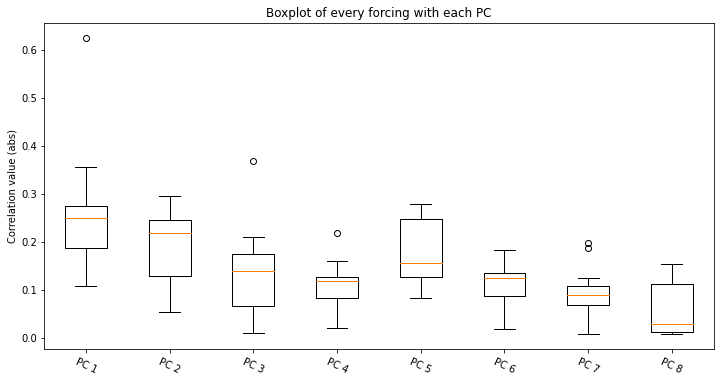

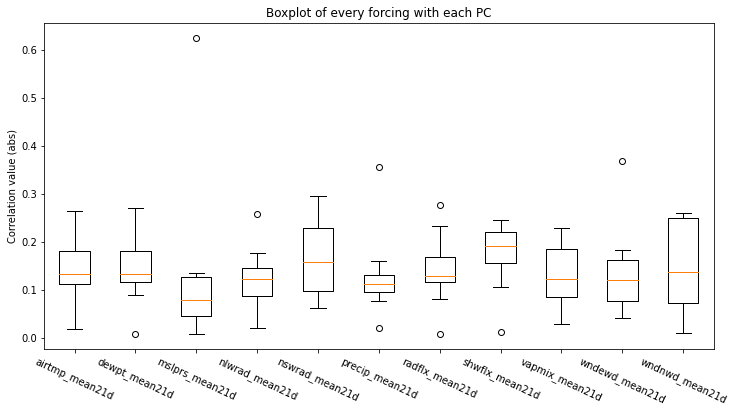

In [30]:
#### covariables

# mean over fields, print for each pca
plot_boxplot(cor_cov, [f"PC {i}" for i in range(1, len(cor_cov) + 1)], title='of every covariable with each PC')
plt.show() 


# mean over pca, print for each field
cor_fields = [(np.array([elem[i] for elem in cor_cov])) for i in range(len(fields))]
plot_boxplot(cor_fields, fields, title='of every covariable with each PC')
plt.show()


#### forcings

# mean over fields, print for each pca
plot_boxplot(cor_f, [f"PC {i}" for i in range(1, len(cor_f) + 1)], title='of every forcing with each PC')
plt.show() 

# mean over pca, print for each field
cor_fields = [(np.array([elem[i] for elem in cor_f])) for i in range(len(f_fields))]
plot_boxplot(cor_fields, f_fields, title='of every forcing with each PC')
plt.show()

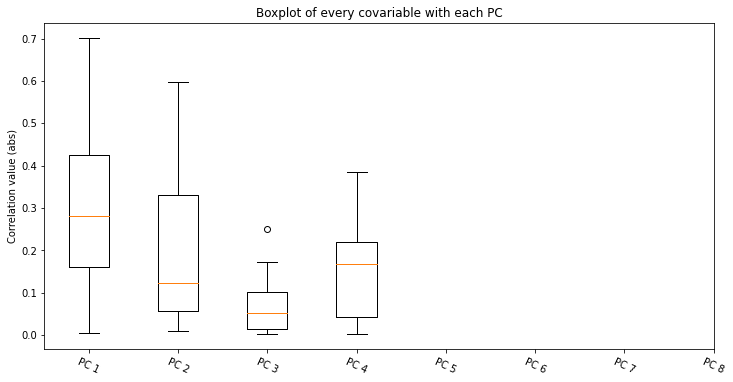

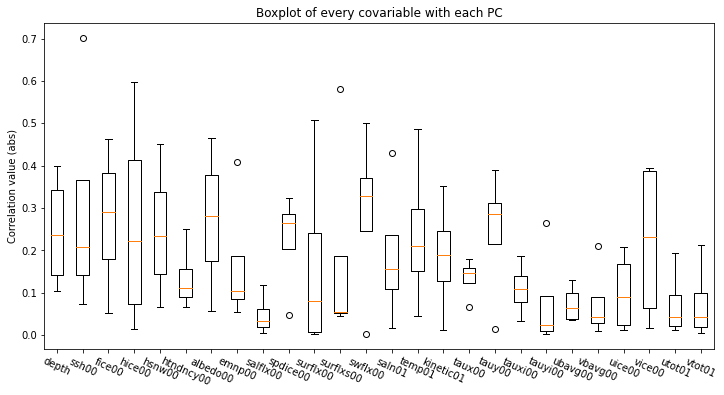

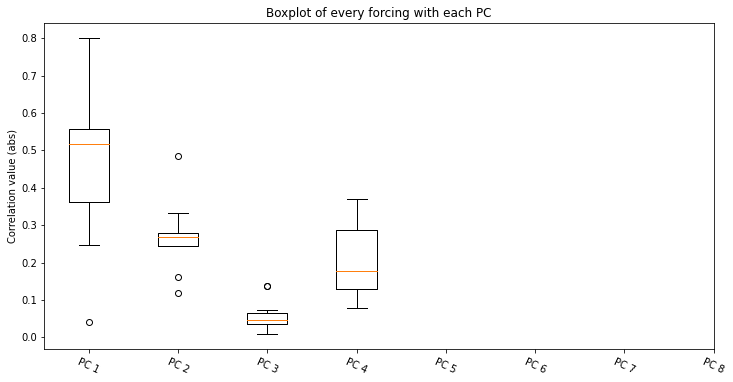

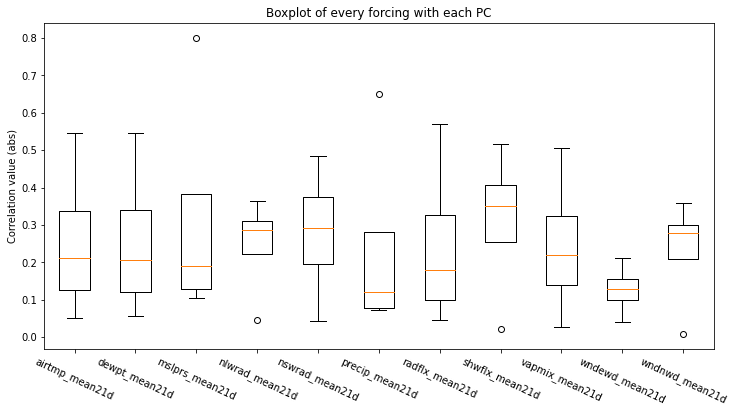

In [34]:
########### with pca_f


#### covariables

# mean over fields, print for each pca
plot_boxplot(cor_cov_forecast, [f"PC {i}" for i in range(1, len(cor_cov) + 1)], title='of every covariable with each PC')
plt.show() 


# mean over pca, print for each field
cor_fields = [(np.array([elem[i] for elem in cor_cov_forecast])) for i in range(len(fields))]
plot_boxplot(cor_fields, fields, title='of every covariable with each PC')
plt.show()


#### forcings

# mean over fields, print for each pca
plot_boxplot(cor_f_forecast, [f"PC {i}" for i in range(1, len(cor_f) + 1)], title='of every forcing with each PC')
plt.show() 

# mean over pca, print for each field
cor_fields = [(np.array([elem[i] for elem in cor_f_forecast])) for i in range(len(f_fields))]
plot_boxplot(cor_fields, f_fields, title='of every forcing with each PC')
plt.show()

In [35]:
"""
cor_abs_mean = [np.mean(np.absolute(cor_1t[i])) for i in range(len(cor_1t))]
fig, ax = plt.subplots(figsize=(12,6))
plt.bar(x=np.arange(len(cor_1t)),height=list(map(abs, cor_abs_mean)))
plt.xticks(range(0, len(cor_1t)), [f"PC {i}" for i in range(1, len(cor_1t) + 1)])
plt.ylabel('Correlation value (abs)')
plt.title(f'Mean correlation of each forcing with each PC of pca_e')
plt.show()
"""

'\ncor_abs_mean = [np.mean(np.absolute(cor_1t[i])) for i in range(len(cor_1t))]\nfig, ax = plt.subplots(figsize=(12,6))\nplt.bar(x=np.arange(len(cor_1t)),height=list(map(abs, cor_abs_mean)))\nplt.xticks(range(0, len(cor_1t)), [f"PC {i}" for i in range(1, len(cor_1t) + 1)])\nplt.ylabel(\'Correlation value (abs)\')\nplt.title(f\'Mean correlation of each forcing with each PC of pca_e\')\nplt.show()\n'

In [36]:
def plot_mean_correlation_pca(cor, fields):
    """ Plot the correlation between each parameters of nc with pca. Do the mean over all years on parameters data.
    In:
        cor    : numpy.ndarray -- 2D array, (n_component, field) with correlations values
        fields : String list   -- name of all parameters kept for plot
    """
    means = [np.mean(np.array([elem[i] for elem in cor])) for i in range(len(fields))]

    fig, ax = plt.subplots(figsize=(12,6))
    plt.bar(x=np.arange(len(fields)), height=list(map(abs, means)))

    plt.xticks(range(len(fields)), fields, rotation= -25)
    plt.ylabel('Correlation value (abs)')
    plt.title(f'Correlation beatween each forcing and pca_e (mean)')
    plt.show()

In [37]:
# one time
#plot_mean_correlation_pca(cor_1t, fields)

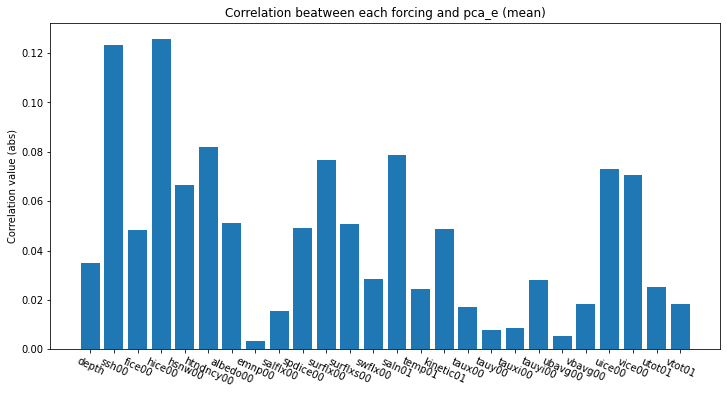

In [38]:
# mean all years
plot_mean_correlation_pca(cor_cov, fields)

## Try to find similarities in the temporal evolution <a class="anchor" id="part3_3"></a>

As we have 3D data (t, y, x) and it's a spectral analysis tool, basic function are developed for 1D time serie.

Differents option to do so :
-  __TODO__ : find how to calculate in a relevant way for 2Dspace + 1Dtime data
- Transform our data into 1D
    - Mean of all spatial data at each time [mean(t1) ... mean(tn)] : t values
    - Use x*y time serie to have the temporal evolution in each point
    -  __TODO__ : identify areas where the points have similar behavior to limit the number of time series



### Autocorrelation (on reverse time serie) <a class="anchor" id="part3_3_1"></a>

Study the correlation of a time series with itself at different times. Calculation on reverse time series to see the links with future versions (and eventually go back in time)

In [39]:
#from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf

def autocorr_space_time(X, title_complement="", plot_sol_3=False):
    """ Plot the autocorrelation of the given data (reverse)
    In:
        X                : numpy.ndarray or xarray.core.dataarray.DataArray -- data to plot dim (t, x, y)
        title_complement : String                                           -- if need a complement for plot title
        plot_sol_3       : boolean                                          -- plot sol 3 (avoid as it's to long and plot to much)
    """

    if type(X) is np.ndarray:
        X_nonan = X[np.isfinite(X)]
    else:
        X_nonan = X.values[np.isfinite(X.values)]
    X_nonan_reverse = X_nonan[...,::-1]
    X_nonan_reverse = np.reshape(X_nonan_reverse, (X.shape[0], X_nonan.shape[0]//X.shape[0]))

    # problem : we have dims (t, space) with space = vectorization of (x, y) and we need only 1 dim
    ## sol 1 : each point (maybe later zone) at each time give us a time serie space plots) -> correlation between zones ?
    ## sol 2 : mean of error on all point at each time (time plot)
    ## sol 3 : 1 plot / point

    ## sol 1
    X_space_mean = np.array([np.mean(X_nonan_reverse[:, a]) for a in range(X_nonan_reverse.shape[1])])
    plot_acf(X_space_mean, fft=True, auto_ylims=True, title=f'Autocorrelation on reverse time (between point) {title_complement}')
    plt.show()

    ## sol 2
    X_time_mean = np.array([np.mean(X_nonan_reverse[t]) for t in range(X_nonan_reverse.shape[0])])
    plot_acf(X_time_mean, fft=True, auto_ylims=True, title=f'Autocorrelation on reverse time (mean error for each time) {title_complement}')
    plt.show()
    
    ## sol3
    if plot_sol_3:
        for point in range(X_nonan_reverse.shape[1]):
            plot_acf(X_nonan_reverse[:, point], fft=True, auto_ylims=True, title=f'Autocorrelation on reverse time (for each point) {title_complement}')
            plt.show()

In [40]:
def sort_dates(chrono, X, metric='month'):
    """ Sort X 
    In:
        chrono :
        X      : xarray.core.dataarray.DataArray
        metric : String                          -- metric to use for sorting among ['month', 'week', 'quarter']
    Out:
        X_mt : numpy.ndarray -- X with shape(12*nb_years, y, x)
    """
    
    # Autocorrelation between months
    time = pd.DataFrame([chrono.values]).transpose()
    
    if metric == "month":
        time['month'] = time[0].dt.month
        nb_occ_year = 12
    elif metric == "week":
        time['week'] = time[0].dt.isocalendar().week
        nb_occ_year = 52
    elif metric == "quarter":
        time['quarter'] = time[0].dt.quarter
        nb_occ_year = 4
    else:
        raise ValueError(f"Unknown metric '{metric}'")
    
    time['year'] = time[0].dt.year
    time.drop(0, axis=1, inplace=True)
    years = np.unique(chrono.values.astype('datetime64[Y]').astype(int) + 1970)

    X_mt = [0 for i in range((len(years)*nb_occ_year))]

    i = 0
    for year in years:
        for m in range(1, nb_occ_year+1):
            idx = time.index.where((time[metric]==m) & (time['year']==year))
            idx = idx.dropna().astype(int)  # integer without nan

            # compute means (mt for mean temporal)
            X_mt[i] = np.mean(X.isel(rdim=idx.values),axis=(0)).values
            
            i += 1
    return np.array(X_mt)

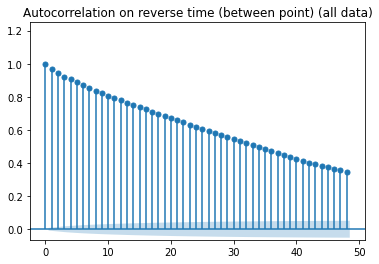

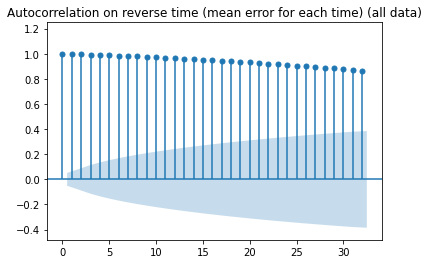

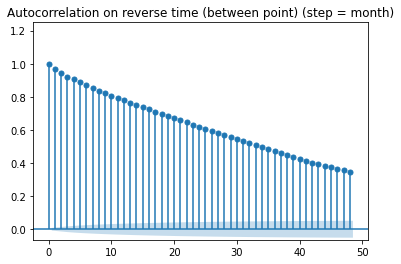

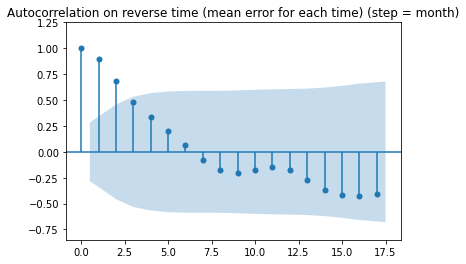

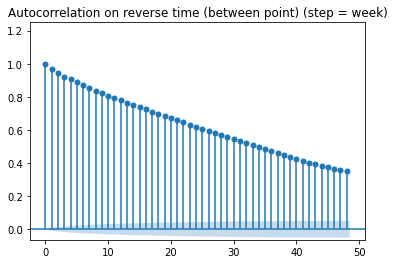

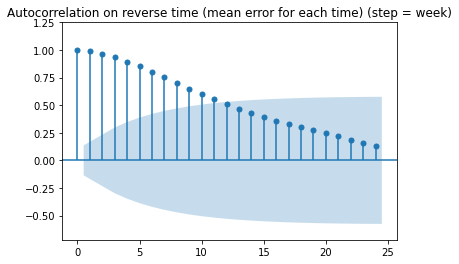

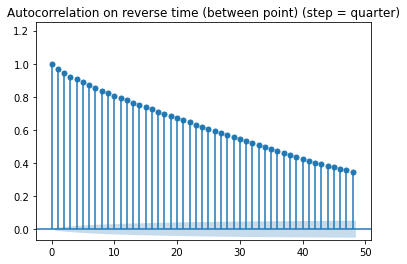

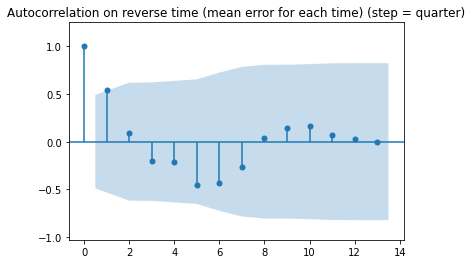

In [41]:
metrics = ['month', 'week', 'quarter']

#autocorrelation all data
autocorr_space_time(Xe, "(all data)")

for m in metrics:
    #autocorrelation, timestep = metric m
    autocorr_space_time(sort_dates(chrono, Xe, m), f"(step = {m})")

### Cross correlation <a class="anchor" id="part3_3_2"></a>
Study the links between different time series : between the evolution of the differents parameters and the error

In [9]:
from statsmodels.tsa.stattools import ccf

def apply_mask_nonan(X, index_mask):
    X = X[tuple(index_mask)]
    return X

def keep_nonan_values(X_fields, index_mask):
    #prendre les temps 1 par 1 et appliquer le masque :
    fields = list(X_fields.keys())
    n = index_mask.shape[1]
    nt = X_fields[fields[0]].shape[0]
    X_fields_nonan = dict()
    for field in fields:
        X_fields_nonan[field] = np.empty((nt, n))
        for t in range(nt):
            X_fields_nonan[field][t] = apply_mask_nonan(X_fields[field][t, :, :], index_mask)
    return X_fields_nonan

def compute_crosscorr(X, X_fields, index_mask):
    """ Plot the autocorrelation of the given data (reverse)
    In:
        X        : numpy.ndarray or xarray.core.dataarray.DataArray -- data to plot dim (t, x, y)
        X_fields : numpy.ndarray or xarray.core.dataarray.DataArray -- data to plot dim (t, x, y)
    """

    if type(X) is np.ndarray:
        X_nonan = X[np.isfinite(X)]
    else:
        X_nonan = X.values[np.isfinite(X.values)]
    #X_nonan_reverse = X_nonan[...,::-1]
    X_nonan = np.reshape(X_nonan, (X.shape[0], X_nonan.shape[0]//X.shape[0]))

    # problem : we have dims (t, space) with space = vectorization of (x, y) and we need only 1 dim
    ## sol 1 : each point (maybe later zone) at each time give us a time serie space plots) -> correlation between zones ?
    ## sol 2 : mean of error on all point at each time (time plot)
    ## sol 3 : 1 plot / point
    
    X_space_mean = np.array([np.mean(X_nonan[:, a]) for a in range(X_nonan.shape[1])])
    X_time_mean = np.array([np.mean(X_nonan[t]) for t in range(X_nonan.shape[0])])
    
    # same dim as X without nan : apply a mask to keep same values
    X_fields_nonan = keep_nonan_values(X_fields, index_mask)
    
    X_ms_fields = dict()
    X_mt_fields = dict()
    ccor_laps_space = dict()
    ccor_laps_time = dict()
    
    fields = list(X_fields.keys())
    n = X_fields_nonan[fields[0]].shape[1]
    nt = X_fields_nonan[fields[0]].shape[0]
    
    for field in fields:
        ## sol 1
        X_ms_fields[field] = np.array([np.mean(X_fields_nonan[field][:, a]) for a in range(n)])
        ccor_laps_space[field] = ccf(X_space_mean, X_ms_fields[field]) #adjusted=False

        ## sol 2
        X_mt_fields[field] = np.array([np.mean(X_fields_nonan[field][t]) for t in range(nt)])
        ccor_laps_time[field] = ccf(X_time_mean, X_mt_fields[field]) #adjusted=False
        #plot_sol_3 = False
        #if plot_sol_3:
        #    for point in range(X_nonan_reverse.shape[1]):
        #        plot_acf(X_nonan_reverse[:, point], fft=True, auto_ylims=True, title=f'Autocorrelation on reverse time (for each point) {title_complement}')
        #        plt.show()
                
    return ccor_laps_space, ccor_laps_time, X_ms_fields, X_mt_fields

In [10]:
def plot_crosscor(cor):
    fields = cor.keys()
    for field in fields:
        fig, ax = plt.subplots(figsize=(12,6))
        #plt.bar(x=np.arange(len(cor[field])), height=list(map(abs, cor[field])))
        plt.bar(x=np.arange(len(cor[field])), height=cor[field])

        #plt.xticks(range(len(fields)), fields, rotation= -25)
        plt.ylabel('Correlation value (abs)')
        plt.title(f'Correlation between {field} and Xe')
        plt.show()

In [46]:
# Cross correlation between Xe and forcings' time series
ccor_laps_space_fgs, ccor_laps_time_fgs, X_ms_fgs, X_mt_fgs = compute_crosscorr(Xe, forcings, index_mask)

# Cross correlation between Xe and covariables' time series
#ccor_laps_space_cov, ccor_laps_time_cov, X_ms_cov, X_mt_cov = compute_crosscorr(Xe, nc_f, index_mask)

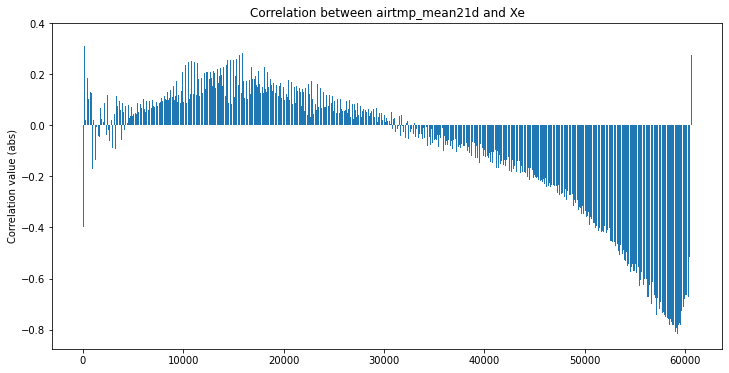

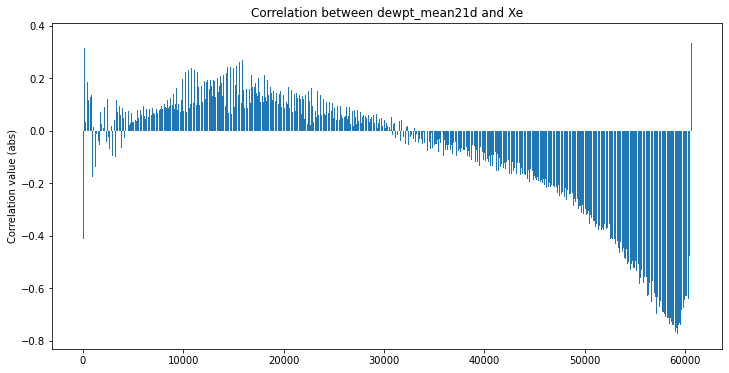

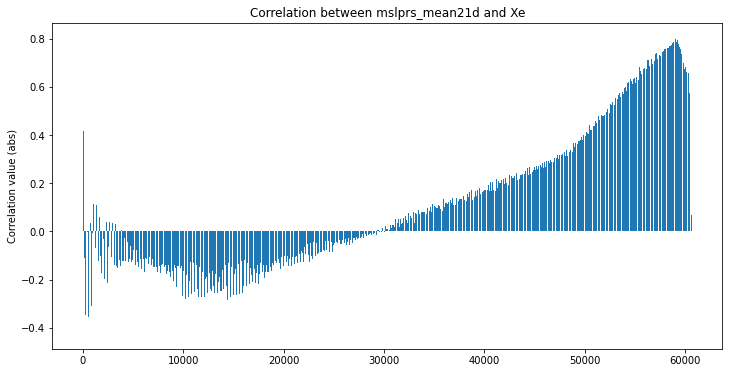

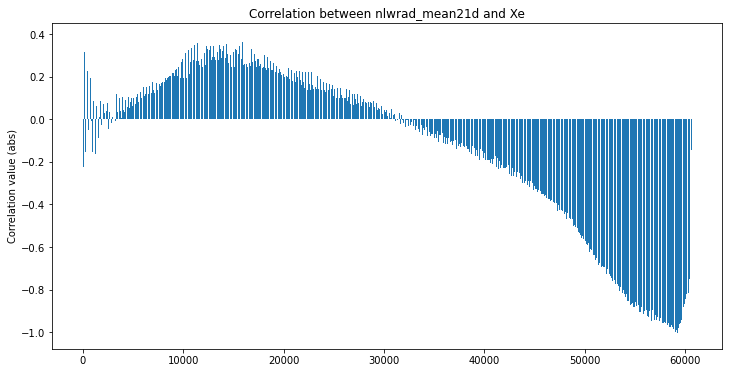

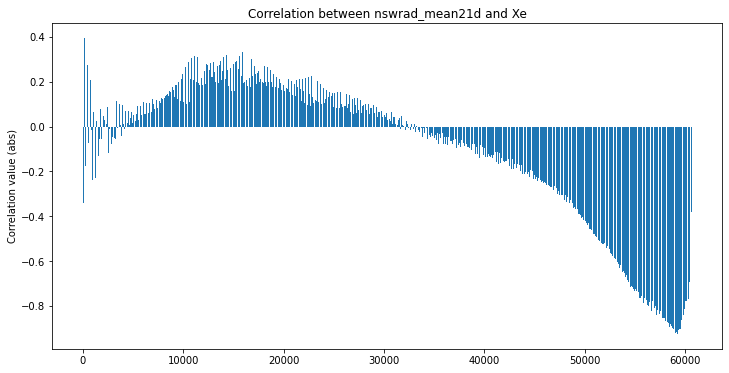

...

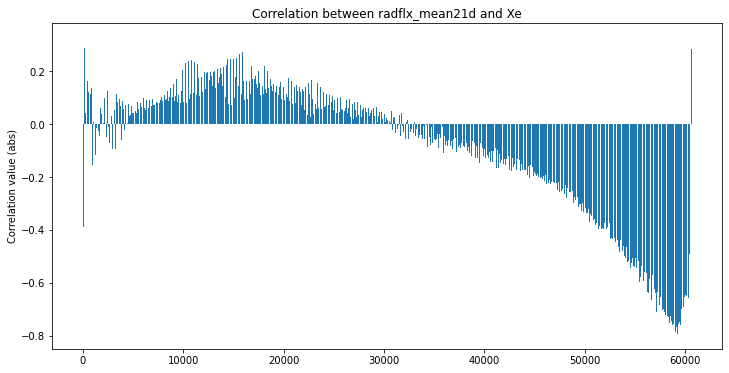

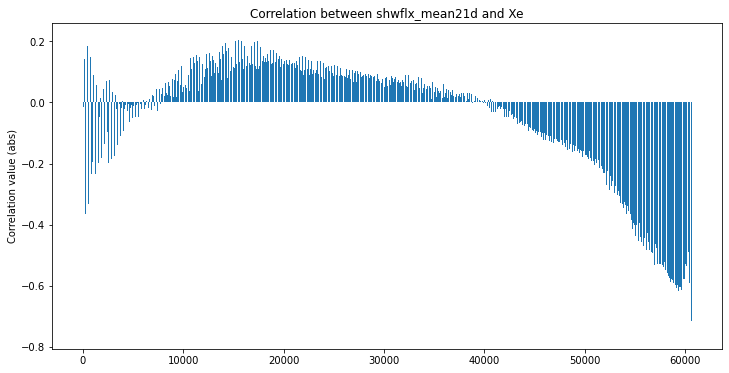

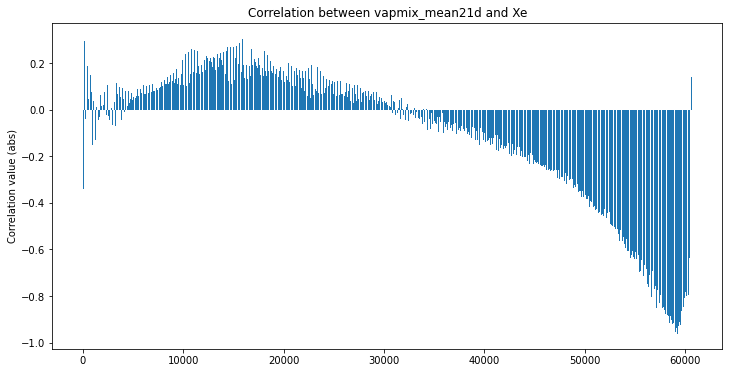

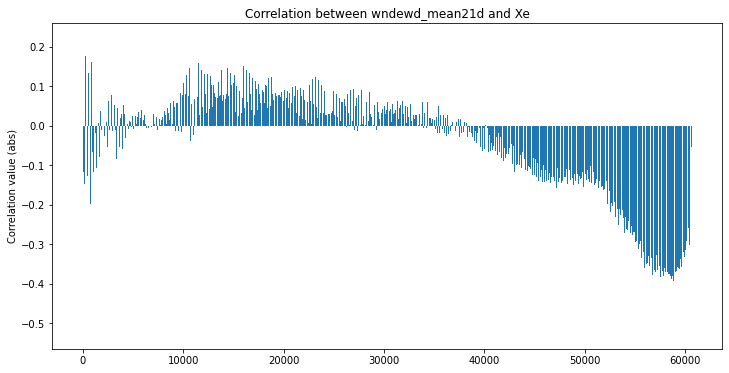

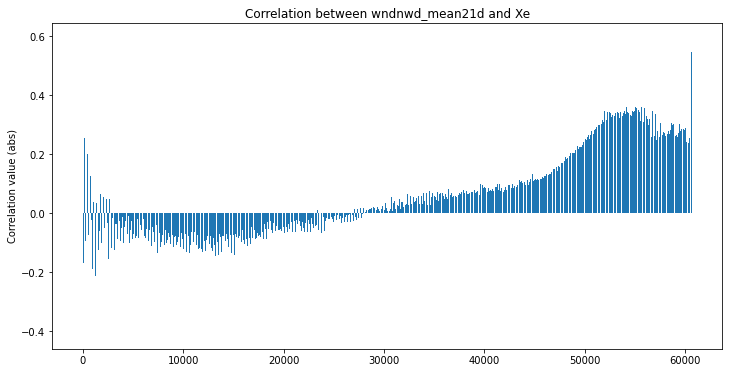

In [55]:
plot_crosscor(ccor_laps_space_fgs)

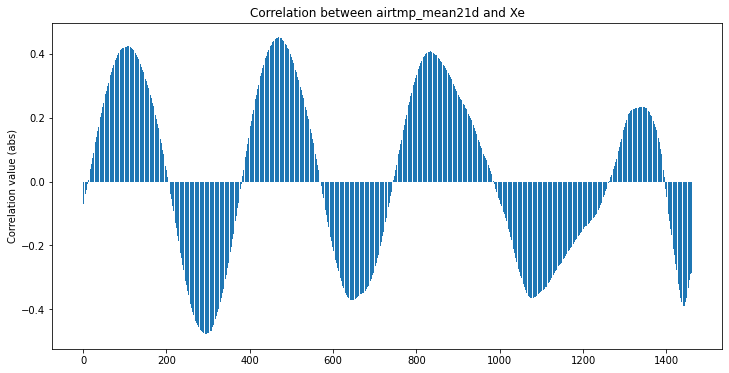

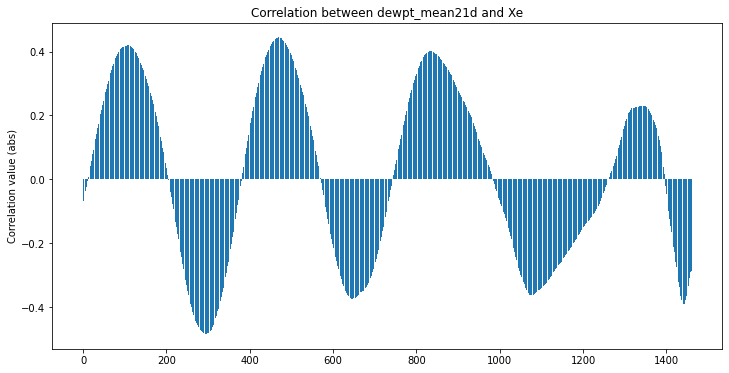

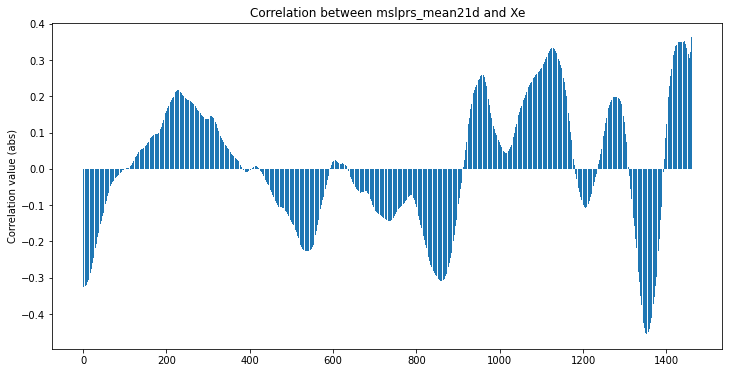

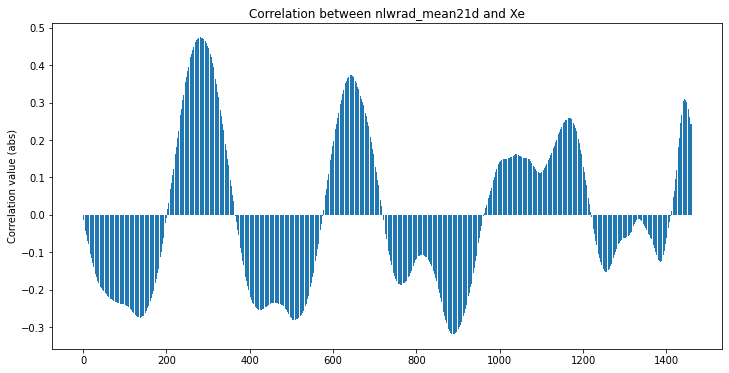

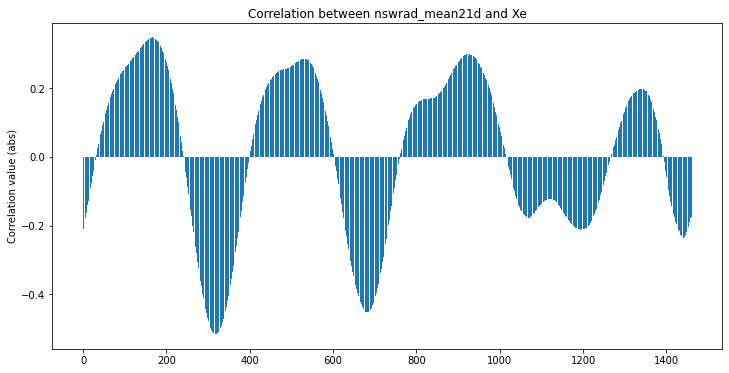

...

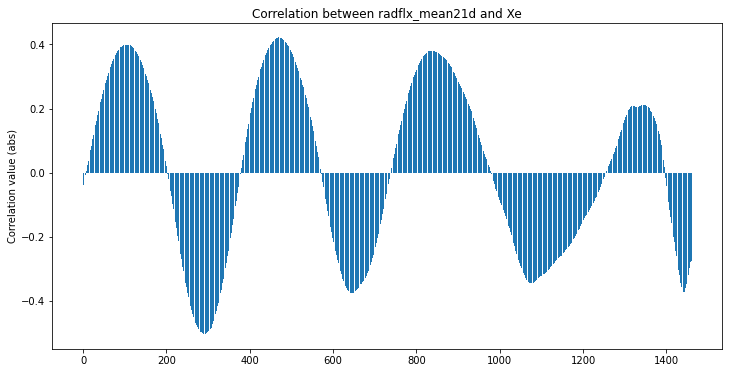

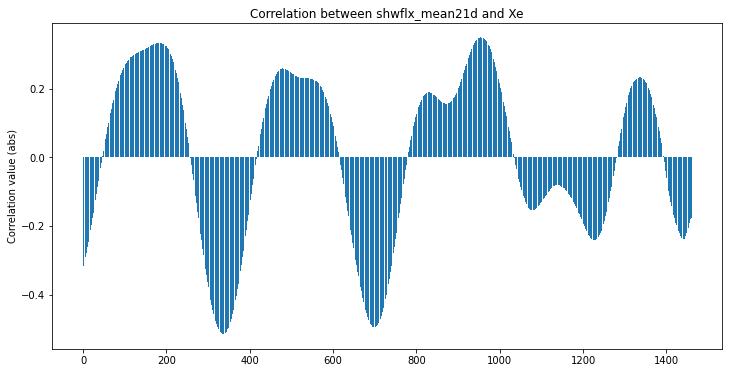

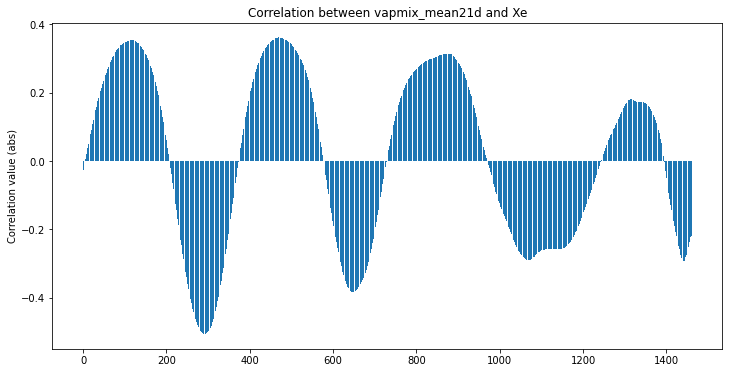

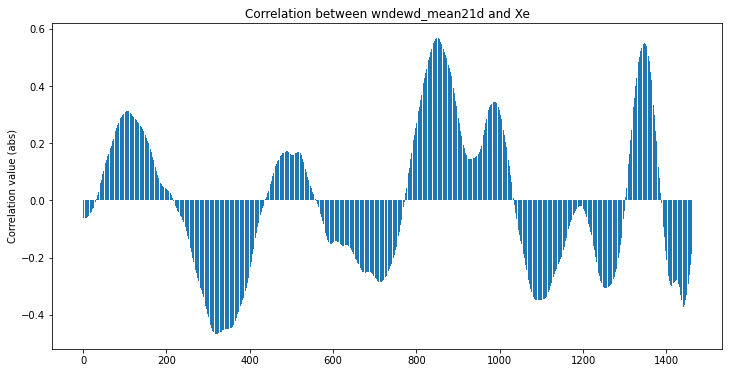

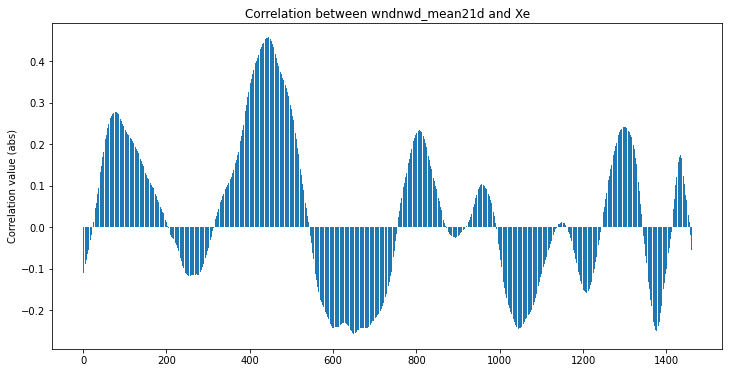

In [56]:
plot_crosscor(ccor_laps_time_fgs)

### Remove the mean

In [ ]:
# TODO
# retirer saisonalité
# plot data pr s'assurer de la période, puis moyenne sur les période et gerte 
# https://machinelearningmastery.com/time-series-seasonality-with-python/

# mb ca cool aussi : https://www.ibm.com/docs/fr/planning-analytics/2.0.0?topic=SSD29G_2.0.0/com.ibm.swg.ba.cognos.tm1_prism_gs.2.0.0.doc/papr_forecast_seasonality.html

In [12]:
def sub_periodic_mean(period, ar):
    """ Compute the mean between each each element spaced by "period" element, and subtract it to them
    In:
        period :
        ar     : -- 1D array
    """
    
    means = np.empty(period)
    
    # Compute the mean between each element spaced by "period"
    for elem in range(period):
        means[elem] = np.array(np.mean([i for i in ar[elem::period]]))

    # Subtract this mean
    return np.array([ar[i]-means[i%period] for i in range(ar.shape[0])])

In [13]:
def sub_periodic_mean_3d(period, ar):
    final_array = np.empty(ar.shape)
    for y in range(ar.shape[1]):
        for x in range(ar.shape[2]):
            final_array[:, y, x] = sub_periodic_mean(period, ar[:, y, x])
    return final_array

In [14]:
allmeans = dict()
for f in forcings.keys():
    print(f)
    allmeans[f] = sub_periodic_mean_3d(365, forcings[f])

airtmp_mean21d
dewpt_mean21d
mslprs_mean21d
nlwrad_mean21d
nswrad_mean21d
precip_mean21d
radflx_mean21d
shwflx_mean21d
vapmix_mean21d
wndewd_mean21d


In [16]:
# get index of non NaN values
sel = nc1["hice00"].sel(jdim=slice(*lim_jdm),idim=slice(*lim_idm)).mean(dim='rdim').values
index_mask = np.argwhere(~np.isnan(sel)).T

ccor_space_fgs, ccor_time_fgs, _, _ = compute_crosscorr(Xe, allmeans, index_mask)

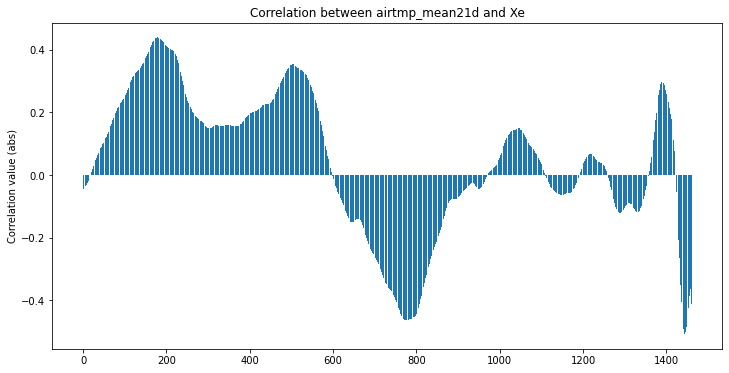

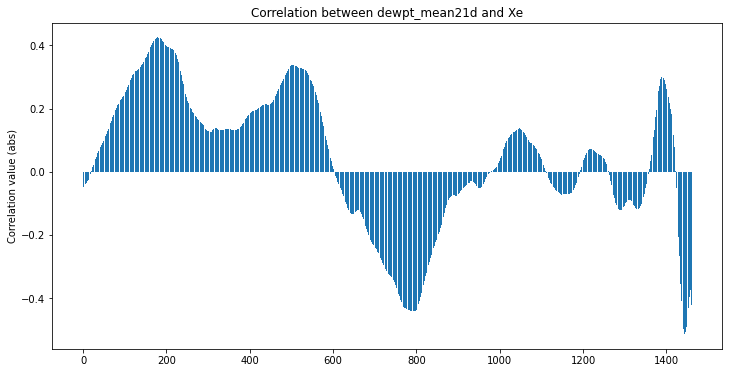

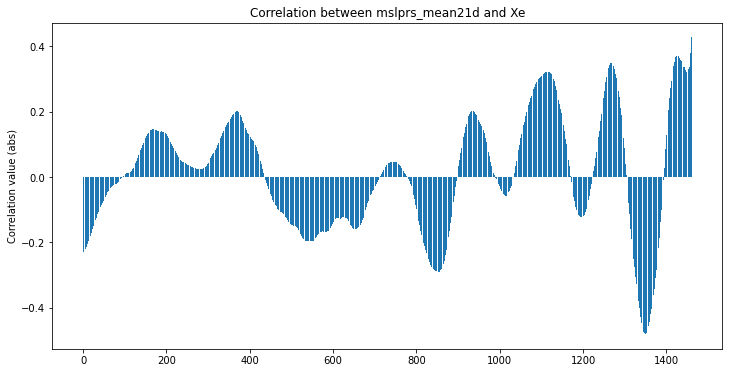

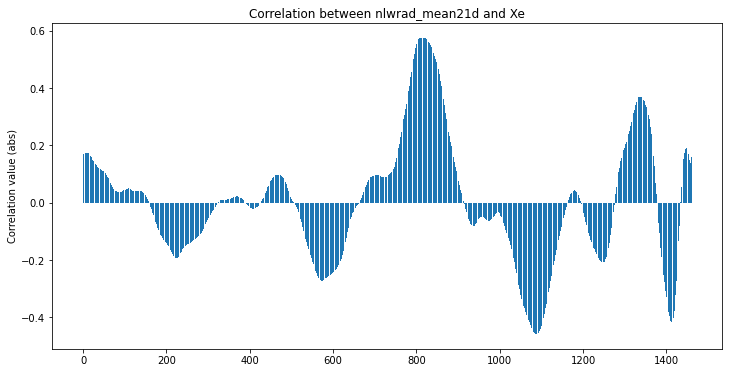

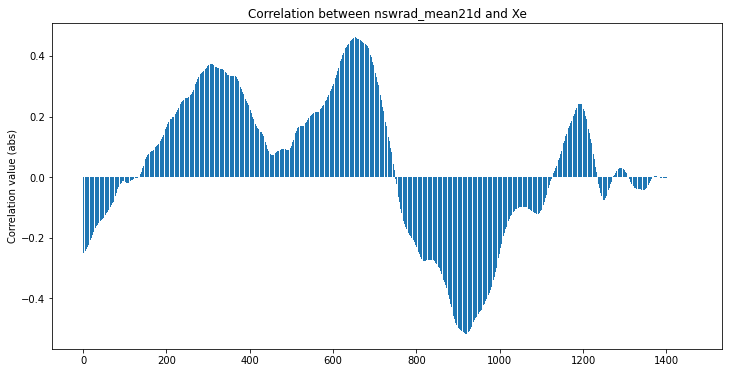

...

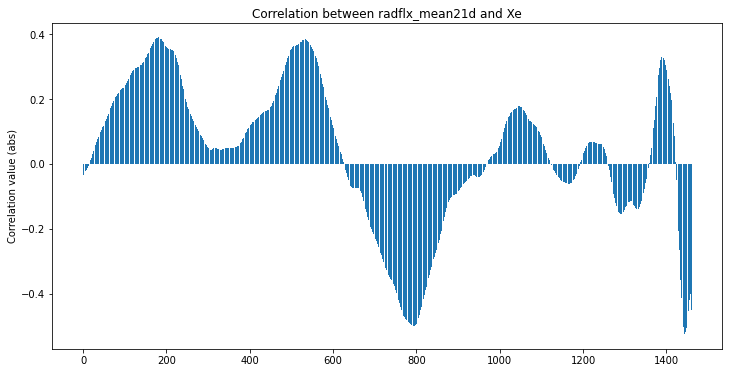

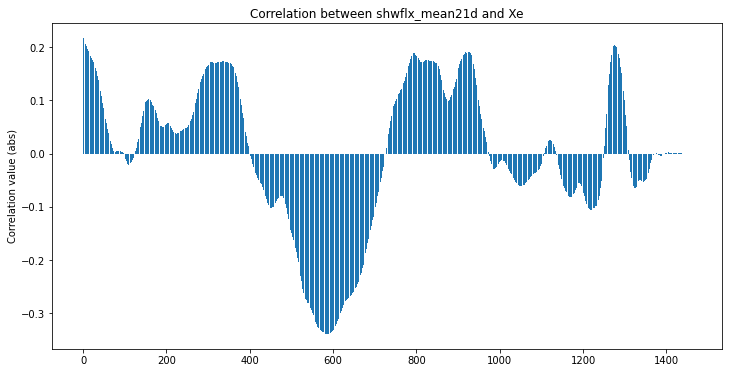

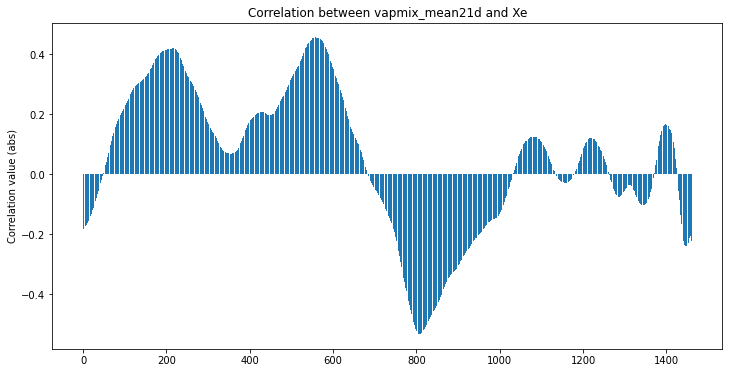

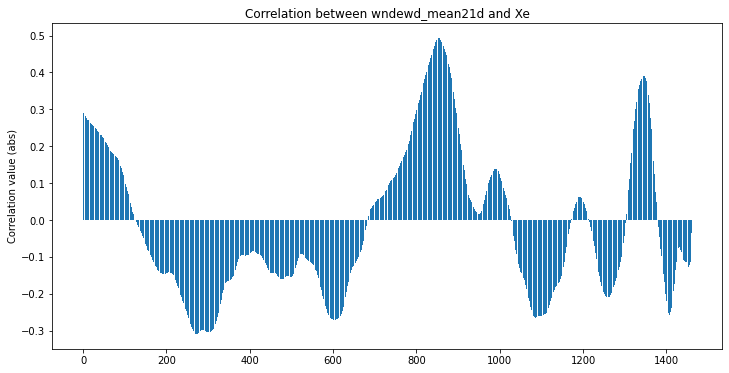

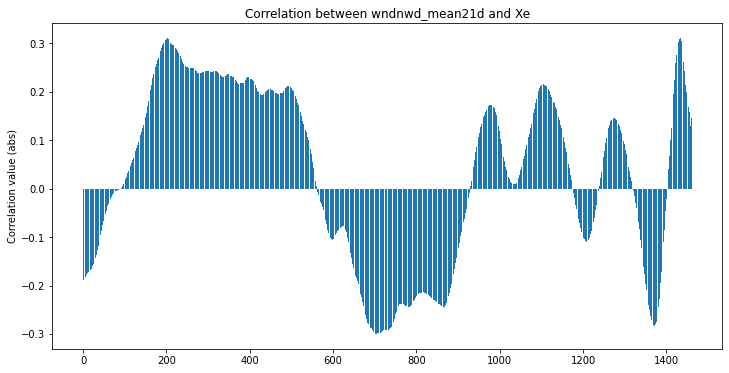

In [17]:
plot_crosscor(ccor_time_fgs)

In [300]:
airmean = sub_periodic_mean_3d(365, forcings["airtmp_mean21d"])

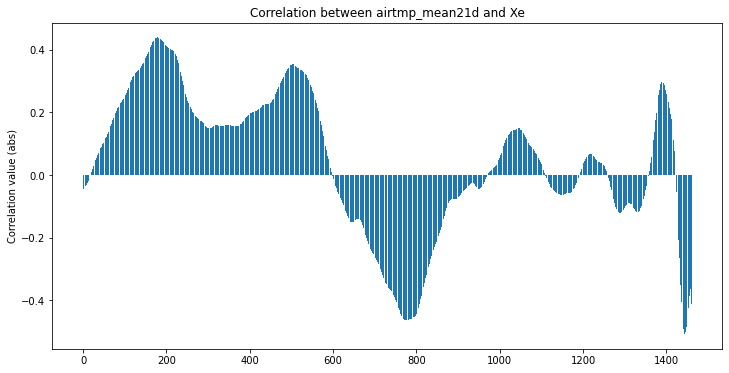

In [305]:
dico = dict()
dico["airtmp_mean21d"] = airmean

_, test, _, _ = compute_crosscorr(Xe, dico, index_mask)
plot_crosscor(test)

In [ ]:
forcings_mean = dict()
for field in forcings.keys():
    m = forcings[field].mean(axis=0)
    forcings_mean[field] = np.array([f-m for f in forcings[field]])

In [144]:
# Cross correlation between Xe and forcings' time series
ccor_laps_space_fgsm, ccor_laps_time_fgsm, _, _ = compute_crosscorr(Xe, forcings_mean, index_mask)

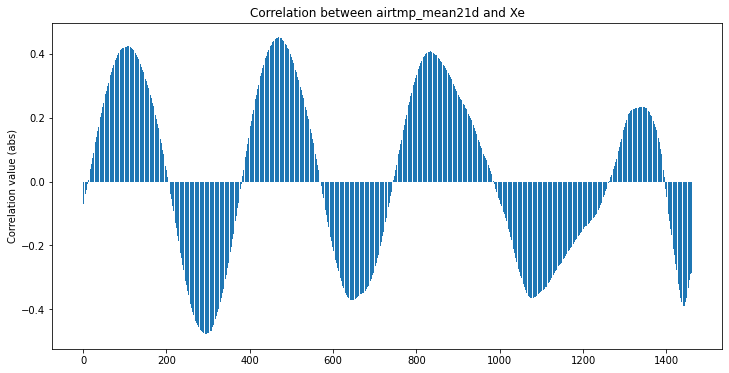

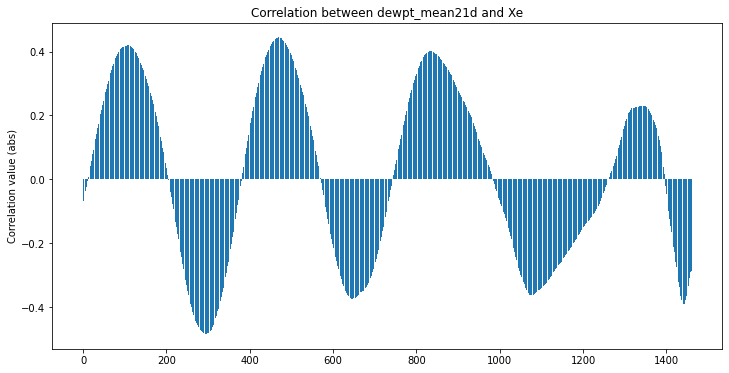

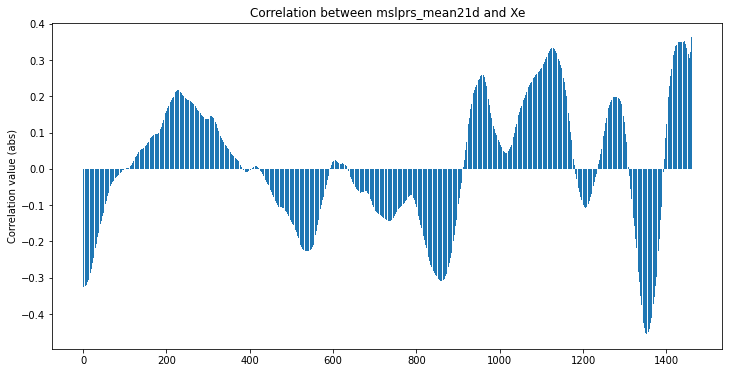

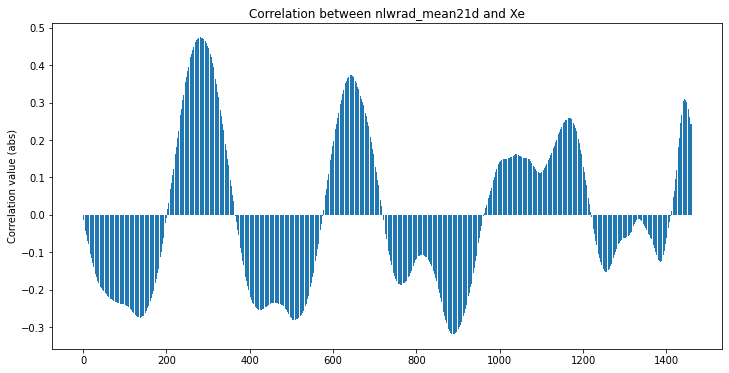

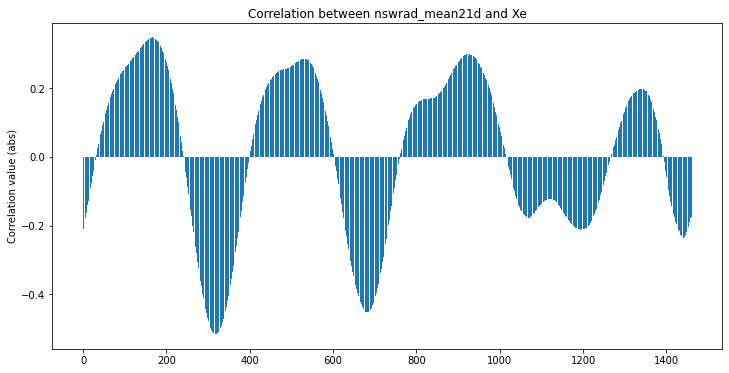

...

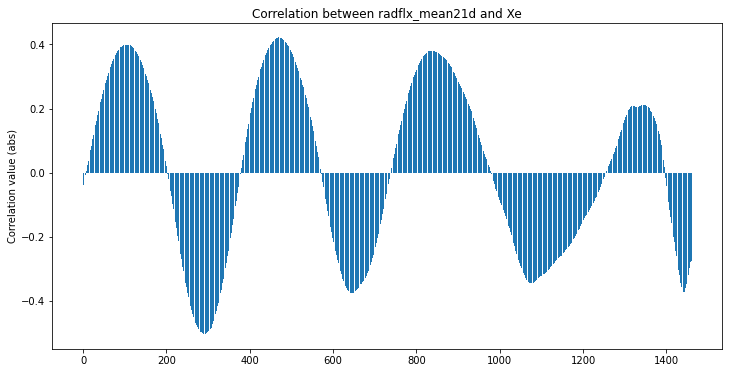

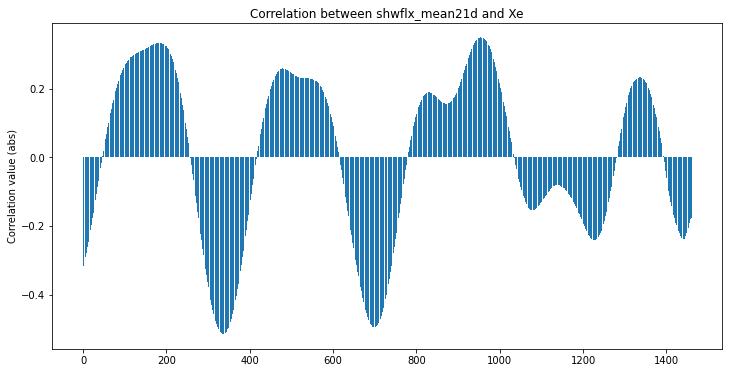

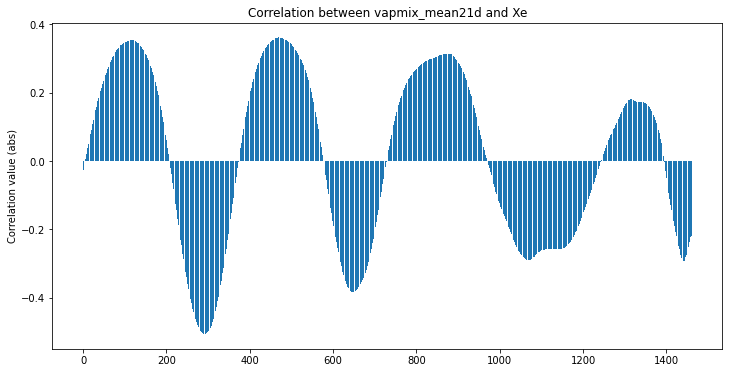

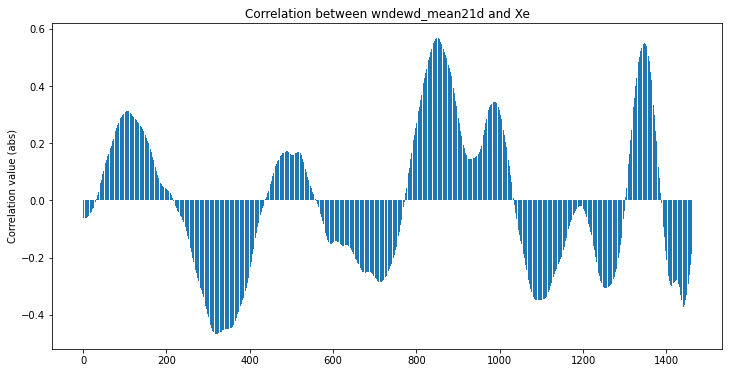

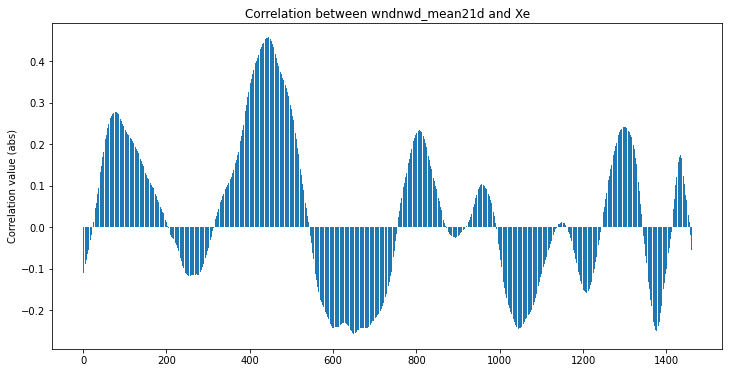

In [147]:
plot_crosscor(ccor_laps_time_fgsm)

In [165]:
forcings_mean2 = dict()
for field in forcings.keys():
    m1 = forcings[field].mean()
    forcings_mean2[field] = np.array(list(map(lambda x:x-m1, forcings[field])))

In [171]:
# Cross correlation between Xe and forcings' time series
_, test, _, _ = compute_crosscorr(Xe, forcings_mean2, index_mask)

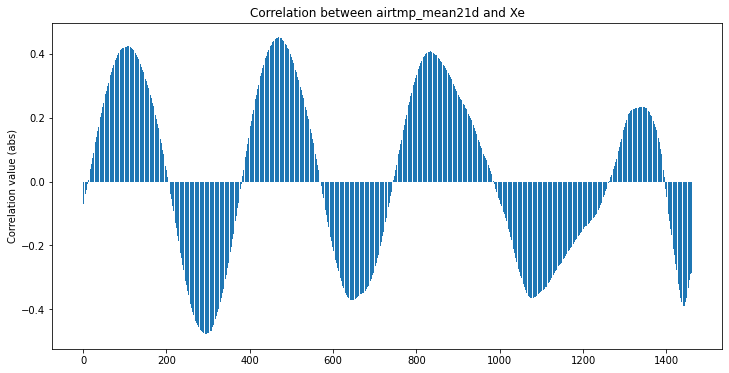

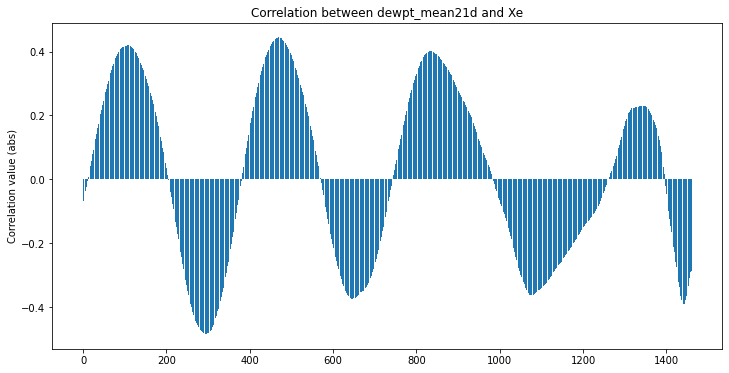

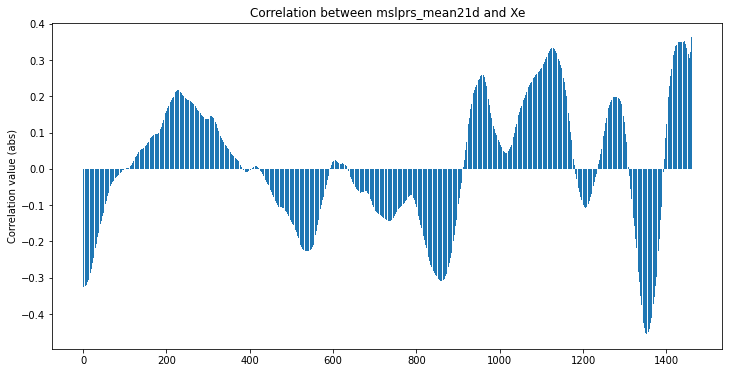

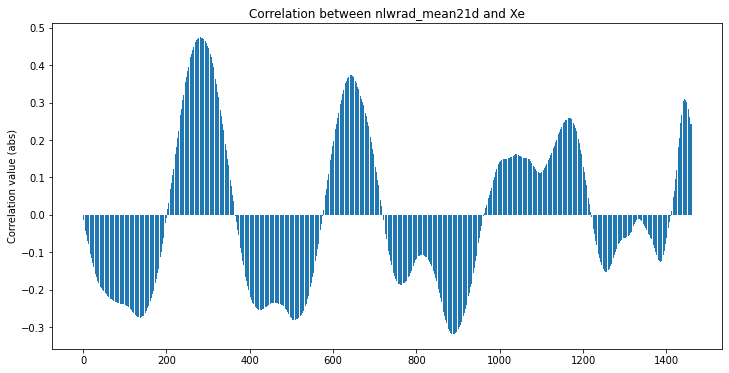

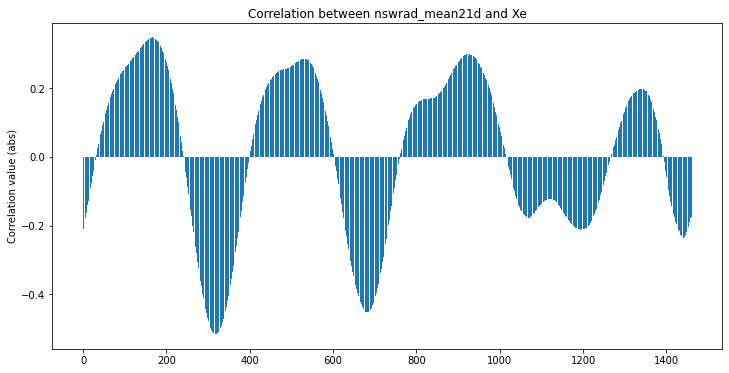

...

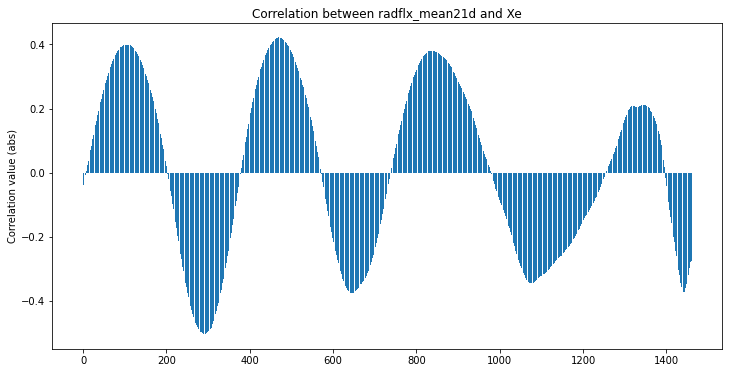

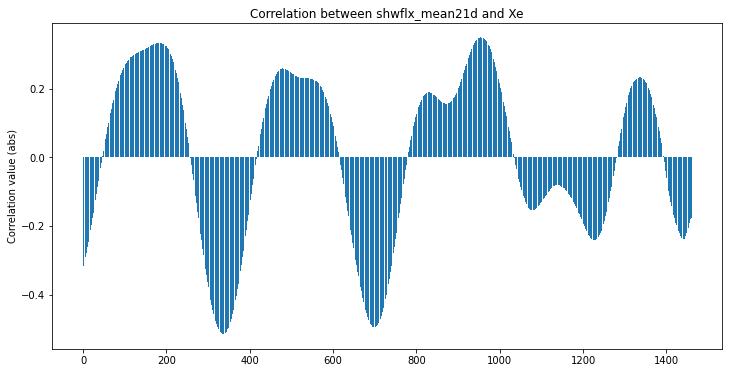

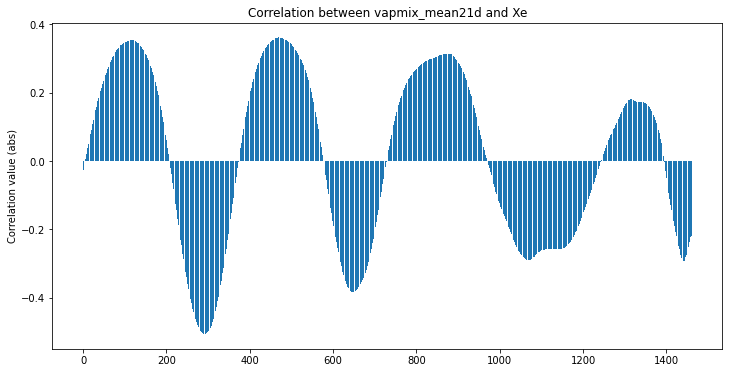

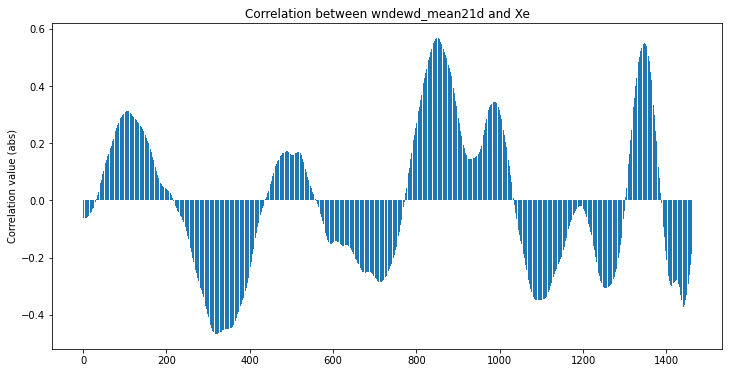

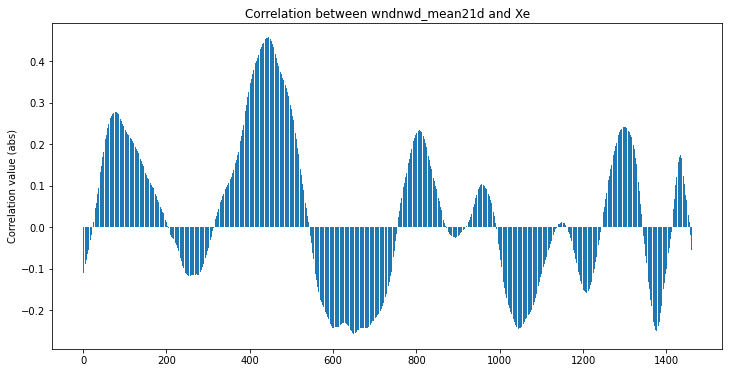

In [172]:
plot_crosscor(test)

In [ ]:
"""
def cross_corr2D(x):
    # Over axes (-2,-1) (default in the fft2 function)
    ## Pad because of cyclic (circular?) behavior of the FFT
    x = np.fft2(np.pad(x,([0,0],[0,0],[0,34],[0,34]),mode='constant'))

    # Conjugate for correlation, not convolution (Conv. Theorem)
    x[:,1,:,:] = np.conj(x[:,1,:,:])

    # Over axes (-2,-1) (default in the ifft2 function)
    ## Multiply elementwise over 2:nd axis (2 image bands for me)
    ### fftshift over rows and column over images
    corr = np.fft.fftshift(np.ifft2(np.prod(x,axis=1)),axes=(-2,-1))

    # Return after removing padding
    return np.abs(corr)[:,3:-2,3:-2]
"""

In [ ]:
# https://www.influxdata.com/time-series-analysis-methods/